In [1]:
%load_ext autoreload
%autoreload 2

import gc
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from config import DATA_DIR, PROJECT_ROOT, PROCESSED_DATAFRAMES_DIR
from notebook_utils.analysis import get_max_states
from notebook_utils.general import parse_active_space, read_npz
from notebook_utils.graphs import (
    plot_class_error_distribution, plot_exact_excitation_composition,
    plot_excitation_weight_scaling,
    plot_orbital_character_error_distribution,
    plot_orbital_character_conditioning,
    plot_point_group_eigenvalue_iqr,
    plot_hf_singles_error_scatter,
    plot_symmetry_eigenvalue_regression,
    show_scrollable_figs,
)
from notebook_utils.mat_fn import dimension_solve, get_Vr_dim, solve_energy_spin_dim
from notebook_utils.operators import get_excitation_percentages

sys.path.append(str(PROJECT_ROOT / "scripts"))
from script_utils import MOLECULE_NAMES, get_vqe_circuit, load_pyscf_mol, load_qibo_mol


SV_DATAFRAME_PATH = PROCESSED_DATAFRAMES_DIR / "sv_qse_data.pkl"
ORBITAL_CHARACTER_PATH = PROCESSED_DATAFRAMES_DIR / "Orbital_Character.csv"
QSE_STATE_MATRICES_DIR = DATA_DIR / "raw_matrices" / "qse_state_matrices"

In [2]:
df_uccsd = pd.read_pickle(SV_DATAFRAME_PATH).query("ansatz == 'UCCSD'").copy()
df_orbital_character = pd.read_csv(ORBITAL_CHARACTER_PATH)

In [3]:
TRIPLET_SECTORS = ("0", "p1", "m1")
STATE_LABELS = [f"s{root}" for root in range(11)] + [f"t{root}" for root in range(1, 11)]
METRIC_COLUMNS = [
    f"{state}_{metric}"
    for state in STATE_LABELS
    for metric in ("error", "projection", "spin_contamination")
]


def load_qse_state_matrices(path):
    qse_state_matrices = {}

    for file in sorted(path.rglob("*_UCCSD.npz")):
        row = read_npz(file)
        key = (row["molecule"], row["active_space"], row["ansatz"], row["expansion"])
        qse_state_matrices[key] = np.asarray(row["qse_state_matrix"], dtype=float)

    return qse_state_matrices


def project_exact_roots(qse_subspace, exact_pvec):
    projections = {}

    for root, pvec in exact_pvec.items():
        pvec = np.asarray(pvec, dtype=complex)
        pvec /= np.linalg.norm(pvec)
        projections[root] = float(np.sum(np.abs(qse_subspace.conj().T @ pvec) ** 2))

    return projections


def group_triplet_energies(energies):
    sector_energies = np.asarray(energies, dtype=float).reshape(-1, 3)
    return sector_energies.mean(axis=1).tolist(), np.ptp(sector_energies, axis=1).tolist()


def group_triplet_projections(projections):
    sector_projections = np.asarray([
        [projections[f"{root}_{sector}"] for sector in TRIPLET_SECTORS]
        for root in range(len(projections) // 3)
    ])
    grouped = {str(root): float(value) for root, value in enumerate(sector_projections.mean(axis=1))}
    splittings = {f"t{root + 1}": float(value) for root, value in enumerate(np.ptp(sector_projections, axis=1))}
    return grouped, splittings


def get_spin_contamination(spin_values, expansion):
    spin_values = np.asarray(spin_values, dtype=float)

    if expansion == "singlet":
        return np.abs(spin_values).tolist()

    return np.max(np.abs(spin_values.reshape(-1, 3) - 2.0), axis=1).tolist()


qse_state_matrices = load_qse_state_matrices(QSE_STATE_MATRICES_DIR)

In [4]:
def solve_subspace_row(row):
    num_e, num_o = parse_active_space(row["active_space"])
    singlet_dim, triplet_dim = get_max_states((num_e, num_o))
    dim = {"singlet": singlet_dim, "triplet": triplet_dim}[row["expansion"]]

    spin_matrix = np.asarray(row["S2"])
    has_spin_data = spin_matrix.ndim == 2

    if has_spin_data:
        qse_energies, qse_wfn, spin_values = solve_energy_spin_dim(
            row["H"], row["S"], spin_matrix, min(dim, row["S"].shape[0])
        )
        full_spin_values = np.asarray(spin_values, dtype=float).tolist()
        full_spin_contamination = get_spin_contamination(spin_values, row["expansion"])
    else:
        qse_energies, orthogonal_wfn = dimension_solve(
            row["H"], row["S"], min(dim, row["S"].shape[0])
        )
        qse_wfn = get_Vr_dim(row["S"], min(dim, row["S"].shape[0])) @ orthogonal_wfn
        full_spin_values = np.nan
        full_spin_contamination = np.nan

    key = (row["molecule"], row["active_space"], row["ansatz"], row["expansion"])
    qse_subspace = qse_state_matrices[key] @ qse_wfn
    exact_qse_projection = project_exact_roots(qse_subspace, row["pyscf_casci_pvec"])
    energy_splittings = []
    projection_splittings = {}

    if row["expansion"] == "triplet":
        qse_energies, energy_splittings = group_triplet_energies(qse_energies)
        exact_qse_projection, projection_splittings = group_triplet_projections(exact_qse_projection)
        prefix, start = "t", 1
        exact_energies = row["pyscf_casci_energies"][:10]
        matched_qse_energies = qse_energies[:5]
    else:
        prefix, start = "s", 0
        exact_energies = row["pyscf_casci_energies"][:11]
        matched_qse_energies = qse_energies[:6]

    root_metrics = {column: np.nan for column in METRIC_COLUMNS}
    for root_index, exact_energy in enumerate(exact_energies):
        root = f"{prefix}{root_index + start}"
        has_qse_root = root_index < len(matched_qse_energies)

        root_metrics[f"{root}_error"] = (
            1000 * abs(matched_qse_energies[root_index] - exact_energy)
            if has_qse_root else np.nan
        )
        root_metrics[f"{root}_projection"] = exact_qse_projection[str(root_index)]
        if has_spin_data and has_qse_root:
            root_metrics[f"{root}_spin_contamination"] = full_spin_contamination[root_index]

    return pd.Series({
        "qse_energies": qse_energies,
        "full_spin_values": full_spin_values,
        "full_spin_contamination": full_spin_contamination,
        "qse_subspace": qse_subspace,
        "exact_qse_projection": exact_qse_projection,
        "energy_splittings": energy_splittings,
        "projection_splittings": projection_splittings,
        **root_metrics,
    })


RESULT_COLUMNS = [
    "qse_energies", "full_spin_values", "full_spin_contamination",
    "qse_subspace", "exact_qse_projection", "energy_splittings",
    "projection_splittings", *METRIC_COLUMNS,
]


df_uccsd[RESULT_COLUMNS] = df_uccsd.apply(solve_subspace_row, axis=1)

In [5]:
df_uccsd

,molecule,active_space,ansatz,expansion,H,S,qse_dim,S2,pyscf_casci_energies,pyscf_casci_pvec,...,t7_spin_contamination,t8_error,t8_projection,t8_spin_contamination,t9_error,t9_projection,t9_spin_contamination,t10_error,t10_projection,t10_spin_contamination
8,Acetamide,2e2o,UCCSD,singlet,"[[(-802.566868206377+0j), (-4.71630877716983+0...","[[(3.9097067555916256+0j), (0.0229713600038418...",4,"[[(1.3572476476042539e-14+0j), (-1.73472347597...","[-205.2944990546729, -204.82581813267245, -204...","{'0': [-0.15005468780119358, 0.0, -0.006284675...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Acetamide,2e2o,UCCSD,triplet,"[[(-0.008102858545485897+0j), 0j, 0j, (0.19342...","[[(3.9511770389411005e-05+0j), 0j, 0j, (-0.000...",12,"[[(7.902354077565787e-05+0j), 0j, 0j, (-0.0018...",[-205.07455033363988],"{'0_0': [1.2772011986346633e-16, 0.0, -0.70710...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,Acetamide,2e3o,UCCSD,singlet,"[[(-802.3503588733338+0j), (-4.181069817298265...","[[(3.908651992555033+0j), (0.02036442538893076...",9,"[[(6.686318165805005e-14+0j), (8.8514942988074...","[-205.29505576938712, -204.82643006426792, -20...","{'0': [-0.020547278478527786, 0.0, -4.80129269...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,Acetamide,2e3o,UCCSD,triplet,"[[(-0.006366527649907687+0j), 0j, 0j, (0.17089...","[[(3.104494262964885e-05+0j), 0j, 0j, (-0.0008...",27,"[[(6.208988525377435e-05+0j), 0j, 0j, (-0.0016...","[-205.07455033363988, -204.783906010148, -204....","{'0_0': [-3.2287888474718915e-17, 0.0, 1.67570...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,Acetamide,4e3o,UCCSD,singlet,"[[(-820.857367607957+0j), 0j, 0j, 0j, (-802.46...","[[(3.998438211569522+0j), 0j, 0j, 0j, (3.90886...",9,"[[(6.858402734621905e-14+0j), 0j, 0j, 0j, (5.1...","[-205.29475046760797, -205.0875054310897, -204...","{'0': [0.019759421927367342, 0.0, 1.4124907295...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2487,Uracil,6e7o,UCCSD,singlet,"[[(-1627.476077298132+0j), (-4.154111452293707...","[[(3.9975225999374695+0j), (1.020452772569084e...",49,"[[(7.793617922232423e-07+0j), (4.5939916601242...","[-407.1217893032012, -406.8899384534136, -406....","{'0': [-3.766048443158923e-05, 0.0, 8.99239694...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2488,Uracil,6e7o,UCCSD,triplet,"[[(-0.11042245041486087+0j), 0j, 0j, (-6.37046...","[[(0.0002718226282586167+0j), 0j, 0j, (1.56773...",147,"[[(0.0005436414375037656+0j), 0j, 0j, (3.13543...","[-406.95689685600695, -406.90419213472666, -40...","{'0_0': [-3.919148314149759e-08, 0.0, -3.51006...",...,NaN,NaN,0.748854,NaN,NaN,0.849352,NaN,NaN,0.022528,NaN
2489,Uracil,8e7o,UCCSD,singlet,"[[(-1627.9179451613252+0j), (0.151178922494367...","[[(3.998609492626249+0j), (-0.0003714519947059...",49,"[[(7.043982743019104e-07+0j), (3.4870941333265...","[-407.1214804205012, -406.94605481069067, -406...","{'0': [-2.3296044344376372e-06, 0.0, -8.024116...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2490,Uracil,8e7o,UCCSD,triplet,"[[(-0.05217935944762317+0j), 0j, 0j, (-0.01252...","[[(0.00012840277216497054+0j), 0j, 0j, (3.0821...",147,"[[(0.0002567898781715119+0j), 0j, 0j, (6.16475...","[-406.96118398246017, -406.95666451956214, -40...","{'0_0': [-1.949602093463748e-15, 0.0, -4.70314...",...,NaN,NaN,0.992116,NaN,NaN,0.518721,NaN,NaN,0.066697,NaN



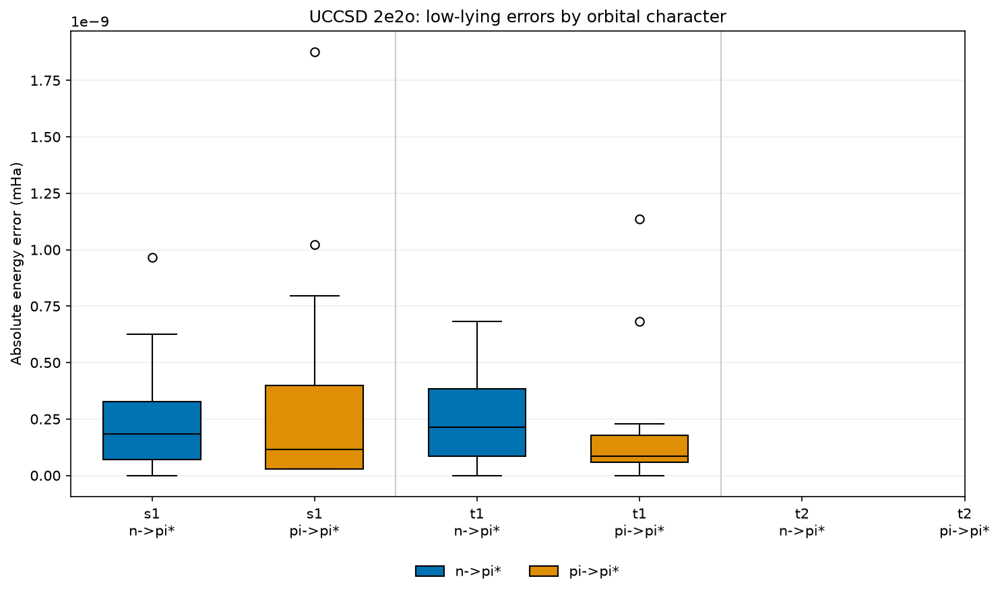
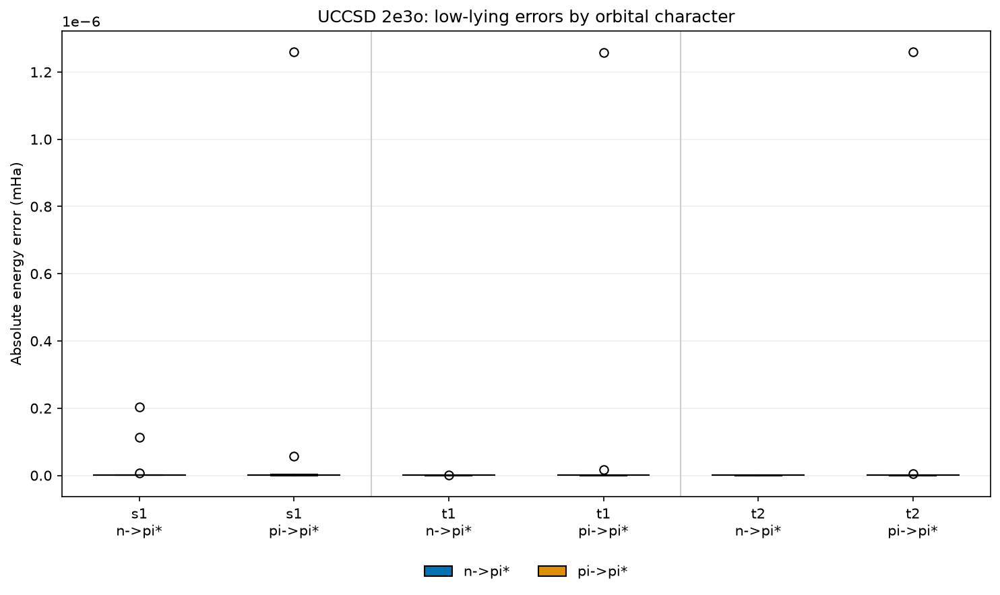
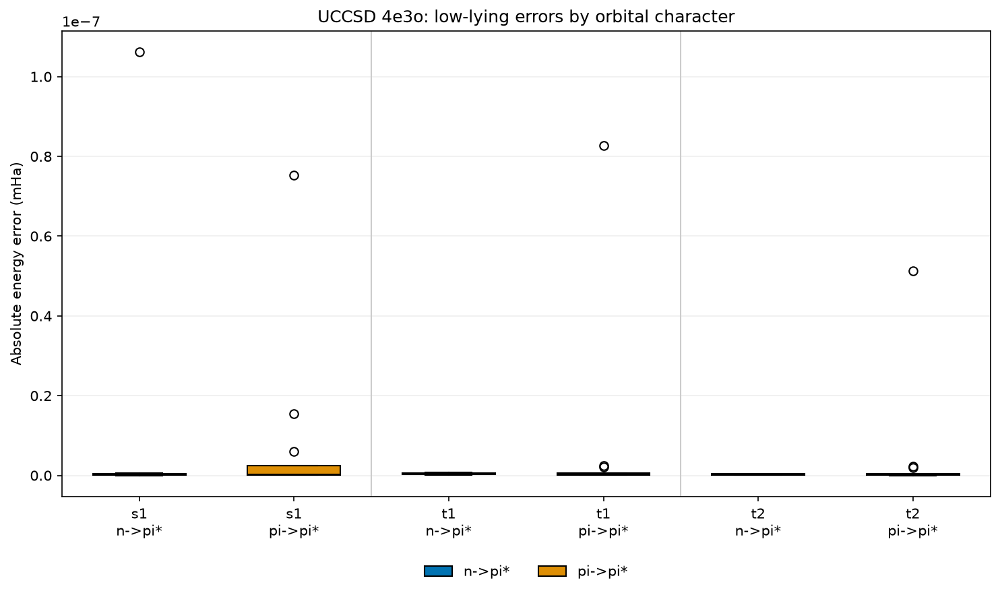
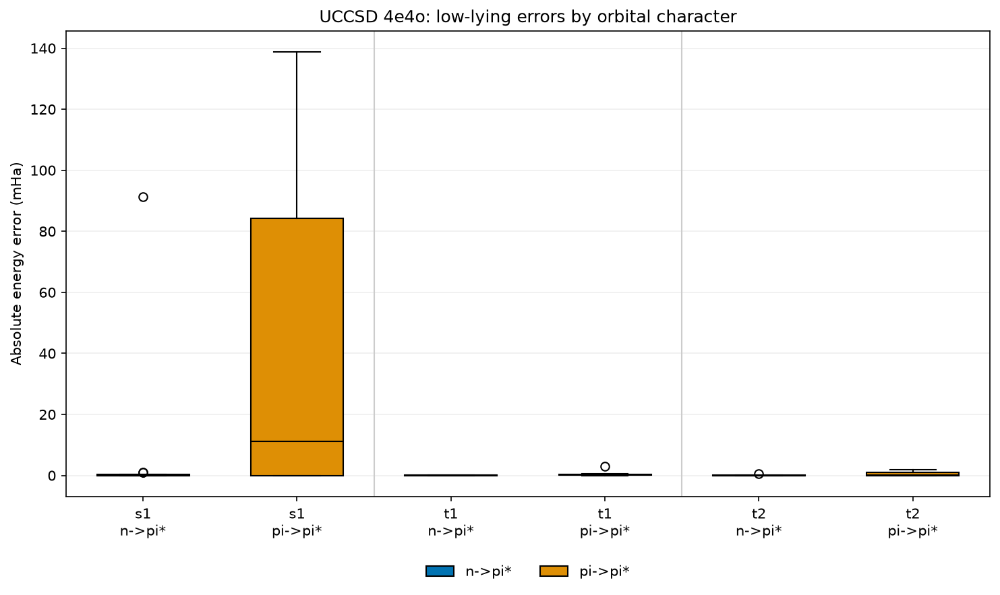
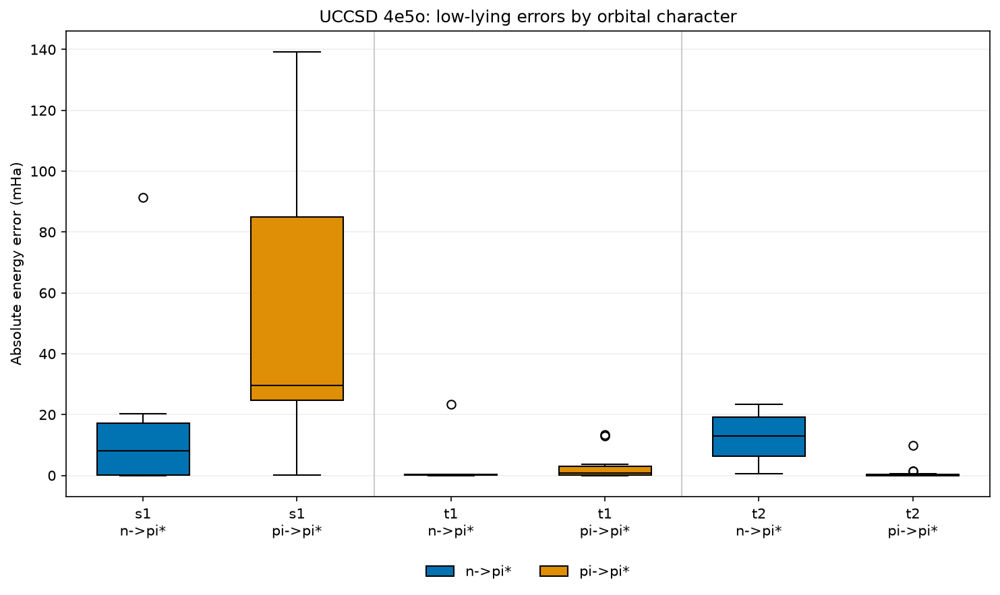
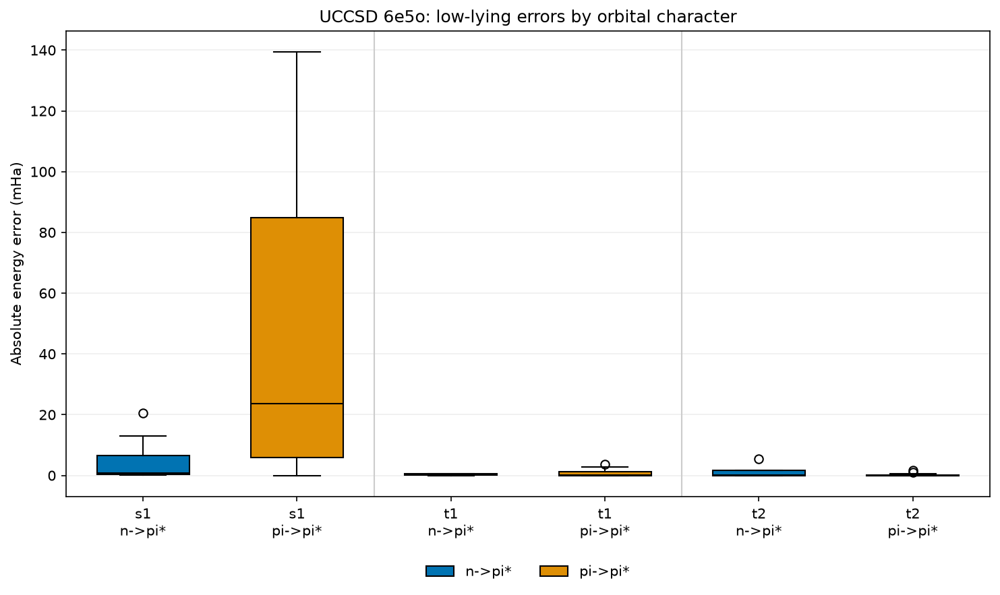
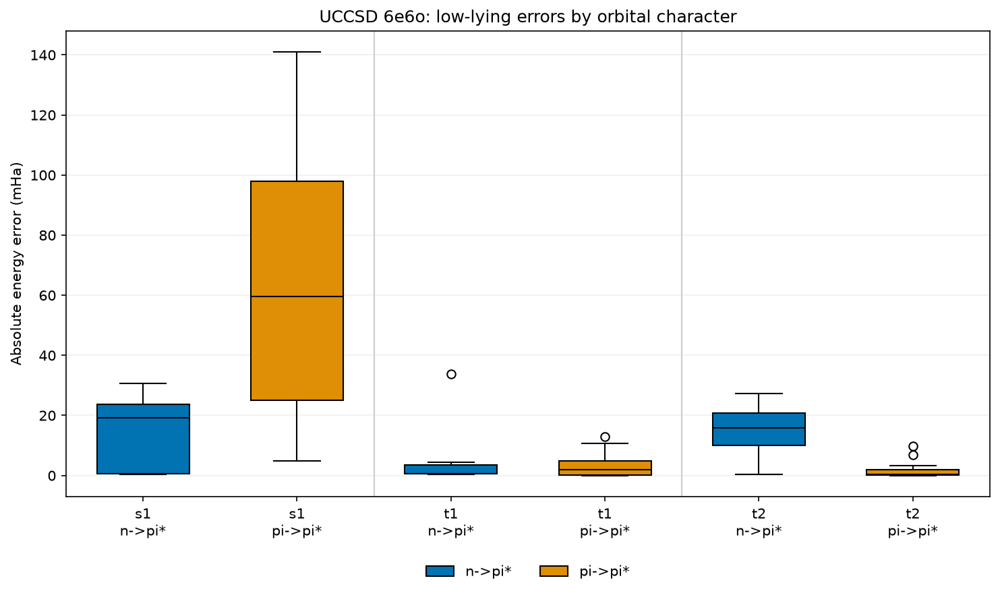
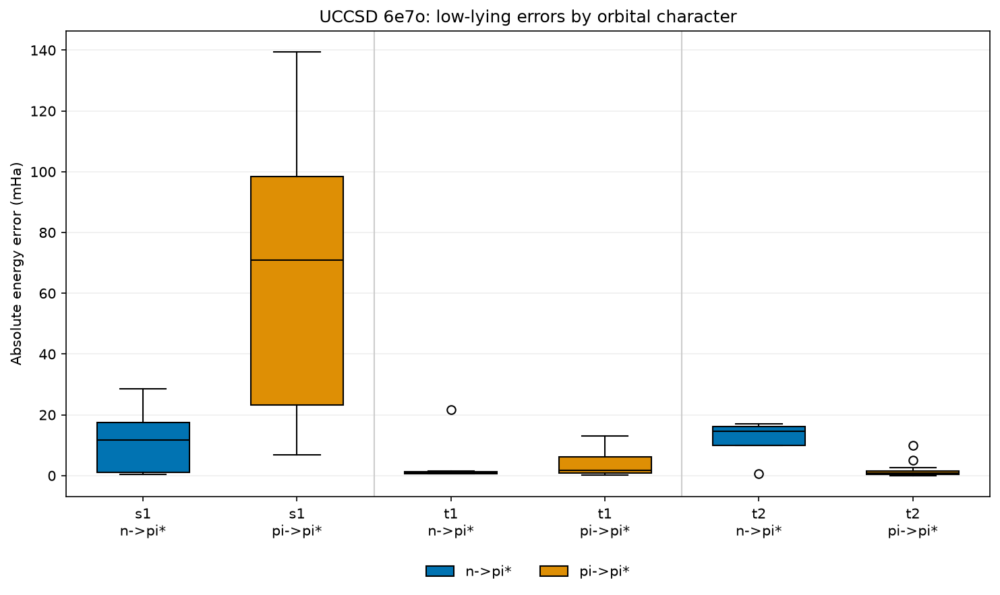
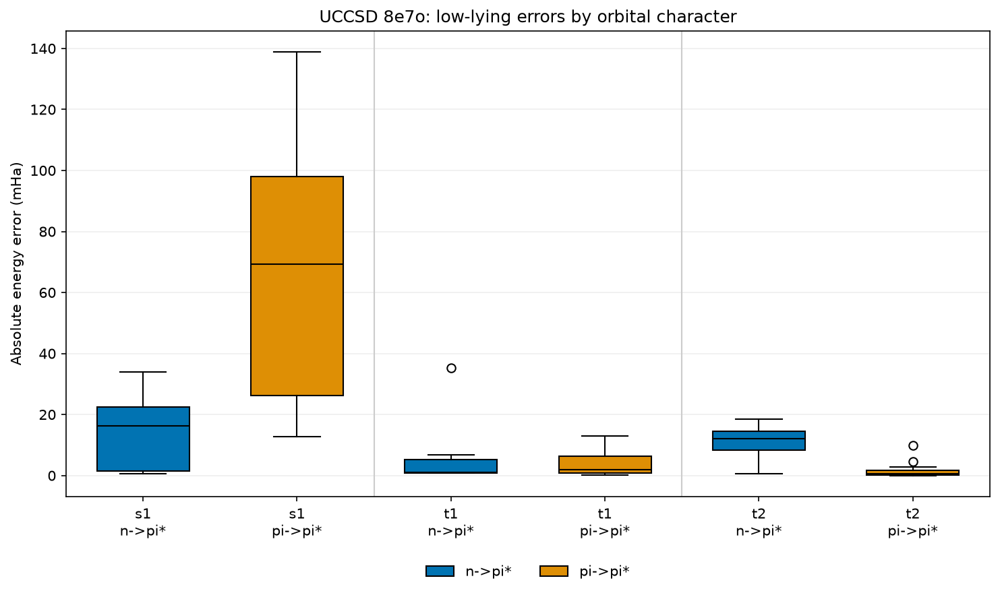
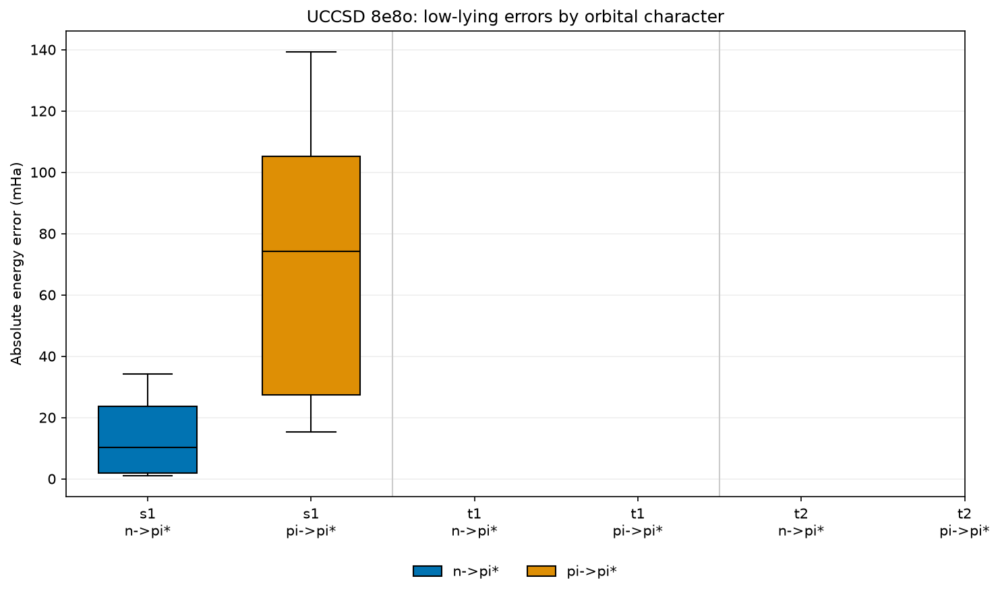

In [6]:
STATE_TRANSITION_COLUMNS = {
    "s1": ("singlet", "S1_Orb"),
    "t1": ("triplet", "T1_Orb"),
    "t2": ("triplet", "T2_Orb"),
}
TRANSITIONS = ["n->pi*", "pi->pi*"]


df_orbital_errors = df_uccsd.merge(
    df_orbital_character, left_on="molecule", right_on="Molecule", validate="many_to_one"
)
active_spaces = sorted(df_uccsd["active_space"].unique(), key=parse_active_space)
orbital_character_error_data = {}

for active_space in active_spaces:
    df_active = df_orbital_errors[df_orbital_errors["active_space"] == active_space]
    orbital_character_error_data[active_space] = {}

    for state, (expansion, transition_column) in STATE_TRANSITION_COLUMNS.items():
        df_state = df_active[df_active["expansion"] == expansion]
        orbital_character_error_data[active_space][state] = {
            transition: df_state.loc[
                df_state[transition_column] == transition, f"{state}_error"
            ].dropna().to_numpy()
            for transition in TRANSITIONS
        }


orbital_character_figures = [
    plot_orbital_character_error_distribution(orbital_character_error_data[active_space], active_space)
    for active_space in active_spaces
]
show_scrollable_figs(orbital_character_figures)


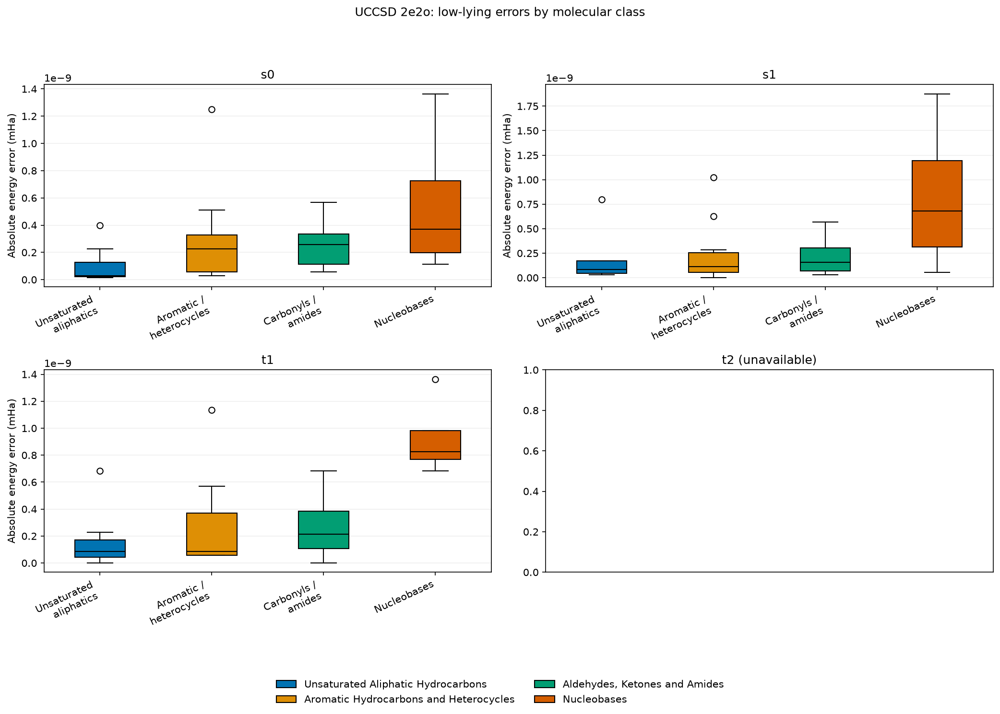
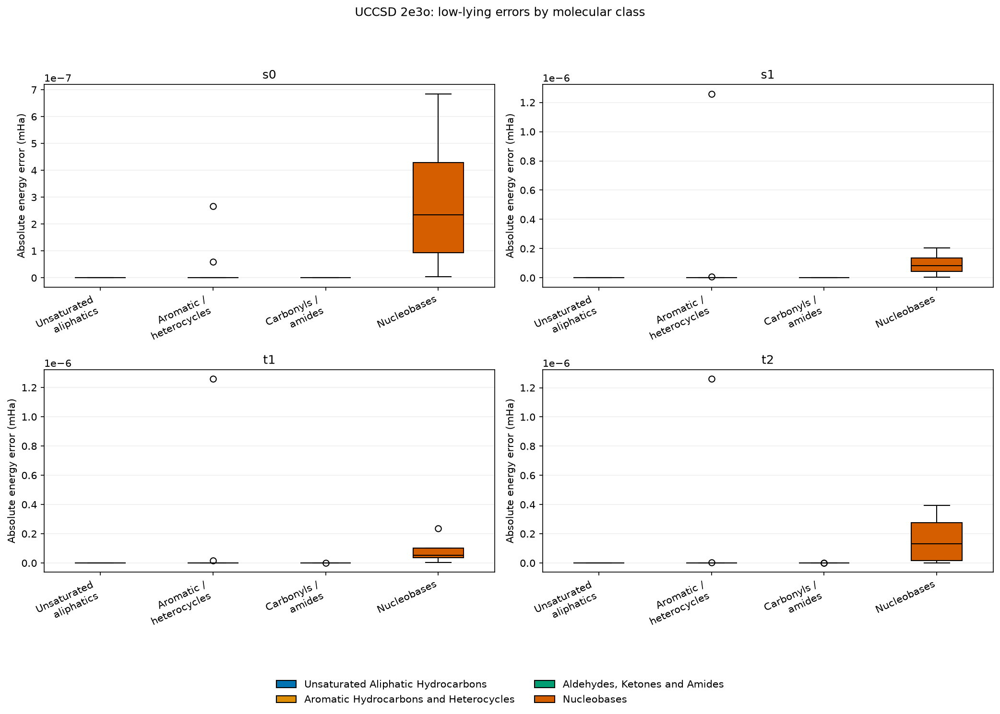
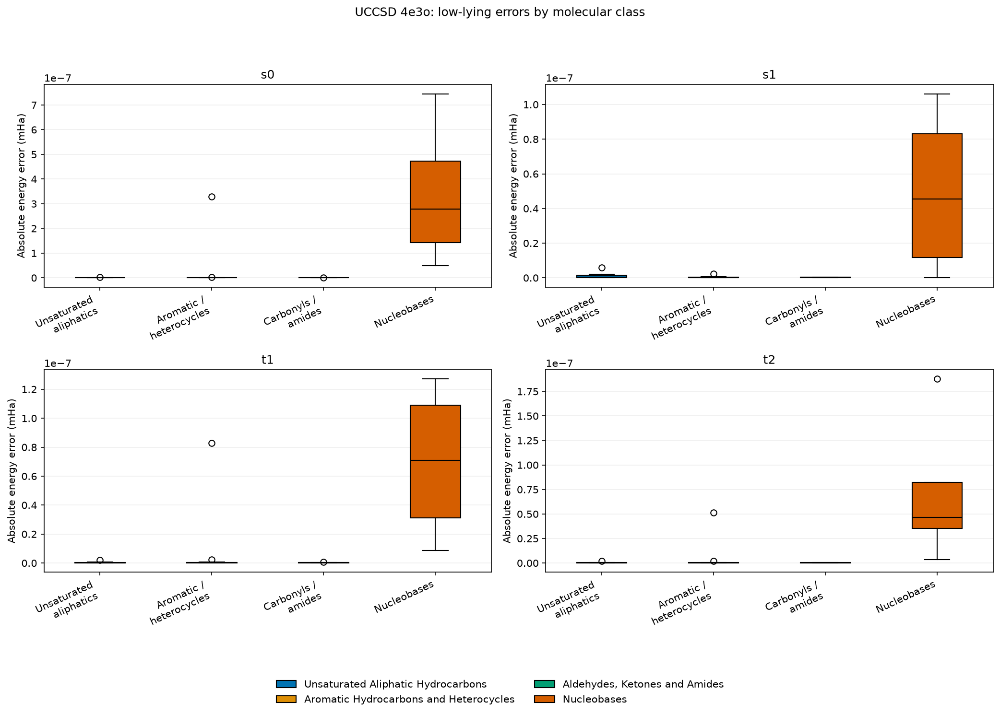
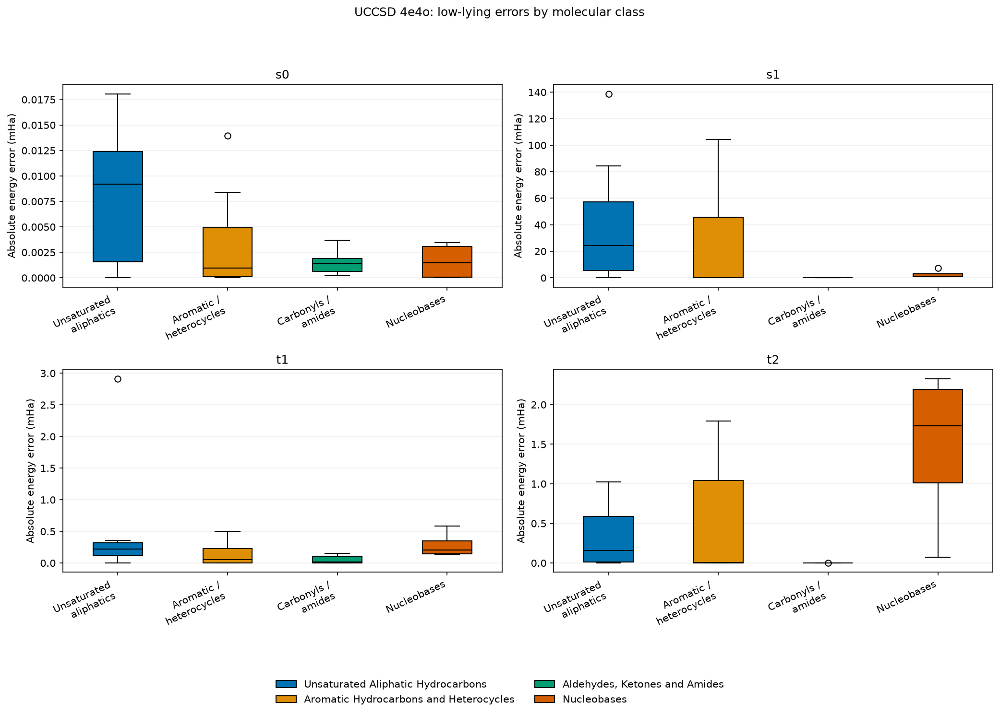
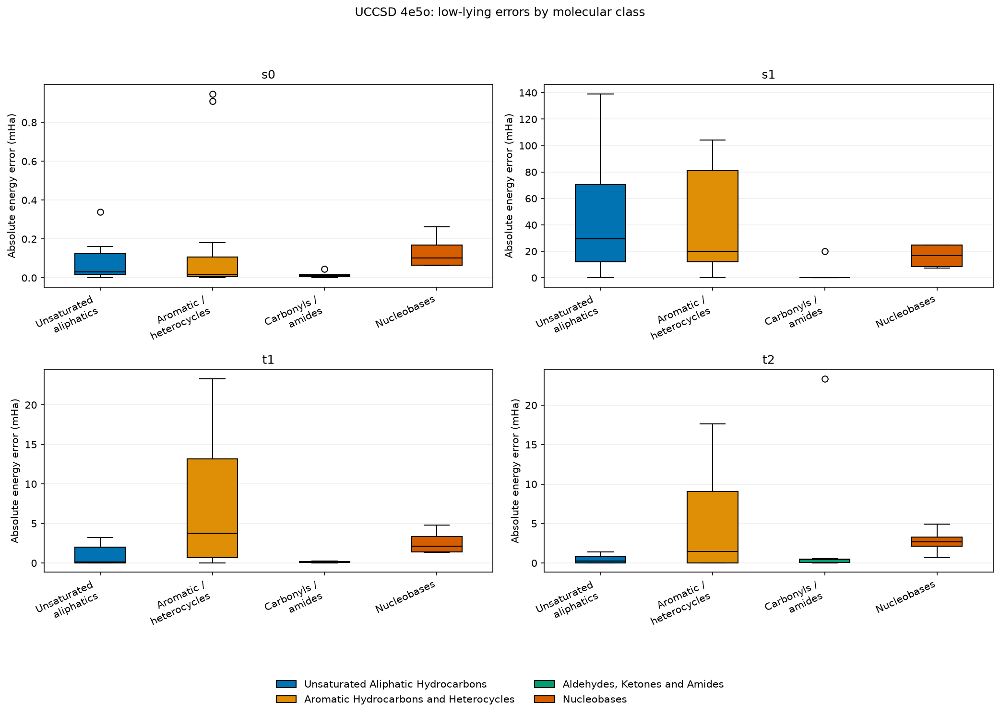
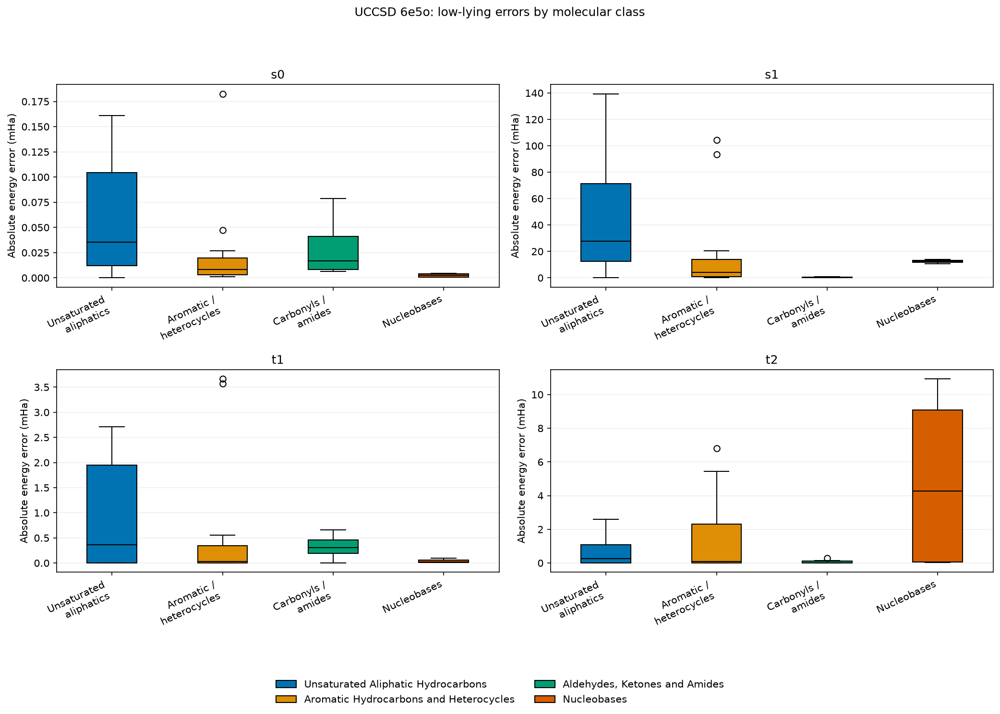
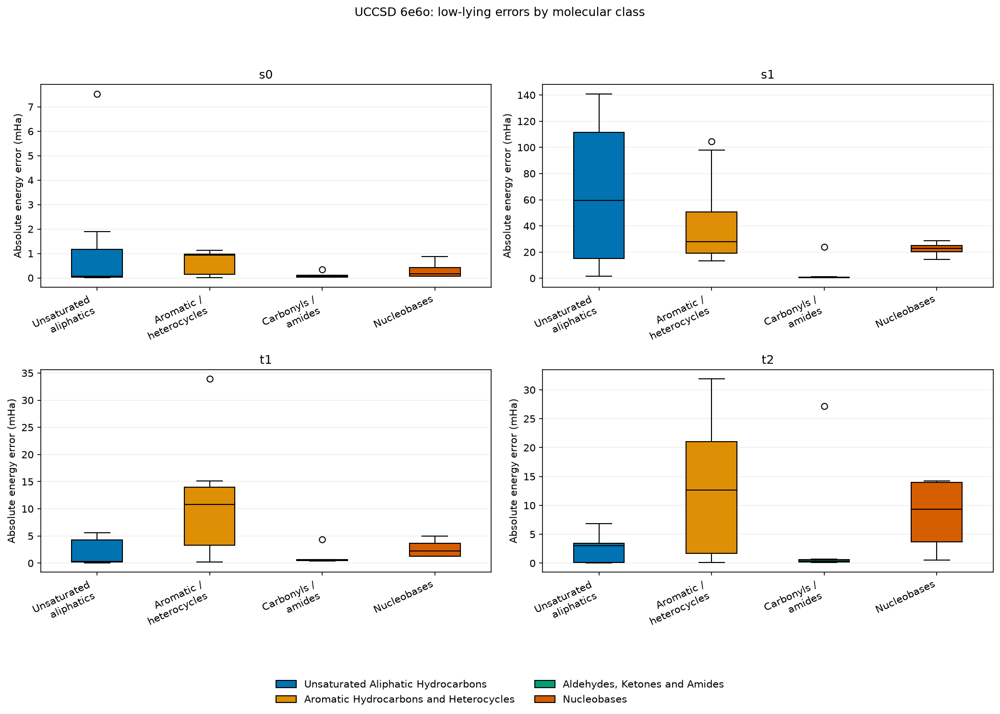
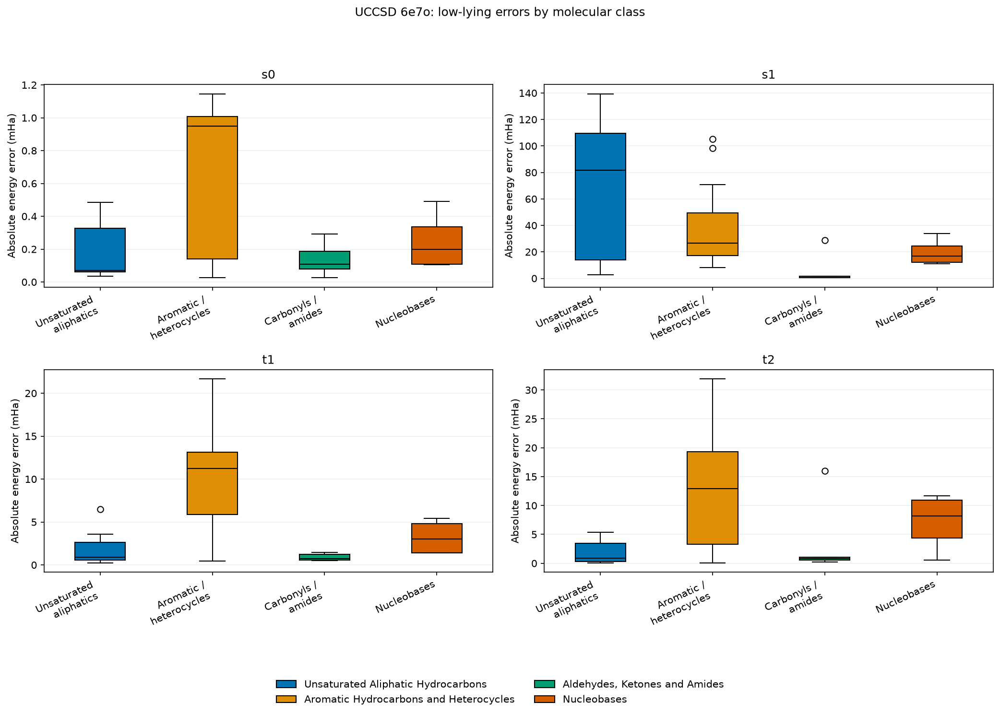
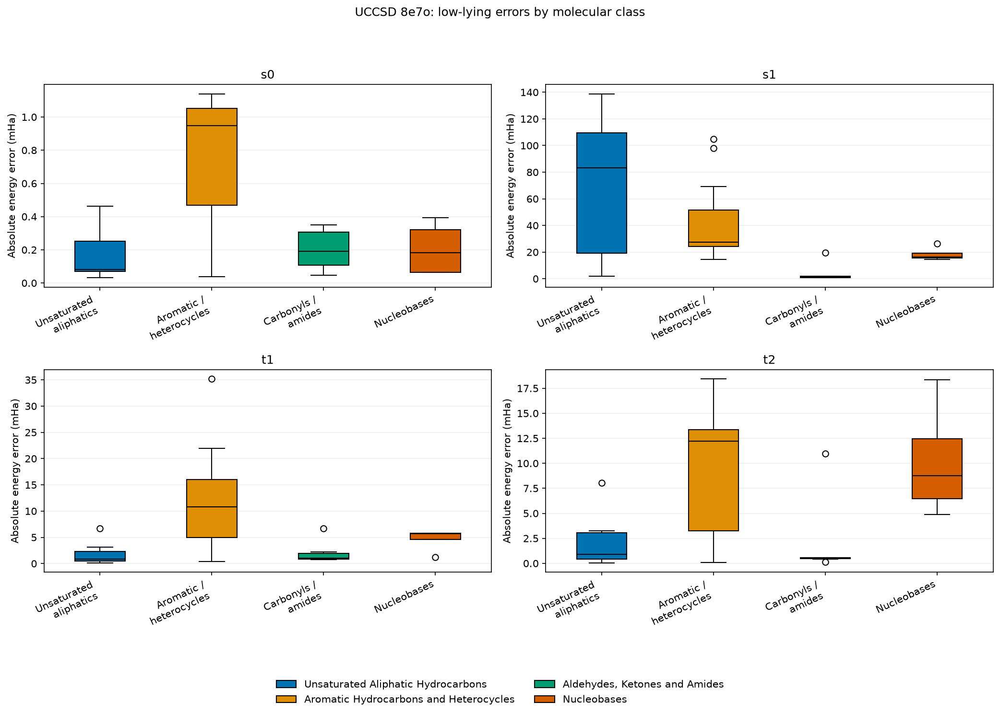
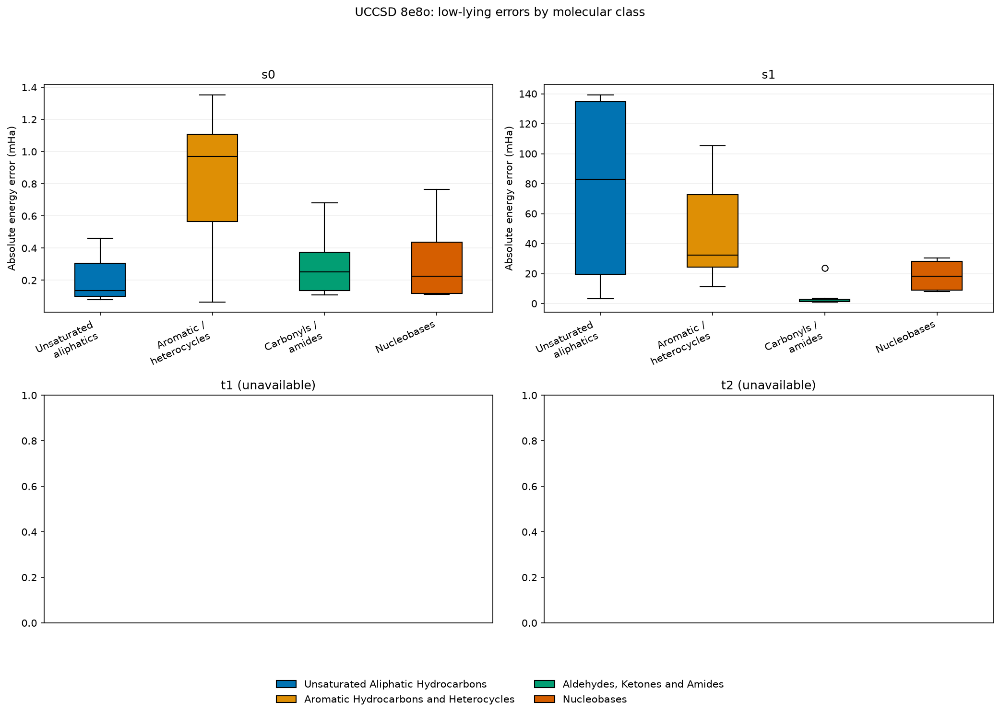

In [7]:
STATE_EXPANSIONS = {
    "s0": "singlet", "s1": "singlet",
    "t1": "triplet", "t2": "triplet",
}
CLASS_ORDER = df_orbital_character["Class"].drop_duplicates().tolist()
class_error_data = {}

for active_space in active_spaces:
    df_active = df_orbital_errors[df_orbital_errors["active_space"] == active_space]
    class_error_data[active_space] = {}

    for state, expansion in STATE_EXPANSIONS.items():
        df_state = df_active[df_active["expansion"] == expansion]
        class_error_data[active_space][state] = {
            class_name: df_state.loc[
                df_state["Class"] == class_name, f"{state}_error"
            ].dropna().to_numpy()
            for class_name in CLASS_ORDER
        }

class_error_figures = [
    plot_class_error_distribution(class_error_data[active_space], active_space)
    for active_space in active_spaces
]
show_scrollable_figs(class_error_figures)


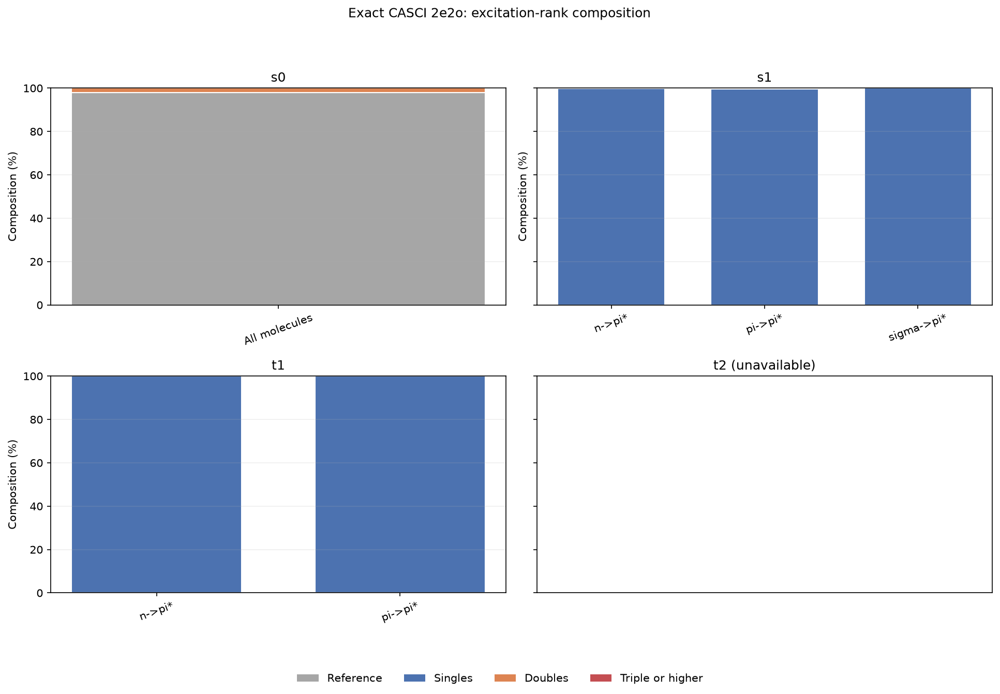
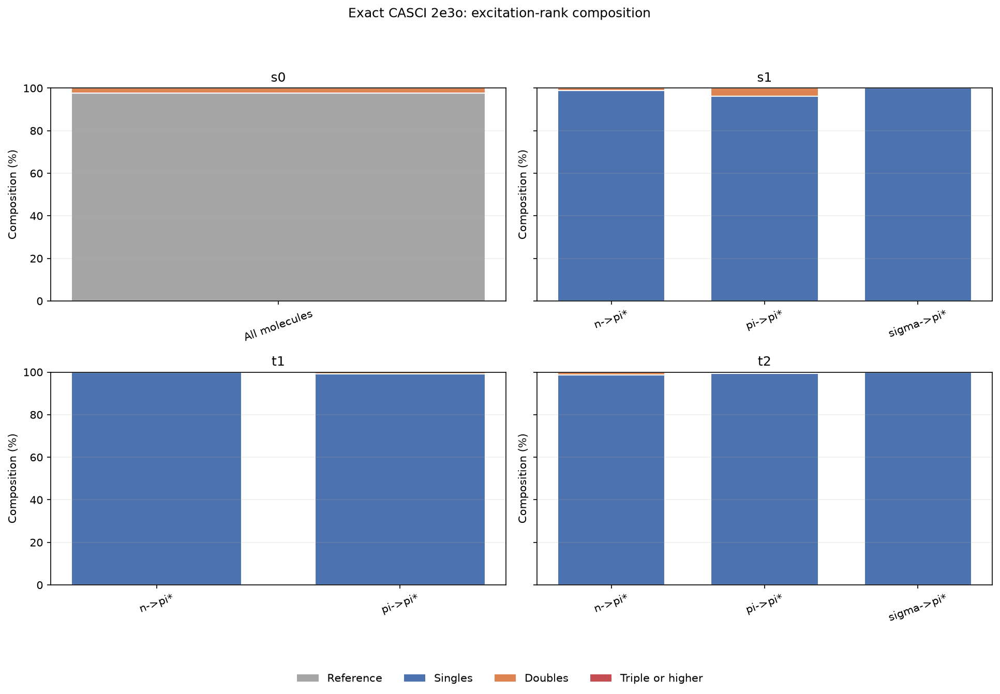
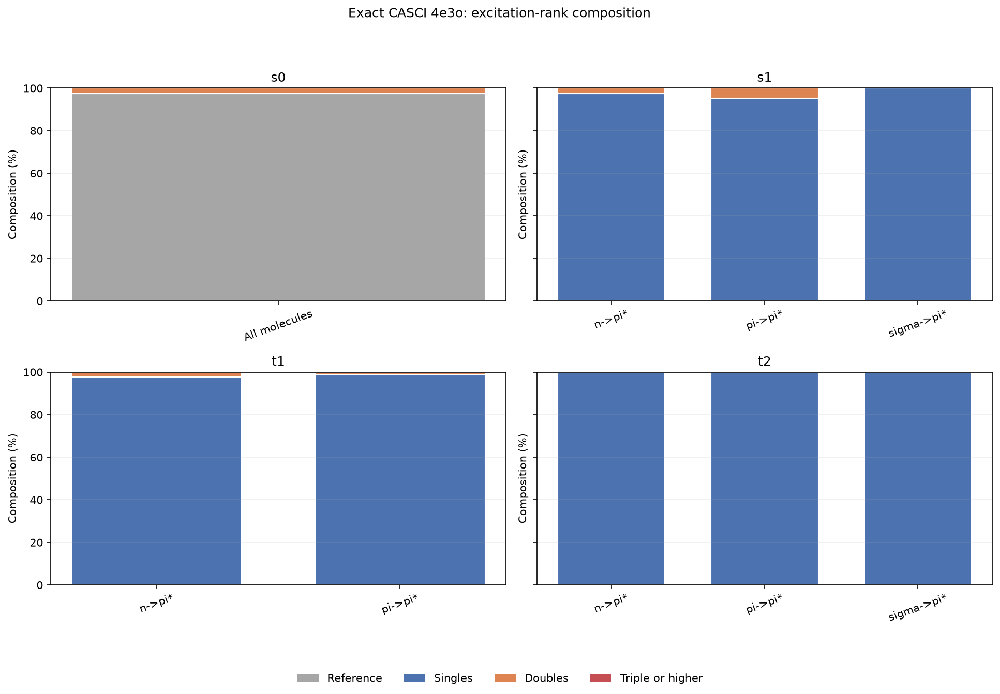
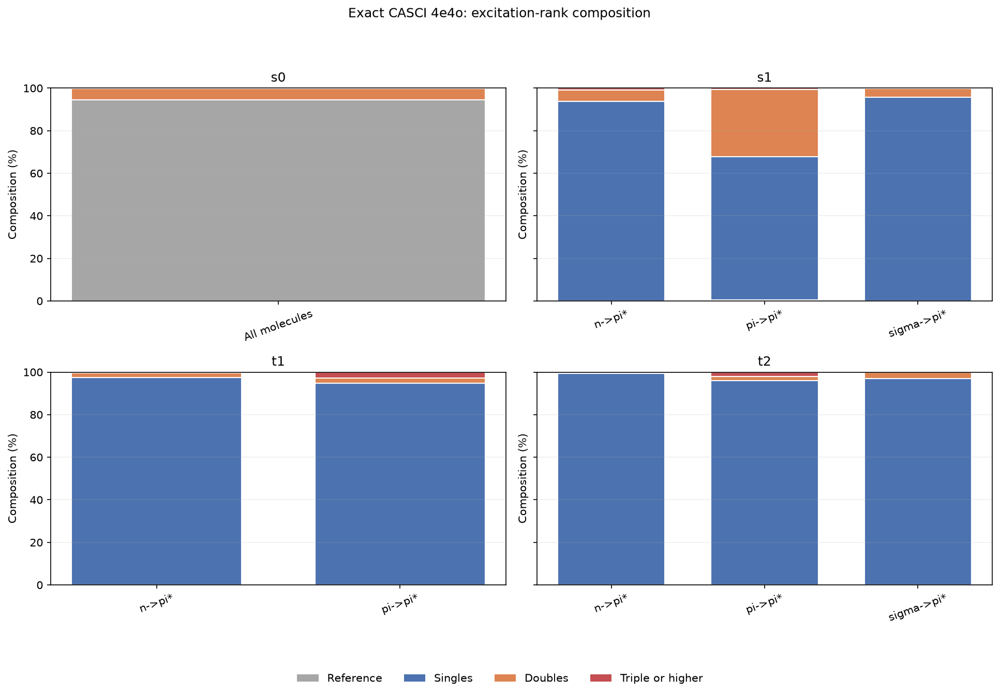
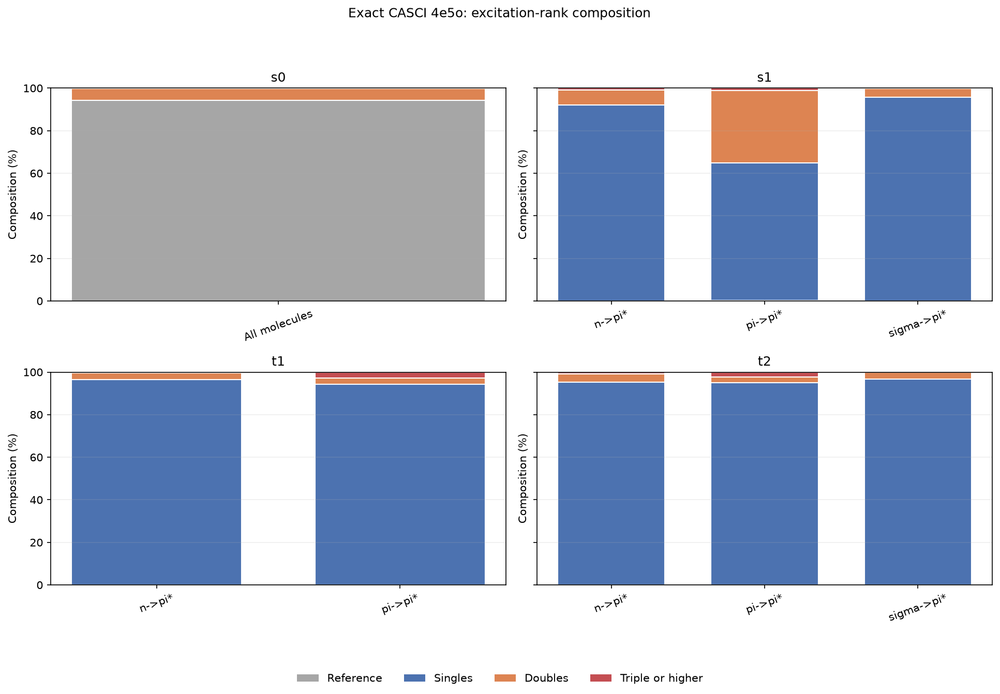
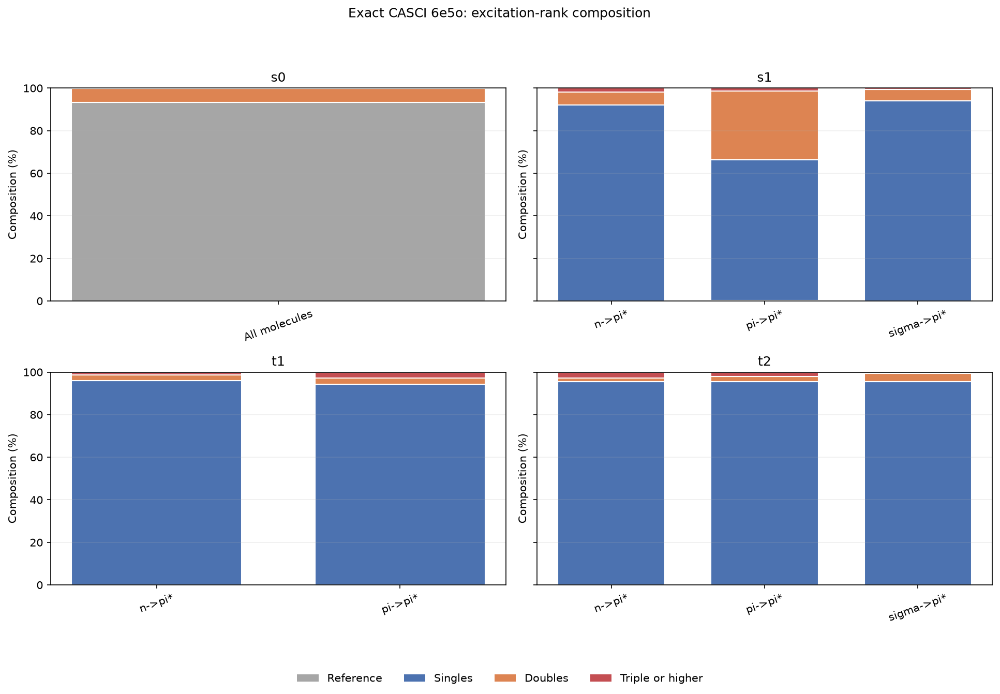
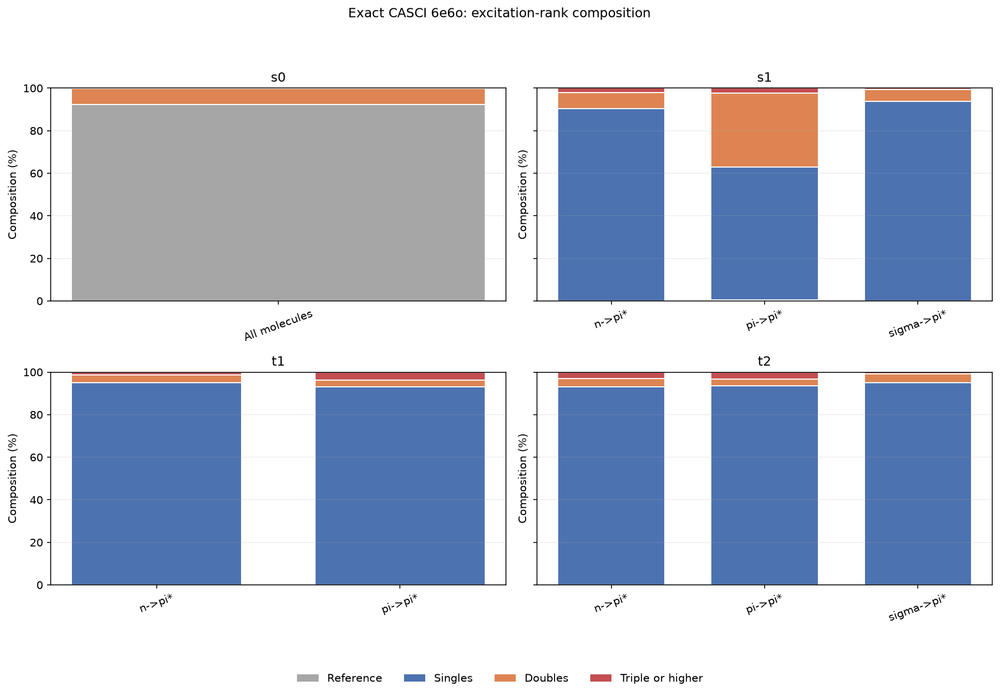
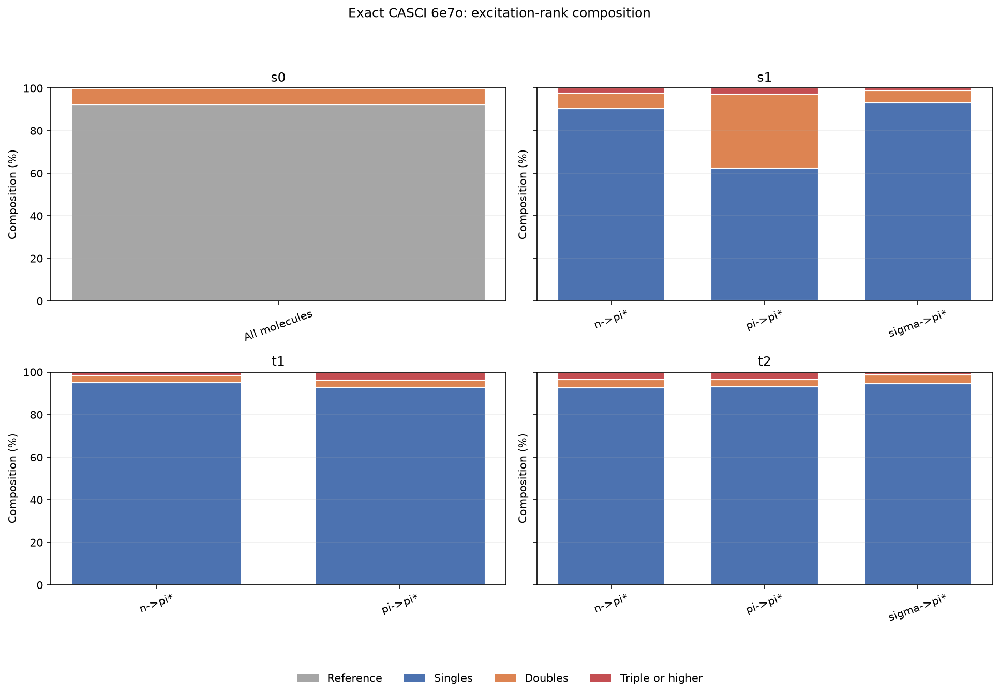
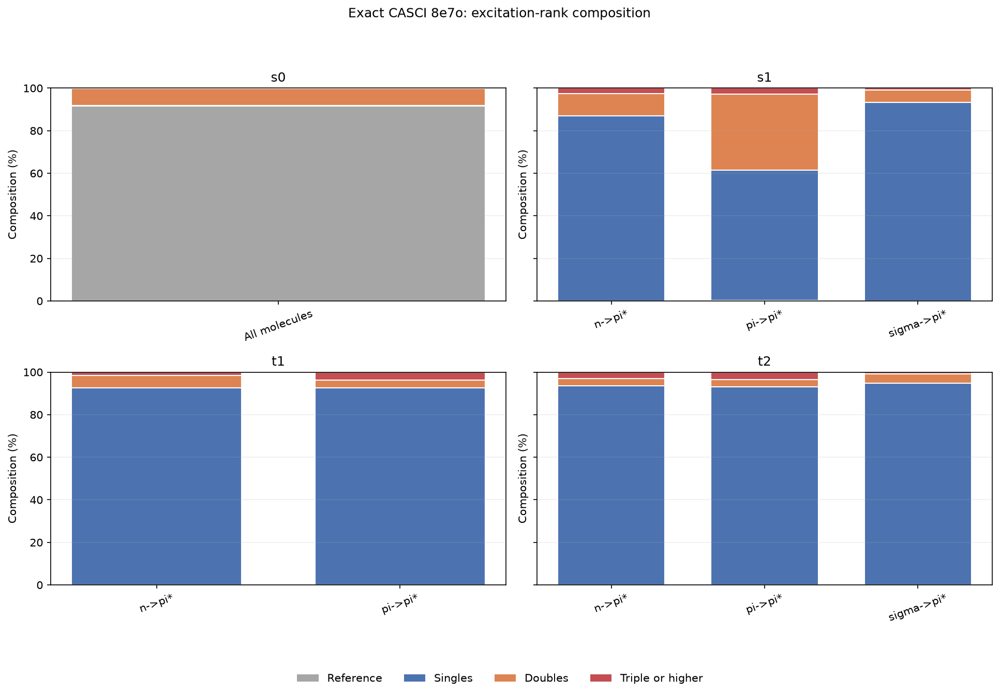
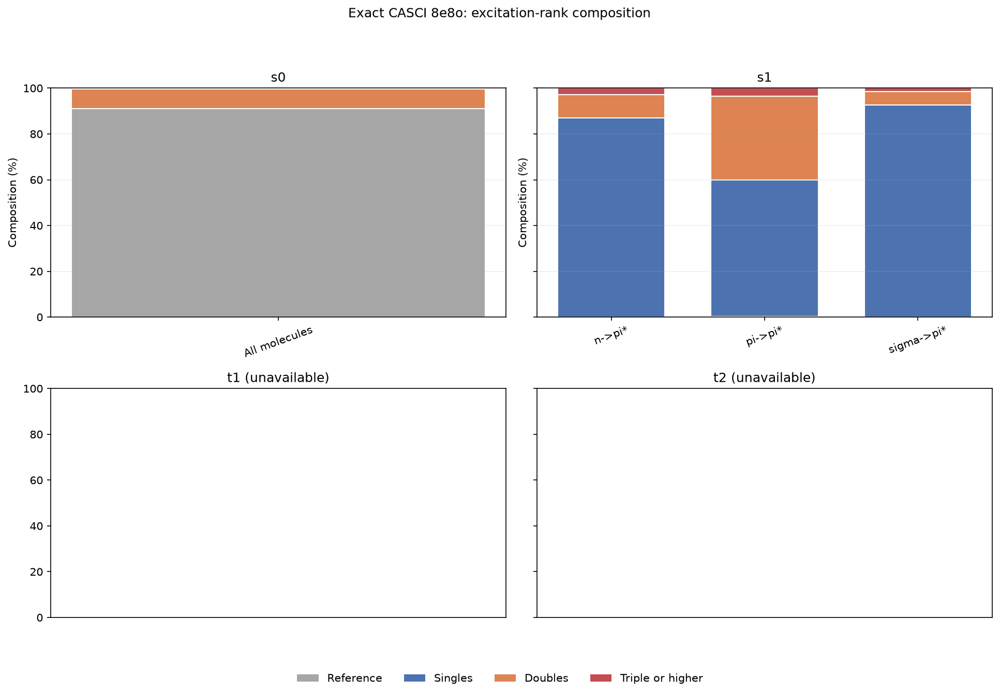

In [8]:
STATE_SPECS = {
    "s0": ("singlet", "0", None),
    "s1": ("singlet", "1", "S1_Orb"),
    "t1": ("triplet", "0", "T1_Orb"),
    "t2": ("triplet", "1", "T2_Orb"),
}
COMPONENTS = ["reference", "singles", "doubles", "higher"]
composition_records = []

for active_space in active_spaces:
    num_e, num_o = parse_active_space(active_space)
    hf_state = "11" * (num_e // 2) + "00" * (num_o - num_e // 2)
    df_active = df_orbital_errors[df_orbital_errors["active_space"] == active_space]

    for _, row in df_active.iterrows():
        for state, (expansion, root, orbital_column) in STATE_SPECS.items():
            if row["expansion"] != expansion:
                continue

            pvecs = row["pyscf_casci_pvec"]
            if expansion == "singlet":
                if root not in pvecs:
                    continue
                percentages = get_excitation_percentages(pvecs[root], hf_state)
            else:
                sector_keys = [f"{root}_{sector}" for sector in TRIPLET_SECTORS]
                if not all(key in pvecs for key in sector_keys):
                    continue
                percentages = np.mean([
                    get_excitation_percentages(pvecs[key], hf_state)
                    for key in sector_keys
                ], axis=0)

            orbital_type = "All molecules" if orbital_column is None else row[orbital_column]
            if orbital_type == "-" or pd.isna(orbital_type):
                continue
            composition_records.append({
                "molecule": row["molecule"],
                "active_space": active_space,
                "state": state,
                "orbital_type": orbital_type,
                **dict(zip(COMPONENTS, percentages)),
            })

df_exact_excitation_composition = pd.DataFrame(composition_records)
df_mean_exact_excitation_composition = (
    df_exact_excitation_composition
    .groupby(["active_space", "state", "orbital_type"], as_index=False)[COMPONENTS]
    .mean()
)
exact_excitation_composition_data = {
    active_space: {
        state: {
            row["orbital_type"]: row[COMPONENTS].to_dict()
            for _, row in df_mean_exact_excitation_composition[
                (df_mean_exact_excitation_composition["active_space"] == active_space)
                & (df_mean_exact_excitation_composition["state"] == state)
            ].iterrows()
        }
        for state in STATE_SPECS
    }
    for active_space in active_spaces
}

exact_excitation_figures = [
    plot_exact_excitation_composition(exact_excitation_composition_data[active_space], active_space)
    for active_space in active_spaces
]
show_scrollable_figs(exact_excitation_figures)

,rank,excitation,weight_percent
5,1,2 -> 4,19.248%
7,1,3 -> 5,14.285%
8,1,3 -> 4,0.000%
4,1,2 -> 5,0.000%
2,1,1 -> 4,0.000%


,rank,excitation,weight_percent
44,2,"(3, 3) -> (4, 4)",31.045%
32,2,"(2, 2) -> (4, 4)",11.717%
37,2,"(2, 3) -> (4, 5)",10.821%
41,2,"(3, 3) -> (5, 5)",9.093%
29,2,"(2, 2) -> (5, 5)",2.627%



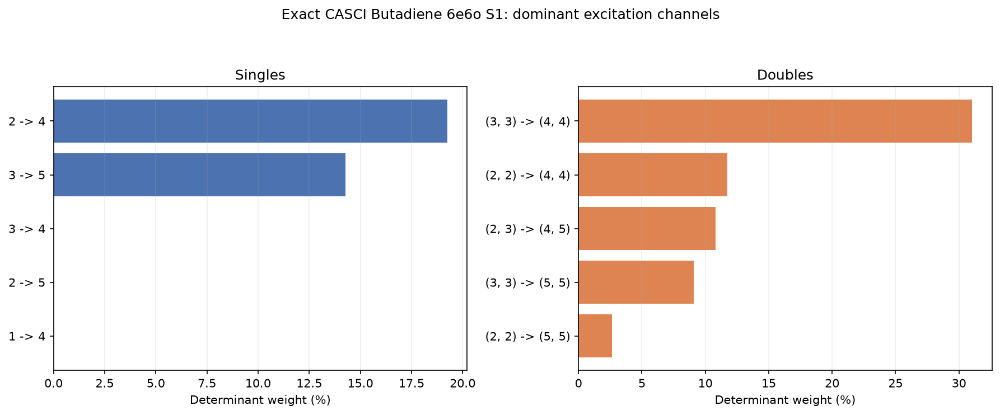

In [9]:
def get_spatial_excitation_channels(pvec, hf_state):
    num_bits = len(hf_state)
    num_electrons = hf_state.count("1")
    bitstrings = [
        format(index, f"0{num_bits}b")
        for index in range(2**num_bits)
        if format(index, f"0{num_bits}b").count("1") == num_electrons
    ]
    pvec = np.asarray(pvec, dtype=complex)

    if len(pvec) != len(bitstrings):
        raise ValueError("The pvec does not match the fixed-electron determinant basis.")

    channel_weights = {1: {}, 2: {}}
    weights = np.abs(pvec) ** 2

    for bitstring, weight in zip(bitstrings, weights / weights.sum()):
        holes = tuple(
            index // 2 + 1
            for index, (bit, hf_bit) in enumerate(zip(bitstring, hf_state))
            if bit == "0" and hf_bit == "1"
        )
        particles = tuple(
            index // 2 + 1
            for index, (bit, hf_bit) in enumerate(zip(bitstring, hf_state))
            if bit == "1" and hf_bit == "0"
        )
        rank = len(holes)

        if rank not in channel_weights:
            continue

        channel = (tuple(sorted(holes)), tuple(sorted(particles)))
        channel_weights[rank][channel] = channel_weights[rank].get(channel, 0) + weight

    records = []
    for rank, channels in channel_weights.items():
        for (holes, particles), weight in channels.items():
            excitation = f"{holes[0]} -> {particles[0]}" if rank == 1 else (
                f"{holes} -> {particles}"
            )
            records.append({
                "rank": rank,
                "excitation": excitation,
                "weight_percent": 100 * weight,
            })

    return pd.DataFrame(records)


example_molecule = "Butadiene"
example_active_space = "6e6o"
example_row = df_orbital_errors.loc[
    (df_orbital_errors["molecule"] == example_molecule)
    & (df_orbital_errors["active_space"] == example_active_space)
    & (df_orbital_errors["expansion"] == "singlet")
].iloc[0]
num_e, num_o = parse_active_space(example_active_space)
hf_state = "11" * (num_e // 2) + "00" * (num_o - num_e // 2)
df_s1_dominant_excitations = get_spatial_excitation_channels(
    example_row["pyscf_casci_pvec"]["1"], hf_state
)

percentages = get_excitation_percentages(
    example_row["pyscf_casci_pvec"]["1"], hf_state
)
for rank, percentage in ((1, percentages[1]), (2, percentages[2])):
    channel_weight = df_s1_dominant_excitations.loc[
        df_s1_dominant_excitations["rank"] == rank, "weight_percent"
    ].sum()
    assert np.isclose(channel_weight, percentage)

top_singles = df_s1_dominant_excitations.query("rank == 1").nlargest(5, "weight_percent")
top_doubles = df_s1_dominant_excitations.query("rank == 2").nlargest(5, "weight_percent")
display(top_singles.style.format({"weight_percent": "{:.3f}%"}))
display(top_doubles.style.format({"weight_percent": "{:.3f}%"}))

figure, axes = plt.subplots(1, 2, figsize=(12, 5))
for axis, channels, title, color in (
    (axes[0], top_singles, "Singles", "#4C72B0"),
    (axes[1], top_doubles, "Doubles", "#DD8452"),
):
    channels = channels.sort_values("weight_percent")
    axis.barh(channels["excitation"], channels["weight_percent"], color=color)
    axis.set_title(title)
    axis.set_xlabel("Determinant weight (%)")
    axis.grid(axis="x", alpha=0.2)

figure.suptitle(
    f"Exact CASCI {example_molecule} {example_active_space} S1: dominant excitation channels"
)
figure.tight_layout(rect=(0, 0, 1, 0.93))
show_scrollable_figs([figure])

/var/folders/ss/g36_nsnd0qjf0lp46dbvy55m0000gn/T/ipykernel_22724/625982144.py:38: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  .stack(["rank", "excitation"])


,rank,excitation,orbital_type,num_molecules,mean_weight_percent,sem,ci95
6,1,2 -> 4,n->pi*,14,44.99%,12.512450,+/- 24.52%
12,1,3 -> 4,n->pi*,14,26.32%,11.548812,+/- 22.64%
7,1,2 -> 4,pi->pi*,13,26.15%,7.846177,+/- 15.38%
1,1,1 -> 4,pi->pi*,13,18.77%,9.929483,+/- 19.46%
15,1,3 -> 5,pi->pi*,13,16.24%,4.753936,+/- 9.32%
0,1,1 -> 4,n->pi*,14,15.80%,8.385951,+/- 16.44%
2,1,1 -> 5,n->pi*,14,1.86%,1.041697,+/- 2.04%
3,1,1 -> 5,pi->pi*,13,0.87%,0.739566,+/- 1.45%
14,1,3 -> 5,n->pi*,14,0.79%,0.785399,+/- 1.54%
4,1,1 -> 6,n->pi*,14,0.58%,0.392682,+/- 0.77%



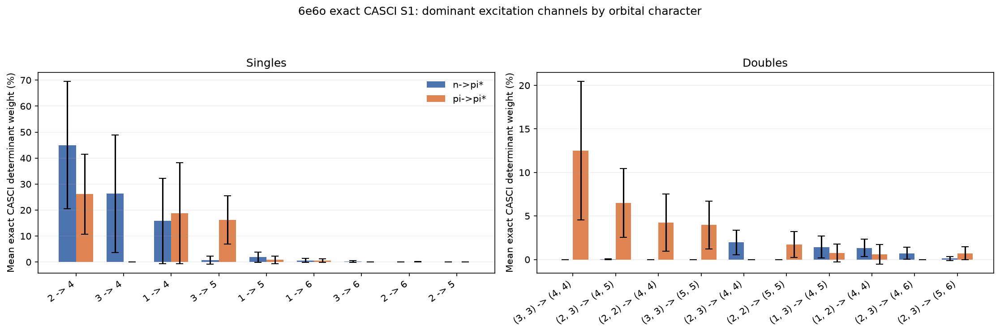

In [10]:
CHANNEL_ACTIVE_SPACE = "6e6o"
CHANNEL_TYPES = ["n->pi*", "pi->pi*"]
CHANNEL_RANKS = {1: "Singles", 2: "Doubles"}

df_s1_channel_sources = df_orbital_errors.loc[
    (df_orbital_errors["active_space"] == CHANNEL_ACTIVE_SPACE)
    & (df_orbital_errors["expansion"] == "singlet")
    & (df_orbital_errors["S1_Orb"].isin(CHANNEL_TYPES)),
    ["molecule", "S1_Orb", "pyscf_casci_pvec"],
].rename(columns={"S1_Orb": "orbital_type"})

num_e, num_o = parse_active_space(CHANNEL_ACTIVE_SPACE)
hf_state = "11" * (num_e // 2) + "00" * (num_o - num_e // 2)
channel_frames = []

for _, row in df_s1_channel_sources.iterrows():
    channels = get_spatial_excitation_channels(row["pyscf_casci_pvec"]["1"], hf_state)
    channel_frames.append(channels.assign(
        molecule=row["molecule"], orbital_type=row["orbital_type"],
    ))

df_s1_excitation_channels = pd.concat(channel_frames, ignore_index=True)

for _, row in df_s1_channel_sources.iterrows():
    expected = get_excitation_percentages(row["pyscf_casci_pvec"]["1"], hf_state)
    for rank in CHANNEL_RANKS:
        channel_weight = df_s1_excitation_channels.loc[
            (df_s1_excitation_channels["molecule"] == row["molecule"])
            & (df_s1_excitation_channels["rank"] == rank),
            "weight_percent",
        ].sum()
        assert np.isclose(channel_weight, expected[rank])

df_s1_channel_weights = (
    df_s1_excitation_channels
    .set_index(["molecule", "orbital_type", "rank", "excitation"])["weight_percent"]
    .unstack(["rank", "excitation"], fill_value=0)
    .stack(["rank", "excitation"])
    .rename("weight_percent")
    .reset_index()
)

df_s1_channel_summary = (
    df_s1_channel_weights
    .groupby(["rank", "excitation", "orbital_type"], as_index=False)["weight_percent"]
    .agg(num_molecules="size", mean_weight_percent="mean", sem="sem")
)
df_s1_channel_summary["ci95"] = 1.96 * df_s1_channel_summary["sem"]

top_channels = {
    rank: (
        df_s1_channel_summary
        .query("rank == @rank")
        .pivot(index="excitation", columns="orbital_type", values="mean_weight_percent")
        .max(axis=1)
        .nlargest(10)
        .index
        .tolist()
    )
    for rank in CHANNEL_RANKS
}

df_dominant_s1_channel_summary = pd.concat([
    df_s1_channel_summary[
        (df_s1_channel_summary["rank"] == rank)
        & (df_s1_channel_summary["excitation"].isin(excitations))
    ]
    for rank, excitations in top_channels.items()
], ignore_index=True)
display(
    df_dominant_s1_channel_summary.sort_values(["rank", "mean_weight_percent"], ascending=[True, False])
    .style.format({
        "mean_weight_percent": "{:.2f}%",
        "ci95": "+/- {:.2f}%",
    })
)

colors = {"n->pi*": "#4C72B0", "pi->pi*": "#DD8452"}
width = 0.36
figure, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=False)

for axis, (rank, title) in zip(axes, CHANNEL_RANKS.items()):
    excitations = top_channels[rank]
    positions = np.arange(len(excitations))

    for index, orbital_type in enumerate(CHANNEL_TYPES):
        summary = (
            df_dominant_s1_channel_summary
            .query("rank == @rank and orbital_type == @orbital_type")
            .set_index("excitation")
            .reindex(excitations)
        )
        axis.bar(
            positions + (index - 0.5) * width,
            summary["mean_weight_percent"],
            width,
            yerr=summary["ci95"],
            capsize=4,
            color=colors[orbital_type],
            label=orbital_type,
        )

    axis.set_xticks(positions, excitations, rotation=35, ha="right")
    axis.set_title(title)
    axis.set_ylabel("Mean exact CASCI determinant weight (%)")
    axis.grid(axis="y", alpha=0.2)

axes[0].legend(frameon=False)
figure.suptitle("6e6o exact CASCI S1: dominant excitation channels by orbital character")
figure.tight_layout(rect=(0, 0, 1, 0.92))
show_scrollable_figs([figure])


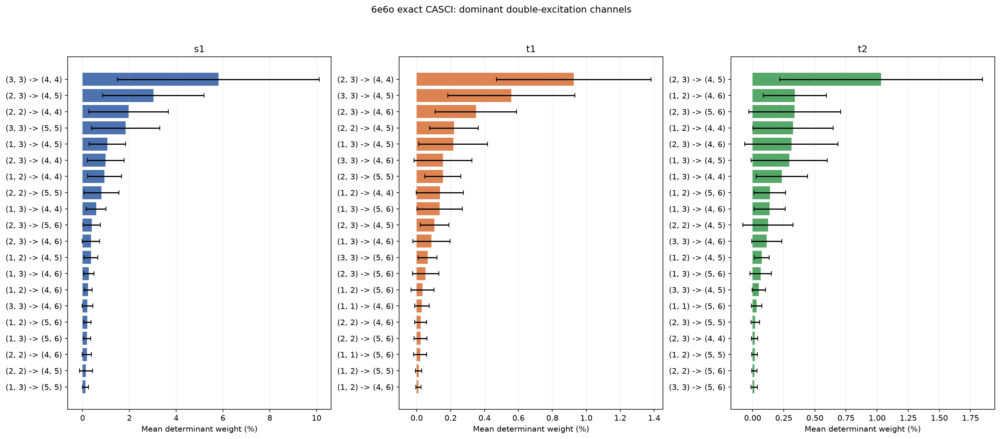

In [11]:
EXACT_CHANNEL_ACTIVE_SPACE = "6e6o"
EXACT_STATE_ROOTS = {
    "s1": ("singlet", "1"),
    "t1": ("triplet", "0"),
    "t2": ("triplet", "1"),
}

num_e, num_o = parse_active_space(EXACT_CHANNEL_ACTIVE_SPACE)
hf_state = "11" * (num_e // 2) + "00" * (num_o - num_e // 2)
df_exact_channel_sources = df_uccsd[
    df_uccsd["active_space"] == EXACT_CHANNEL_ACTIVE_SPACE
].copy()

exact_double_channel_frames = []
for state, (expansion, root) in EXACT_STATE_ROOTS.items():
    df_state = df_exact_channel_sources[
        df_exact_channel_sources["expansion"] == expansion
    ]

    for _, row in df_state.iterrows():
        pvecs = row["pyscf_casci_pvec"]

        if expansion == "singlet":
            channels = (
                get_spatial_excitation_channels(pvecs[root], hf_state)
                .query("rank == 2")
                .set_index("excitation")["weight_percent"]
            )
            double_weight = get_excitation_percentages(pvecs[root], hf_state)[2]
        else:
            sector_channels = []
            sector_weights = []
            for sector in TRIPLET_SECTORS:
                pvec = pvecs[f"{root}_{sector}"]
                sector_channels.append(
                    get_spatial_excitation_channels(pvec, hf_state)
                    .query("rank == 2")
                    .set_index("excitation")["weight_percent"]
                )
                sector_weights.append(get_excitation_percentages(pvec, hf_state)[2])

            channels = (
                pd.concat(sector_channels, axis=1)
                .fillna(0)
                .mean(axis=1)
                .rename("weight_percent")
            )
            double_weight = np.mean(sector_weights)

        assert np.isclose(channels.sum(), double_weight)
        exact_double_channel_frames.append(
            channels.rename("weight_percent").reset_index().assign(
                molecule=row["molecule"], state=state
            )
        )

df_exact_double_channels = pd.concat(exact_double_channel_frames, ignore_index=True)[
    ["molecule", "state", "excitation", "weight_percent"]
]
df_exact_double_channel_summary = (
    df_exact_double_channels
    .groupby(["state", "excitation"], as_index=False)["weight_percent"]
    .agg(num_molecules="size", mean_weight_percent="mean", sem="sem")
)
df_exact_double_channel_summary["confidence_interval_95"] = (
    1.96 * df_exact_double_channel_summary["sem"]
)
df_exact_double_channel_summary = df_exact_double_channel_summary.drop(columns="sem")

df_exact_dominant_double_channel_summary = (
    df_exact_double_channel_summary
    .sort_values(["state", "mean_weight_percent"], ascending=[True, False])
    .groupby("state", group_keys=False)
    .head(20)
    .reset_index(drop=True)
)

assert df_exact_double_channel_summary["num_molecules"].eq(28).all()
assert df_exact_dominant_double_channel_summary.shape == (60, 5)
assert np.isfinite(df_exact_dominant_double_channel_summary.iloc[:, 2:]).all().all()
assert (df_exact_dominant_double_channel_summary["confidence_interval_95"] >= 0).all()

figure, axes = plt.subplots(1, 3, figsize=(18, 8))
colors = {"s1": "#4C72B0", "t1": "#DD8452", "t2": "#55A868"}
for axis, state in zip(axes, EXACT_STATE_ROOTS):
    channels = (
        df_exact_dominant_double_channel_summary
        .query("state == @state")
        .sort_values("mean_weight_percent")
    )
    axis.barh(
        channels["excitation"], channels["mean_weight_percent"],
        xerr=channels["confidence_interval_95"], capsize=3, color=colors[state],
    )
    axis.set_title(state)
    axis.set_xlabel("Mean determinant weight (%)")
    axis.grid(axis="x", alpha=0.2)

figure.suptitle("6e6o exact CASCI: dominant double-excitation channels")
figure.tight_layout(rect=(0, 0, 1, 0.95))
show_scrollable_figs([figure])


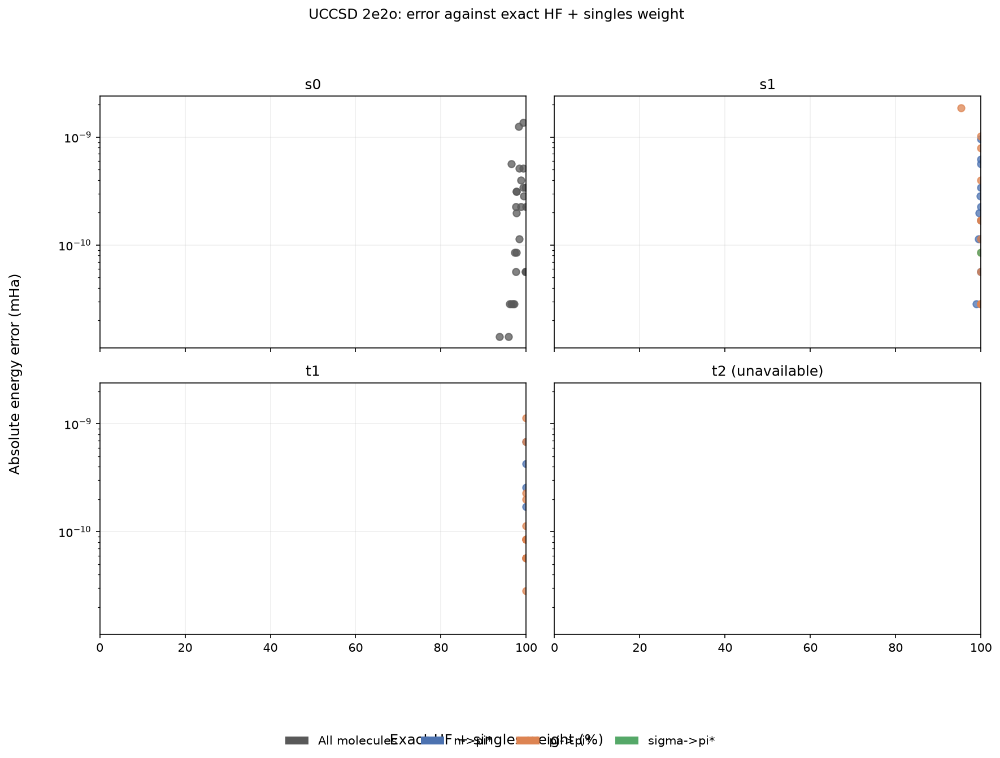
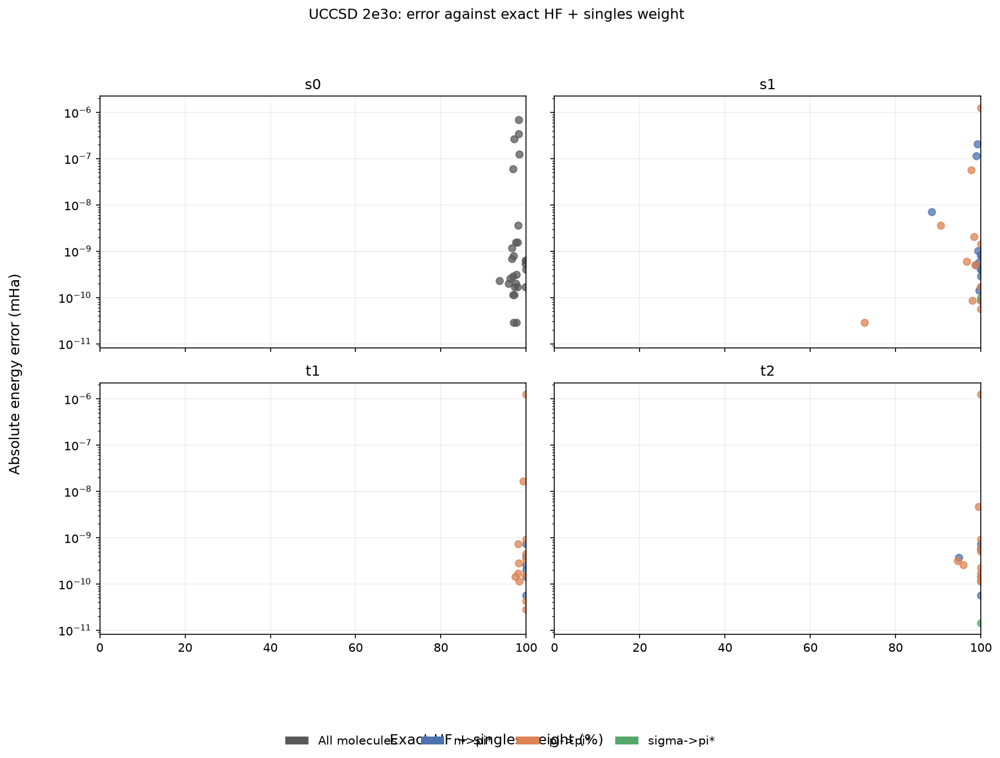
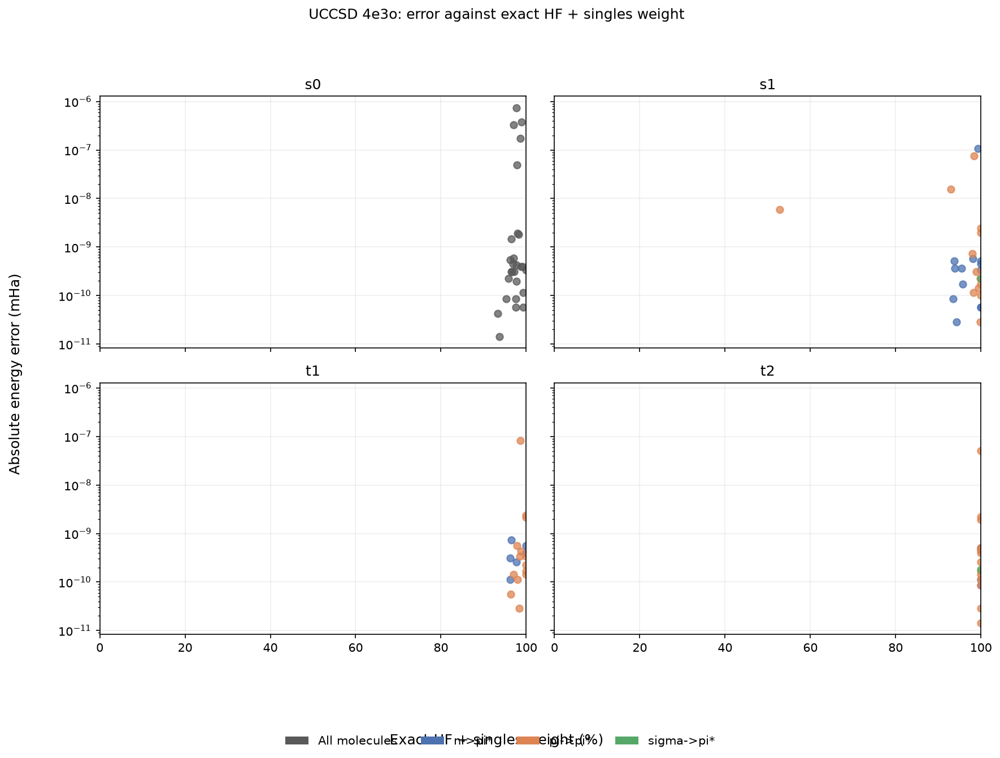
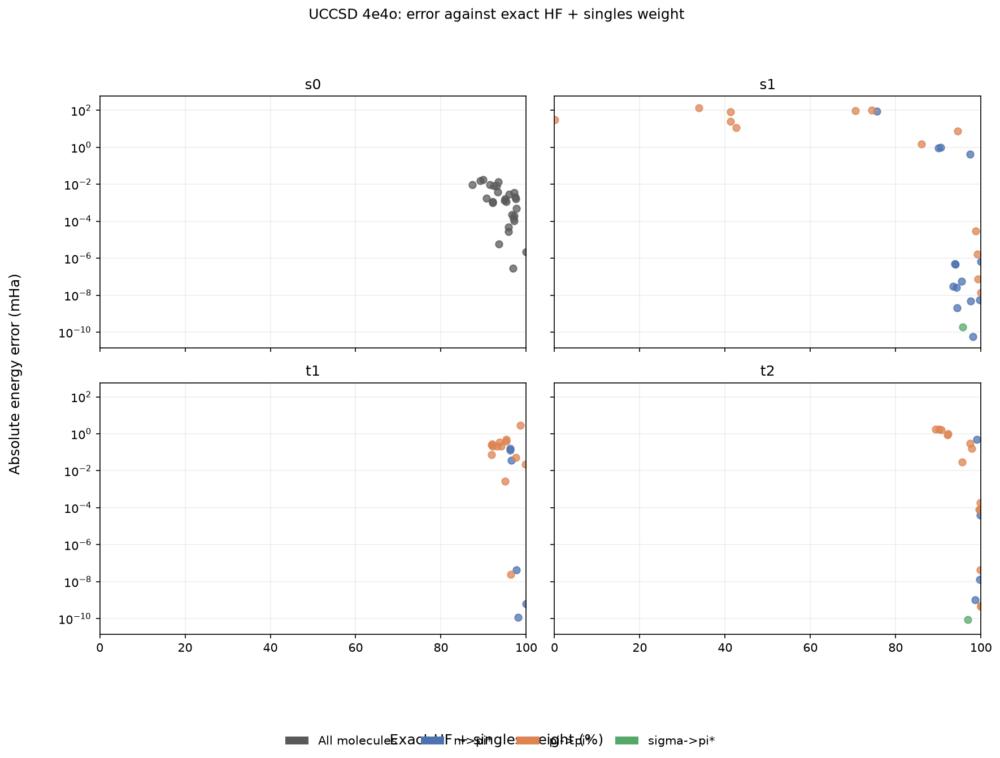
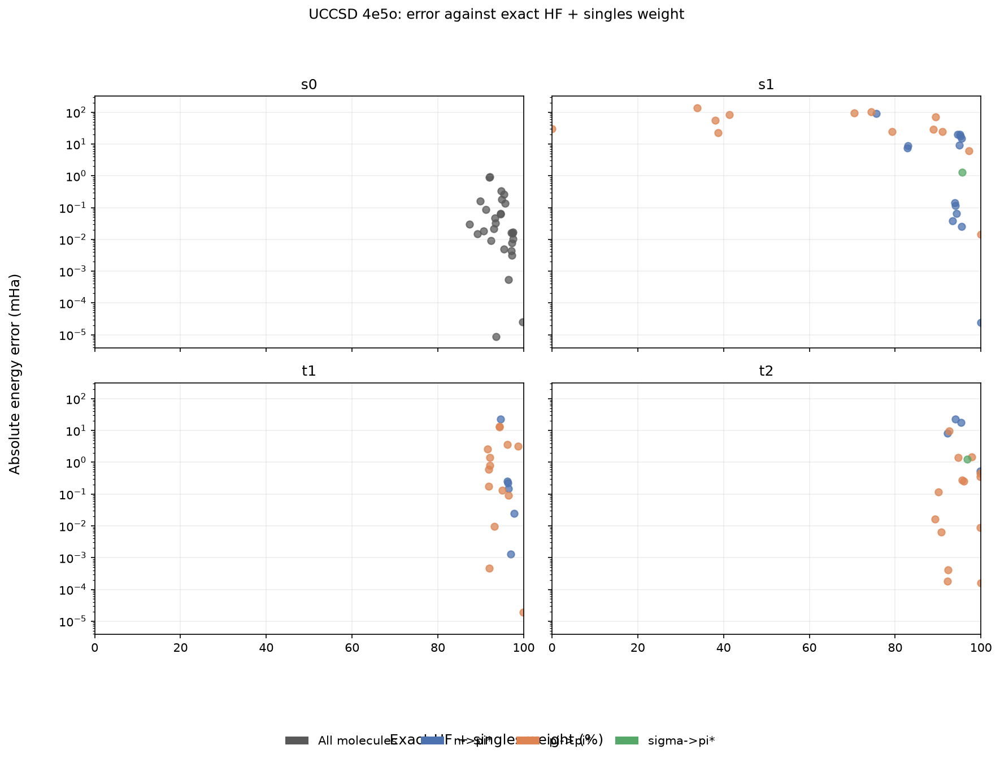
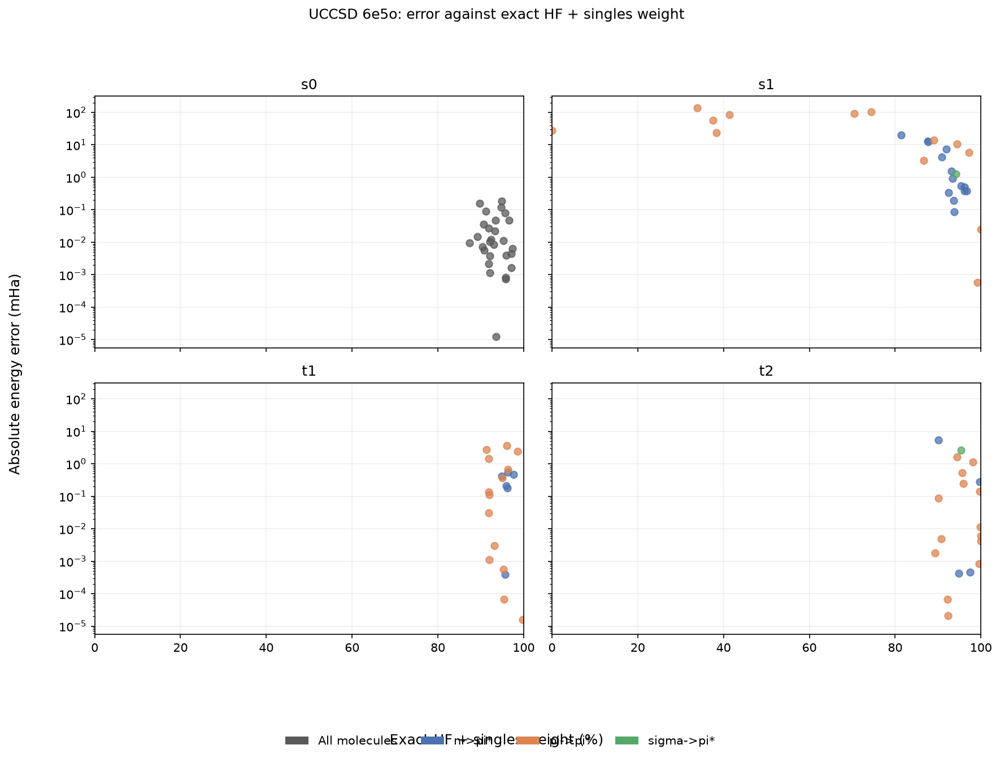
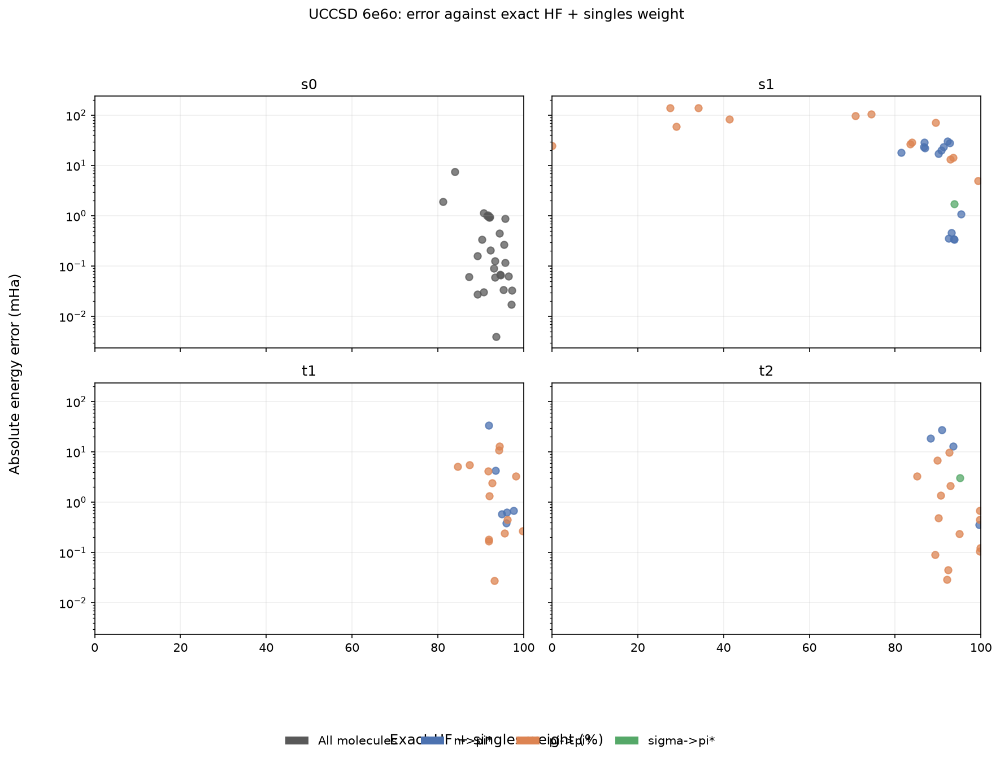
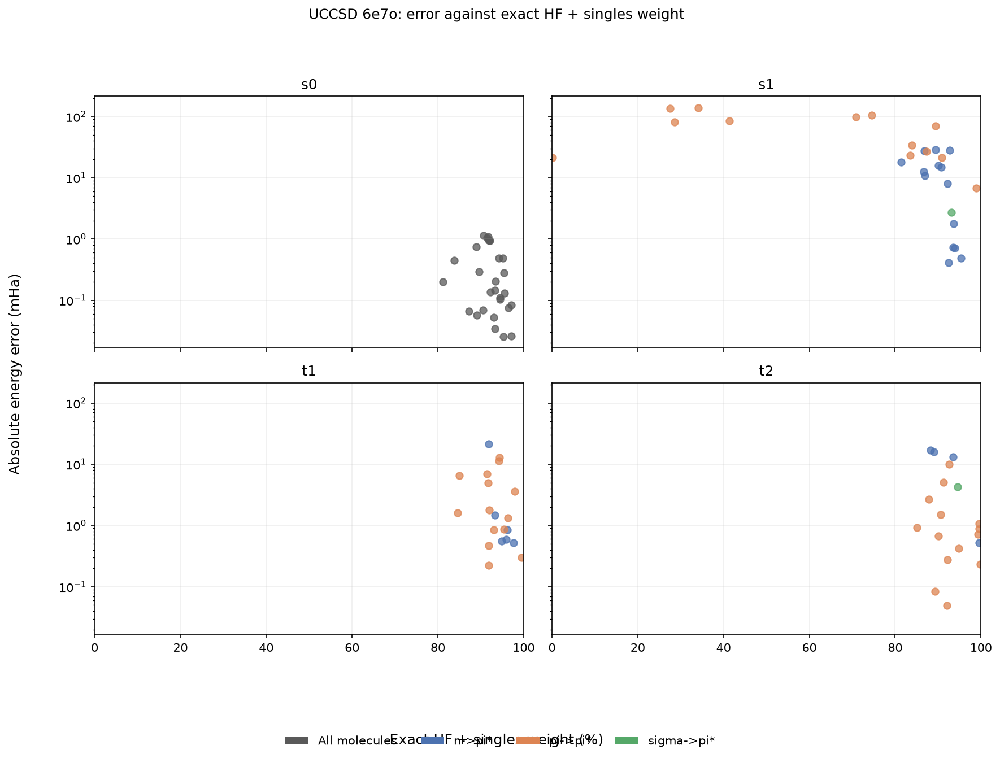
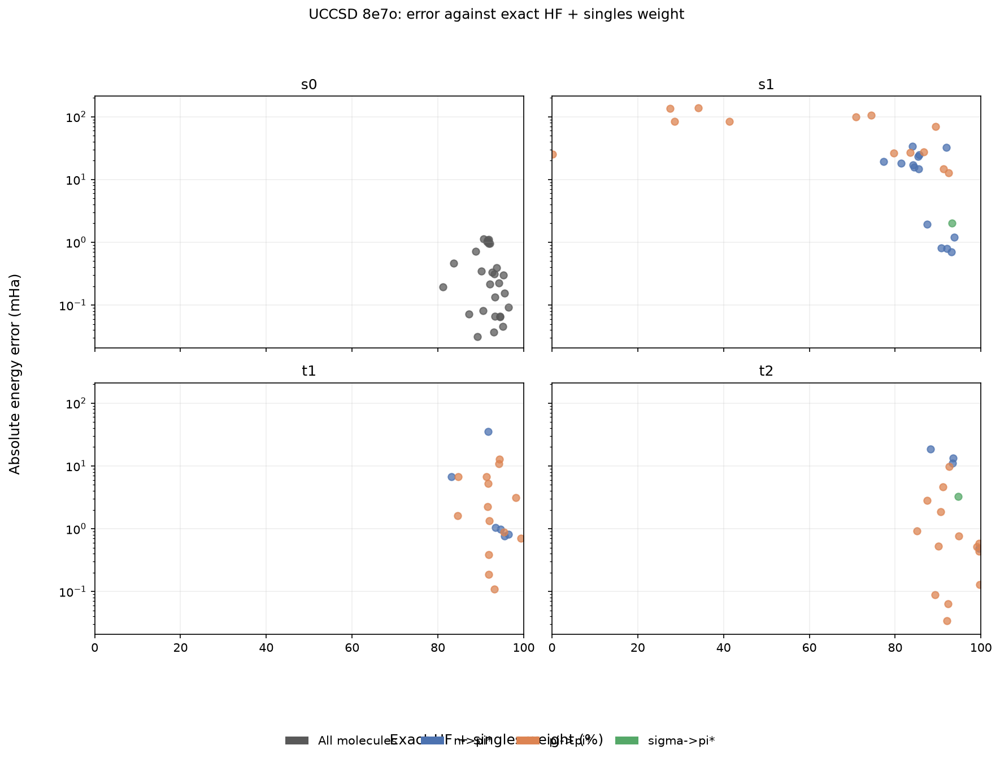
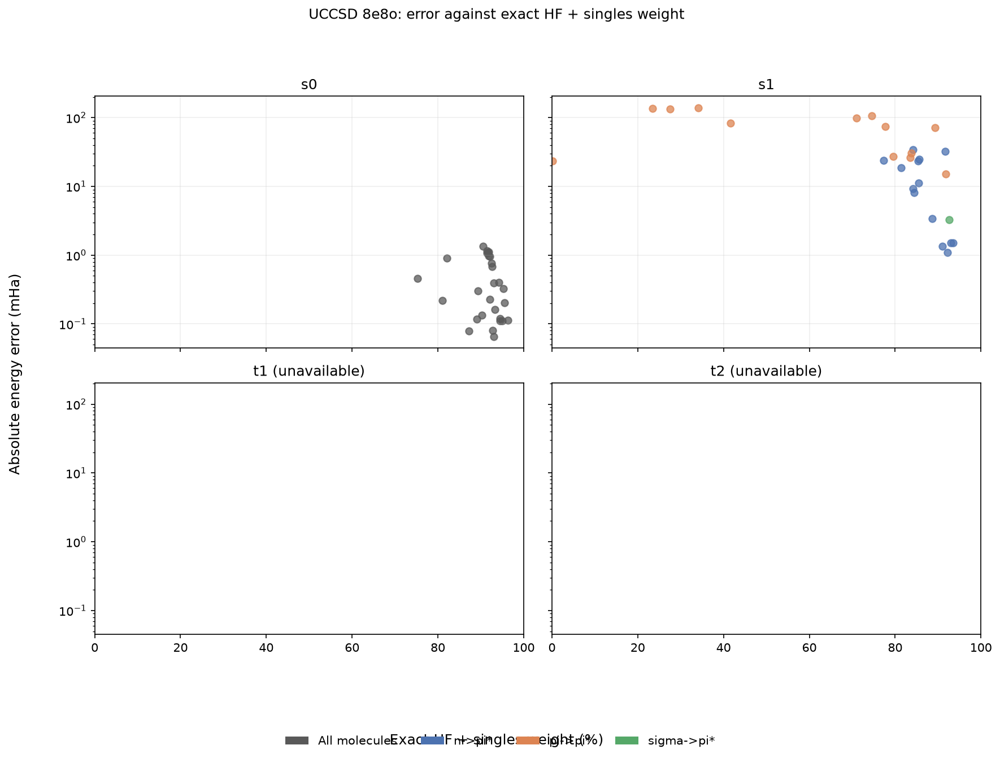

In [12]:
state_error_frames = [
    df_orbital_errors.loc[
        df_orbital_errors["expansion"] == expansion,
        ["molecule", "active_space", f"{state}_error"],
    ].rename(columns={f"{state}_error": "error"}).assign(state=state)
    for state, expansion in STATE_EXPANSIONS.items()
]
df_state_errors = pd.concat(state_error_frames, ignore_index=True)
df_hf_singles_error = df_exact_excitation_composition.merge(
    df_state_errors, on=["molecule", "active_space", "state"], validate="one_to_one"
).dropna(subset=["reference", "singles", "error"])
df_hf_singles_error["hf_plus_singles"] = (
    df_hf_singles_error["reference"] + df_hf_singles_error["singles"]
)

hf_singles_error_data = {}
for active_space in active_spaces:
    df_active = df_hf_singles_error[df_hf_singles_error["active_space"] == active_space]
    hf_singles_error_data[active_space] = {}

    for state in STATE_SPECS:
        df_state = df_active[df_active["state"] == state]
        hf_singles_error_data[active_space][state] = {
            orbital_type: list(zip(group["hf_plus_singles"], group["error"]))
            for orbital_type, group in df_state.groupby("orbital_type", sort=False)
        }

hf_singles_error_figures = [
    plot_hf_singles_error_scatter(hf_singles_error_data[active_space], active_space)
    for active_space in active_spaces
]
show_scrollable_figs(hf_singles_error_figures)


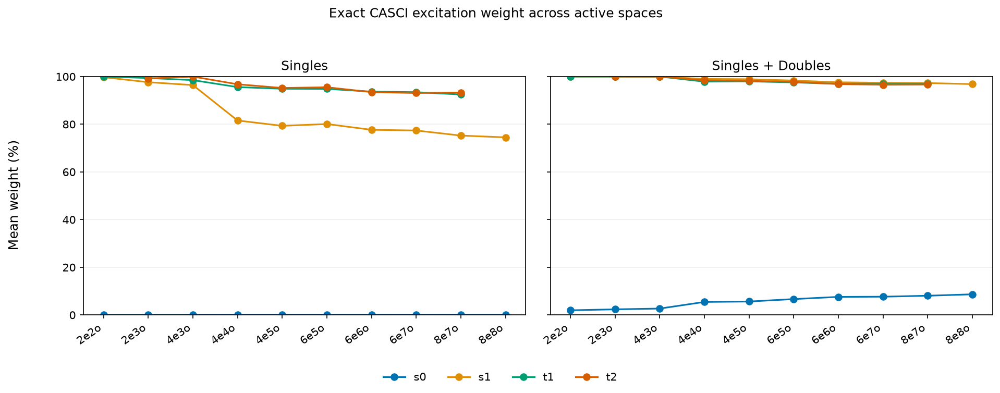

In [13]:
df_excitation_weight_scaling = (
    df_exact_excitation_composition
    .groupby(["active_space", "state"], as_index=False)[["singles", "doubles"]]
    .mean()
)
df_excitation_weight_scaling["singles_and_doubles"] = (
    df_excitation_weight_scaling["singles"] + df_excitation_weight_scaling["doubles"]
)

excitation_weight_data = {
    active_space: {
        row["state"]: row[["singles", "singles_and_doubles"]].to_dict()
        for _, row in df_excitation_weight_scaling[
            df_excitation_weight_scaling["active_space"] == active_space
        ].iterrows()
    }
    for active_space in active_spaces
}

excitation_weight_figure = plot_excitation_weight_scaling(excitation_weight_data)
show_scrollable_figs([excitation_weight_figure])

### Exact-state representability diagnostics

The representability deficit is \(100(1-P)\), where \(P\) is the exact CASCI-state projection onto the retained QSE subspace. A low projection identifies missing state character; a high projection with a large energy error instead indicates an energetically displaced or mixed QSE root.

,active_space,state,median_projection,q10_projection,fraction_below_099,fraction_below_095
0,2e2o,s0,1.00000,1.00000,0.0%,0.0%
1,2e2o,s1,1.00000,1.00000,0.0%,0.0%
2,2e2o,t1,1.00000,1.00000,0.0%,0.0%
3,2e2o,t2,nan,nan,0.0%,0.0%
4,2e3o,s0,1.00000,1.00000,0.0%,0.0%
5,2e3o,s1,1.00000,1.00000,0.0%,0.0%
6,2e3o,t1,1.00000,1.00000,0.0%,0.0%
7,2e3o,t2,1.00000,1.00000,0.0%,0.0%
8,4e3o,s0,1.00000,1.00000,0.0%,0.0%
9,4e3o,s1,1.00000,1.00000,0.0%,0.0%



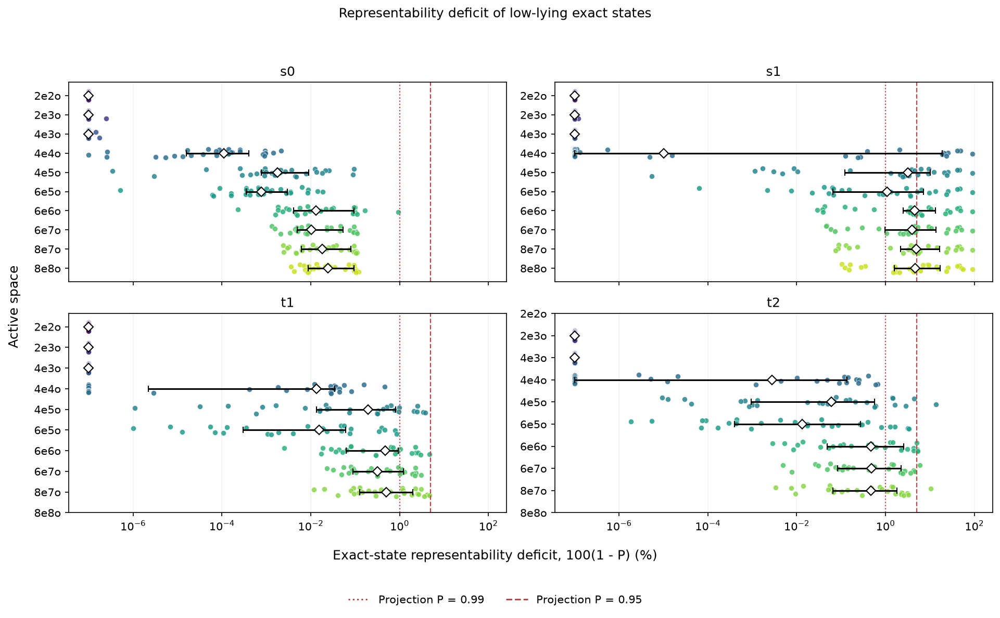
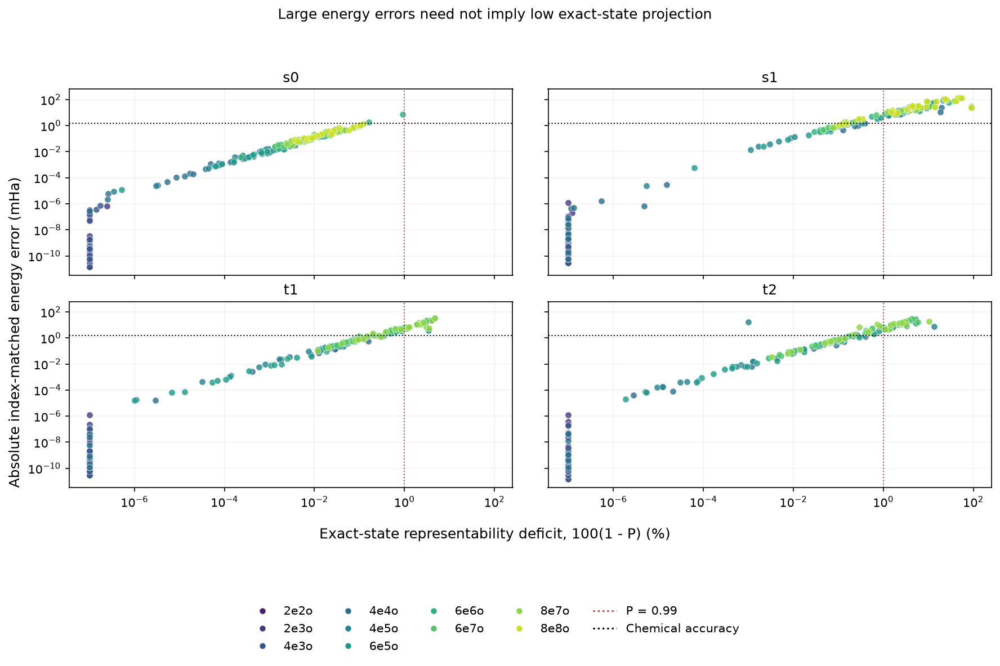

In [14]:
from matplotlib.lines import Line2D

REPRESENTABILITY_STATE_ORDER = ['s0', 's1', 't1', 't2']
REPRESENTABILITY_EXPANSIONS = {
    's0': 'singlet', 's1': 'singlet', 't1': 'triplet', 't2': 'triplet',
}
REPRESENTABILITY_COLORS = {
    active_space: color
    for active_space, color in zip(
        active_spaces, plt.colormaps['viridis'](np.linspace(0.08, 0.92, len(active_spaces)))
    )
}
CHEMICAL_ACCURACY_MHA = 1.59362

representability_frames = []
for state, expansion in REPRESENTABILITY_EXPANSIONS.items():
    representability_frames.append(
        df_uccsd.loc[
            df_uccsd['expansion'] == expansion,
            ['molecule', 'active_space', f'{state}_error', f'{state}_projection'],
        ].rename(columns={
            f'{state}_error': 'error_mHa', f'{state}_projection': 'projection',
        }).assign(state=state)
    )

df_representability = pd.concat(representability_frames, ignore_index=True).assign(
    deficit_percent=lambda frame: 100 * (1 - frame['projection'])
)

projection_summary = (
    df_representability.groupby(['active_space', 'state'], sort=False)
    .agg(
        median_projection=('projection', 'median'),
        q10_projection=('projection', lambda values: values.quantile(0.10)),
        fraction_below_099=('projection', lambda values: 100 * (values < 0.99).mean()),
        fraction_below_095=('projection', lambda values: 100 * (values < 0.95).mean()),
    )
    .reindex(pd.MultiIndex.from_product([active_spaces, REPRESENTABILITY_STATE_ORDER], names=['active_space', 'state']))
    .reset_index()
)
display(projection_summary.style.format({
    'median_projection': '{:.5f}', 'q10_projection': '{:.5f}',
    'fraction_below_099': '{:.1f}%', 'fraction_below_095': '{:.1f}%',
}))


def plot_representability_deficits(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True)

    for axis, state in zip(axes.ravel(), REPRESENTABILITY_STATE_ORDER):
        df_state = metrics.loc[metrics['state'] == state]
        for position, active_space in enumerate(active_spaces):
            values = df_state.loc[
                df_state['active_space'] == active_space, 'deficit_percent'
            ].to_numpy()
            if not len(values):
                continue
            values = np.maximum(values, 1e-7)
            offsets = np.linspace(-0.22, 0.22, len(values))
            axis.scatter(values, position + offsets, color=REPRESENTABILITY_COLORS[active_space],
                         s=24, edgecolor='white', linewidth=0.35, alpha=0.85)
            q25, median, q75 = np.quantile(values, [0.25, 0.50, 0.75])
            axis.errorbar(median, position, xerr=[[median - q25], [q75 - median]],
                          fmt='D', color='black', mfc='white', capsize=3, zorder=3)
        axis.axvline(1, color='#B24C4C', linestyle=':', linewidth=1.1, label='P = 0.99')
        axis.axvline(5, color='#B24C4C', linestyle='--', linewidth=1.1, label='P = 0.95')
        axis.set_xscale('log')
        axis.set_yticks(range(len(active_spaces)), active_spaces)
        axis.invert_yaxis()
        axis.set_title(state)
        axis.grid(axis='x', alpha=0.18)

    figure.supxlabel('Exact-state representability deficit, 100(1 - P) (%)', y=0.09)
    figure.supylabel('Active space')
    figure.suptitle('Representability deficit of low-lying exact states', y=0.98)
    handles = [
        Line2D([0], [0], color='#B24C4C', linestyle=':', label='Projection P = 0.99'),
        Line2D([0], [0], color='#B24C4C', linestyle='--', label='Projection P = 0.95'),
    ]
    figure.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, 0.005), ncol=2, frameon=False)
    figure.subplots_adjust(left=0.08, right=0.99, bottom=0.17, top=0.86, wspace=0.11, hspace=0.16)
    return figure


def plot_error_against_deficit(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)

    for axis, state in zip(axes.ravel(), REPRESENTABILITY_STATE_ORDER):
        df_state = metrics.loc[metrics['state'] == state]
        for active_space in active_spaces:
            df_active = df_state.loc[df_state['active_space'] == active_space]
            axis.scatter(
                np.maximum(df_active['deficit_percent'], 1e-7), df_active['error_mHa'],
                color=REPRESENTABILITY_COLORS[active_space], s=30, edgecolor='white', linewidth=0.35,
                alpha=0.82, label=active_space,
            )
        axis.axvline(1, color='#B24C4C', linestyle=':', linewidth=1.0)
        axis.axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.0)
        axis.set_xscale('log')
        axis.set_yscale('log')
        axis.set_title(state)
        axis.grid(which='both', alpha=0.14)

    figure.supxlabel('Exact-state representability deficit, 100(1 - P) (%)', y=0.19)
    figure.supylabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Large energy errors need not imply low exact-state projection', y=0.98)
    handles = [Line2D([0], [0], marker='o', color='none', markerfacecolor=REPRESENTABILITY_COLORS[active_space],
                      markeredgecolor='white', label=active_space) for active_space in active_spaces]
    handles.extend([
        Line2D([0], [0], color='#B24C4C', linestyle=':', label='P = 0.99'),
        Line2D([0], [0], color='black', linestyle=':', label='Chemical accuracy'),
    ])
    figure.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, 0.01), ncol=5, frameon=False)
    figure.subplots_adjust(left=0.08, right=0.99, bottom=0.27, top=0.86, wspace=0.08, hspace=0.14)
    return figure


def get_selected_doubles_projection(selected_doubles, metrics):
    df_s1 = metrics.loc[
        (metrics['active_space'] == '6e6o') & (metrics['state'] == 's1'),
        ['molecule', 'projection', 'deficit_percent'],
    ]
    return selected_doubles.merge(df_s1, on='molecule', validate='one_to_one')


def plot_selected_doubles_projection(selected_doubles):
    figure, axis = plt.subplots(figsize=(8, 5.5))

    for transition, group in selected_doubles.groupby('orbital_type', sort=False):
        axis.scatter(
            np.maximum(group['deficit_percent'], 1e-7), group['s1_improvement_mHa'],
            color=TRANSITION_COLORS[transition], s=62, edgecolor='white', linewidth=0.65,
            alpha=0.90, label=transition,
        )

    for molecule in ['Butadiene', 'Furan', 'Pyrrole', 'Benzene', 'Hexatriene']:
        row = selected_doubles.loc[selected_doubles['molecule'] == molecule]
        if not row.empty:
            axis.annotate(
                molecule, (max(row['deficit_percent'].iloc[0], 1e-7), row['s1_improvement_mHa'].iloc[0]),
                xytext=(5, 4), textcoords='offset points', fontsize=8,
            )

    axis.axvline(1, color='#B24C4C', linestyle=':', linewidth=1.0, label='P = 0.99')
    axis.axhline(0, color='black', linestyle=':', linewidth=1.0, label='No error reduction')
    axis.set_xscale('log')
    axis.set_yscale('symlog', linthresh=0.2)
    axis.set_xlabel('Baseline exact state missing from singles-response QSE subspace, 100(1 - P) (%)')
    axis.set_ylabel('s1 error reduction from selected doubles (mHa)')
    axis.set_title('Selected-double rescue is not determined by baseline projection alone')
    axis.grid(which='both', alpha=0.16)
    axis.legend(title='Orbital transition', frameon=False, loc='upper left')
    figure.tight_layout()
    return figure


representability_deficit_figure = plot_representability_deficits(df_representability)
error_deficit_figure = plot_error_against_deficit(df_representability)
show_scrollable_figs([
    representability_deficit_figure, error_deficit_figure,
])


## Error Spread and Double-Excitation Character

These scratch figures separate the broad `4e4o` error distribution into molecule-level outcomes. They also connect the exact CASCI `s1` double-excitation character to orbital-transition class and QSE error.

In [15]:
LOW_STATES = {
    "s0": "singlet", "s1": "singlet",
    "t1": "triplet", "t2": "triplet",
}
CHEMICAL_ACCURACY_MHA = 1.59362

metric_frames = []
for state, expansion in LOW_STATES.items():
    metric_frames.append(
        df_uccsd.loc[
            df_uccsd["expansion"] == expansion,
            ["molecule", "active_space", f"{state}_error", f"{state}_projection"],
        ].rename(columns={
            f"{state}_error": "error_mHa",
            f"{state}_projection": "projection",
        }).assign(state=state)
    )

df_low_state_metrics = pd.concat(metric_frames, ignore_index=True)
df_low_state_metrics = df_low_state_metrics.dropna(subset=["error_mHa", "projection"])



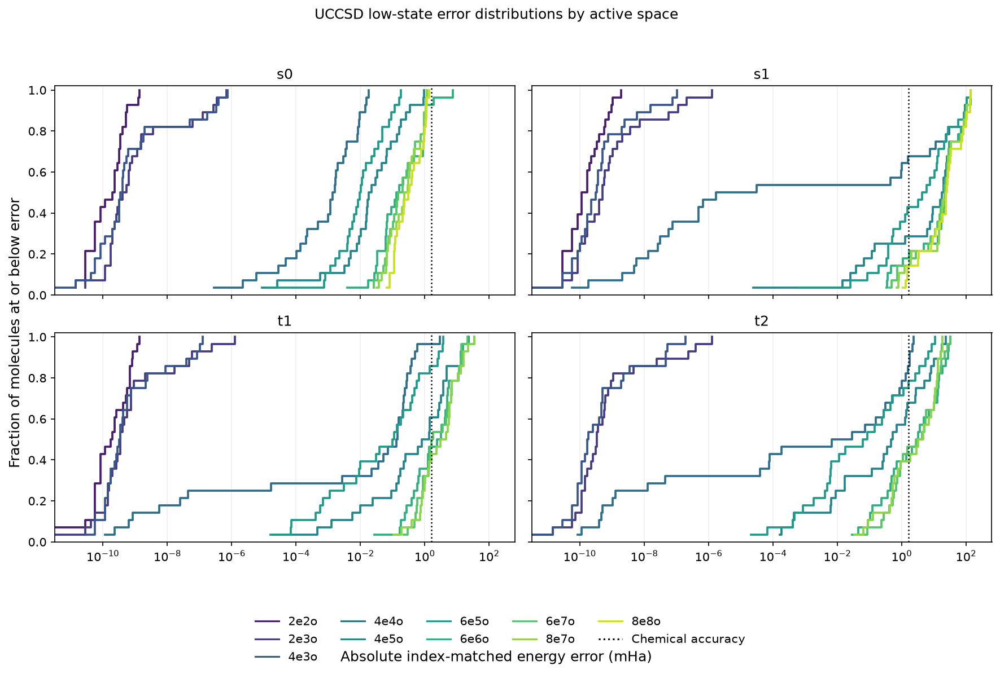
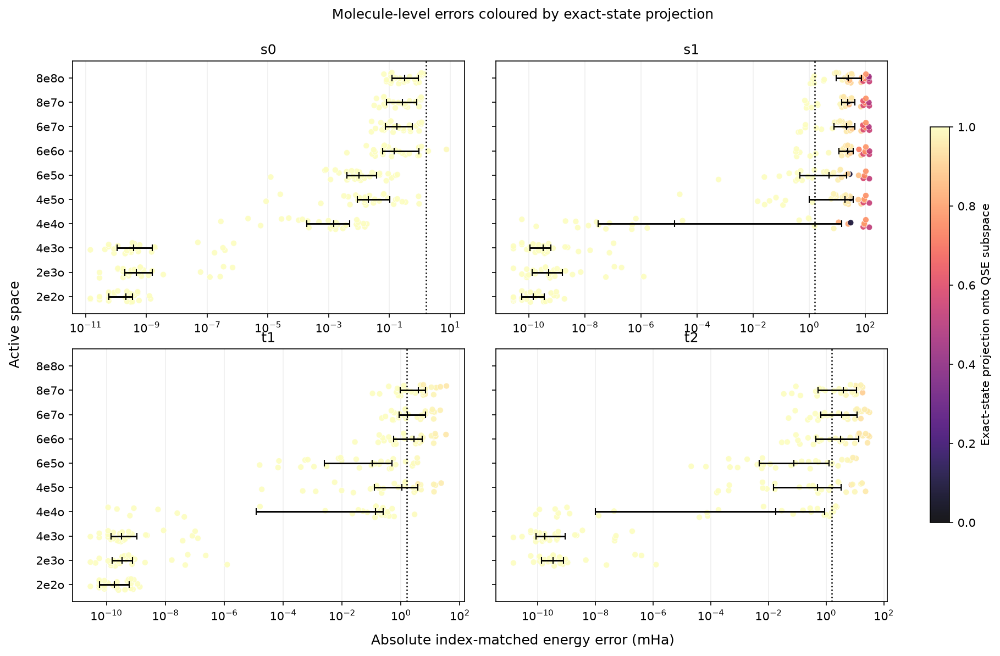
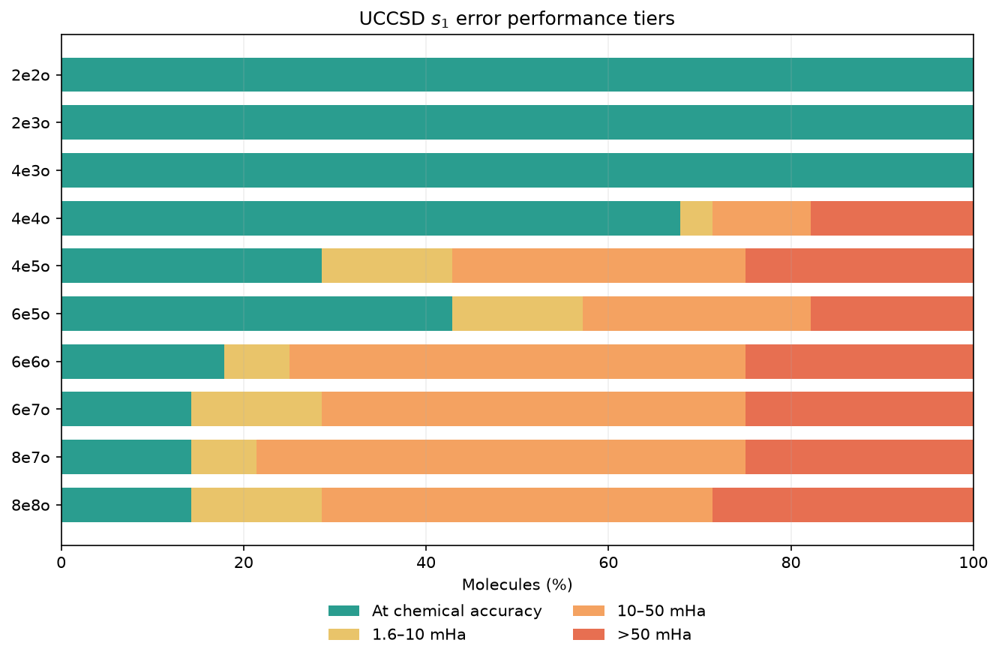
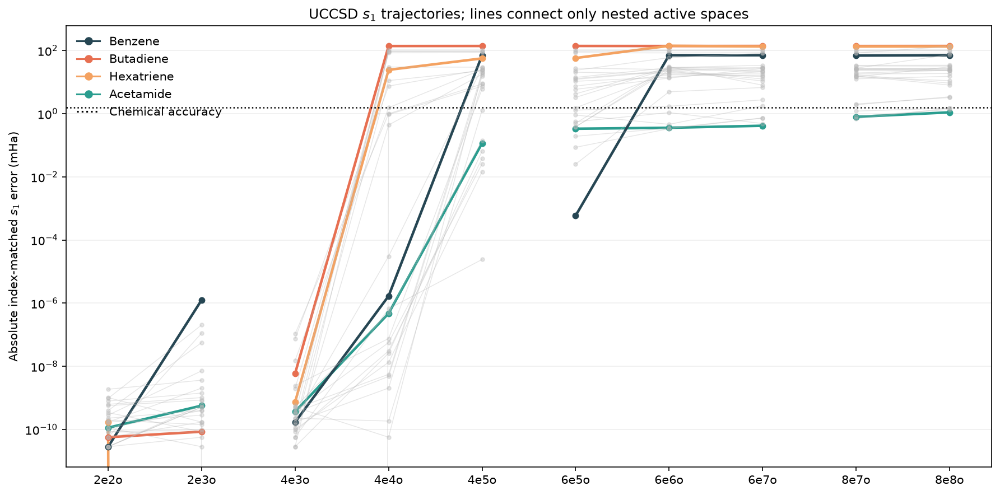

In [16]:
from matplotlib.lines import Line2D

STATE_ORDER = ["s0", "s1", "t1", "t2"]
ACTIVE_COLORS = {
    active_space: color
    for active_space, color in zip(
        active_spaces, plt.colormaps["viridis"](np.linspace(0.08, 0.92, len(active_spaces)))
    )
}


def plot_error_ecdfs(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = metrics.loc[metrics["state"] == state]
        for active_space in active_spaces:
            errors = np.sort(df_state.loc[
                df_state["active_space"] == active_space, "error_mHa"
            ].to_numpy())
            if len(errors):
                axis.step(errors, np.arange(1, len(errors) + 1) / len(errors), where="post",
                          color=ACTIVE_COLORS[active_space], linewidth=1.8)
        axis.axvline(CHEMICAL_ACCURACY_MHA, color="black", linestyle=":", linewidth=1.2)
        axis.set_xscale("log")
        axis.set_ylim(0, 1.02)
        axis.set_title(state)
        axis.grid(axis="x", alpha=0.2)

    figure.supxlabel("Absolute index-matched energy error (mHa)")
    figure.supylabel("Fraction of molecules at or below error")
    handles = [Line2D([0], [0], color=ACTIVE_COLORS[active_space], label=active_space)
               for active_space in active_spaces]
    handles.append(Line2D([0], [0], color="black", linestyle=":", label="Chemical accuracy"))
    figure.legend(handles=handles, loc="lower center", ncol=5, frameon=False)
    figure.suptitle("UCCSD low-state error distributions by active space", y=0.98)
    figure.tight_layout(rect=(0, 0.10, 1, 0.95))
    return figure


def plot_error_projection_strip(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 8), sharey=True)
    scatter = None

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = metrics.loc[metrics["state"] == state]
        for position, active_space in enumerate(active_spaces):
            df_active = df_state.loc[df_state["active_space"] == active_space]
            if df_active.empty:
                continue
            offsets = np.linspace(-0.23, 0.23, len(df_active))
            scatter = axis.scatter(
                df_active["error_mHa"], position + offsets, c=df_active["projection"],
                cmap="magma", vmin=0, vmax=1, s=28, edgecolor="white", linewidth=0.35,
                alpha=0.9, zorder=2,
            )
            q1, median, q3 = df_active["error_mHa"].quantile([0.25, 0.5, 0.75])
            axis.errorbar(
                median, position, xerr=np.array([[median - q1], [q3 - median]]),
                fmt="|", color="black", capsize=3, linewidth=1.4, zorder=3,
            )
        axis.axvline(CHEMICAL_ACCURACY_MHA, color="black", linestyle=":", linewidth=1.2)
        axis.set_xscale("log")
        axis.set_yticks(range(len(active_spaces)), active_spaces)
        axis.invert_yaxis()
        axis.set_title(state)
        axis.grid(axis="x", alpha=0.2)

    figure.supxlabel("Absolute index-matched energy error (mHa)")
    figure.supylabel("Active space")
    figure.suptitle("Molecule-level errors coloured by exact-state projection", y=0.98)
    figure.subplots_adjust(left=0.08, right=0.84, bottom=0.08, top=0.90, wspace=0.08, hspace=0.14)
    color_axis = figure.add_axes([0.88, 0.20, 0.018, 0.60])
    colorbar = figure.colorbar(scatter, cax=color_axis)
    colorbar.set_label("Exact-state projection onto QSE subspace")
    return figure


def plot_s1_performance_tiers(metrics):
    df_s1 = metrics.loc[metrics["state"] == "s1"]
    tiers = [
        ("At chemical accuracy", 0, CHEMICAL_ACCURACY_MHA, "#2A9D8F"),
        ("1.6–10 mHa", CHEMICAL_ACCURACY_MHA, 10, "#E9C46A"),
        ("10–50 mHa", 10, 50, "#F4A261"),
        (">50 mHa", 50, np.inf, "#E76F51"),
    ]
    figure, axis = plt.subplots(figsize=(9, 6))
    left = np.zeros(len(active_spaces))

    for label, lower, upper, color in tiers:
        fractions = []
        for active_space in active_spaces:
            errors = df_s1.loc[df_s1["active_space"] == active_space, "error_mHa"]
            fractions.append(100 * ((errors >= lower) & (errors < upper)).mean())
        axis.barh(active_spaces, fractions, left=left, color=color, height=0.72, label=label)
        left += fractions

    axis.set_xlim(0, 100)
    axis.set_xlabel("Molecules (%)")
    axis.set_title("UCCSD $s_1$ error performance tiers")
    axis.legend(loc="lower center", bbox_to_anchor=(0.5, -0.22), ncol=2, frameon=False)
    axis.invert_yaxis()
    axis.grid(axis="x", alpha=0.2)
    figure.tight_layout()
    return figure


def plot_s1_nested_trajectories(metrics):
    df_s1 = metrics.loc[metrics["state"] == "s1"]
    trajectories = df_s1.pivot(index="molecule", columns="active_space", values="error_mHa")
    active_positions = {active_space: position for position, active_space in enumerate(active_spaces)}
    nested_segments = [
        ["2e2o", "2e3o"],
        ["4e3o", "4e4o", "4e5o"],
        ["6e5o", "6e6o", "6e7o"],
        ["8e7o", "8e8o"],
    ]
    highlighted = {
        "Benzene": "#264653", "Butadiene": "#E76F51",
        "Hexatriene": "#F4A261", "Acetamide": "#2A9D8F",
    }
    figure, axis = plt.subplots(figsize=(12, 6))

    for molecule, values in trajectories.iterrows():
        color = highlighted.get(molecule, "#B8B8B8")
        linewidth = 2.2 if molecule in highlighted else 0.7
        alpha = 1.0 if molecule in highlighted else 0.35
        for segment in nested_segments:
            points = values.reindex(segment).dropna()
            axis.plot(
                [active_positions[active_space] for active_space in points.index],
                points.to_numpy(), color=color, linewidth=linewidth, alpha=alpha,
            )
        axis.scatter(
            [active_positions[active_space] for active_space in values.dropna().index],
            values.dropna().to_numpy(), color=color, s=22 if molecule in highlighted else 10,
            alpha=alpha, zorder=3,
        )

    axis.axhline(CHEMICAL_ACCURACY_MHA, color="black", linestyle=":", linewidth=1.2,
                 label="Chemical accuracy")
    axis.set_yscale("log")
    axis.set_xticks(range(len(active_spaces)), active_spaces)
    axis.set_ylabel("Absolute index-matched $s_1$ error (mHa)")
    axis.set_title("UCCSD $s_1$ trajectories; lines connect only nested active spaces")
    handles = [Line2D([0], [0], color=color, marker="o", label=molecule)
               for molecule, color in highlighted.items()]
    handles.append(Line2D([0], [0], color="black", linestyle=":", label="Chemical accuracy"))
    axis.legend(handles=handles, loc="upper left", frameon=False)
    axis.grid(axis="y", alpha=0.2)
    figure.tight_layout()
    return figure


error_ecdf_figure = plot_error_ecdfs(df_low_state_metrics)
error_projection_strip_figure = plot_error_projection_strip(df_low_state_metrics)
s1_tier_figure = plot_s1_performance_tiers(df_low_state_metrics)
s1_trajectory_figure = plot_s1_nested_trajectories(df_low_state_metrics)
show_scrollable_figs([
    error_ecdf_figure, error_projection_strip_figure,
    s1_tier_figure, s1_trajectory_figure,
])



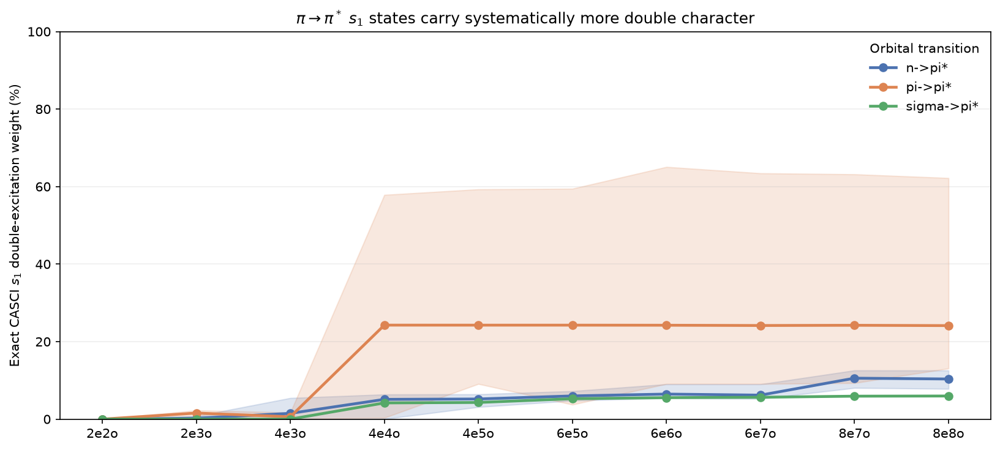
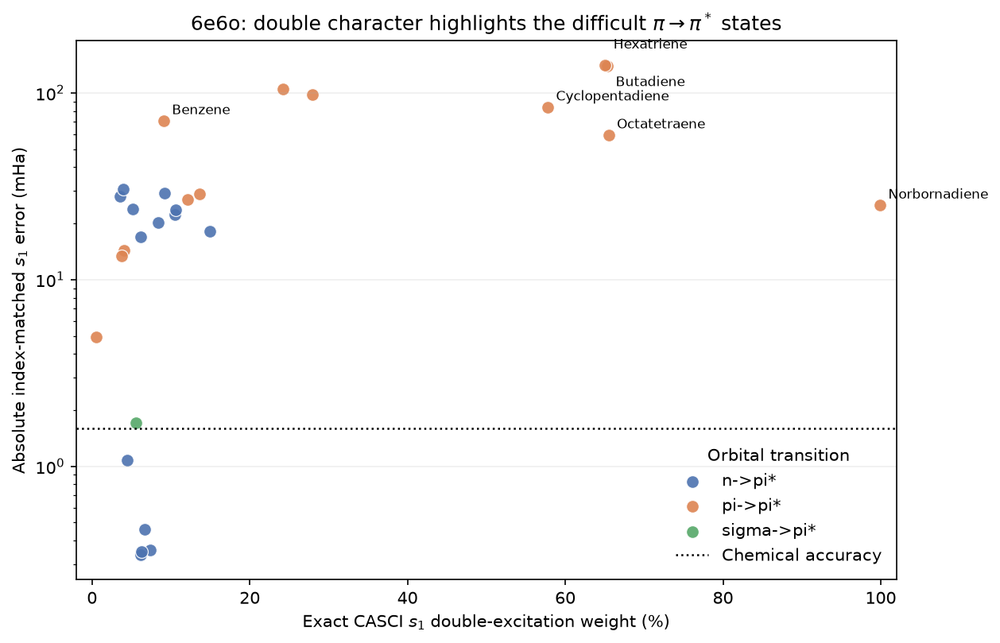

In [17]:
TRANSITION_COLORS = {
    "n->pi*": "#4C72B0", "pi->pi*": "#DD8452", "sigma->pi*": "#55A868",
}


df_s1_double_character = df_exact_excitation_composition.loc[
    df_exact_excitation_composition["state"] == "s1",
    ["molecule", "active_space", "orbital_type", "singles", "doubles"],
].copy()
df_s1_double_character = df_s1_double_character.loc[
    df_s1_double_character["orbital_type"].isin(TRANSITION_COLORS)
]


def plot_s1_double_weight_scaling(composition):
    figure, axis = plt.subplots(figsize=(11, 5))

    for transition, color in TRANSITION_COLORS.items():
        rows = []
        for position, active_space in enumerate(active_spaces):
            values = composition.loc[
                (composition["active_space"] == active_space)
                & (composition["orbital_type"] == transition), "doubles"
            ]
            if len(values):
                rows.append((position, values.quantile(0.25), values.median(), values.quantile(0.75)))
        if not rows:
            continue
        positions, lower, median, upper = map(np.asarray, zip(*rows))
        axis.fill_between(positions, lower, upper, color=color, alpha=0.18)
        axis.plot(positions, median, marker="o", linewidth=2.2, color=color, label=transition)

    axis.set_xticks(range(len(active_spaces)), active_spaces)
    axis.set_ylim(0, 100)
    axis.set_ylabel("Exact CASCI $s_1$ double-excitation weight (%)")
    axis.set_title(r"$\pi\rightarrow\pi^*$ $s_1$ states carry systematically more double character")
    axis.legend(title="Orbital transition", frameon=False)
    axis.grid(axis="y", alpha=0.2)
    figure.tight_layout()
    return figure


def plot_s1_error_against_doubles(composition, metrics):
    errors = metrics.loc[
        (metrics["active_space"] == "6e6o") & (metrics["state"] == "s1"),
        ["molecule", "error_mHa"],
    ]
    df_plot = composition.loc[
        composition["active_space"] == "6e6o"
    ].merge(errors, on="molecule", validate="one_to_one")

    figure, axis = plt.subplots(figsize=(8.5, 5.5))
    for transition, group in df_plot.groupby("orbital_type", sort=False):
        axis.scatter(
            group["doubles"], group["error_mHa"], s=58,
            color=TRANSITION_COLORS[transition], edgecolor="white", linewidth=0.6,
            label=transition, alpha=0.9,
        )

    label_offsets = {
        "Norbornadiene": (5, 4), "Butadiene": (5, -12),
        "Cyclopentadiene": (5, 4), "Hexatriene": (5, 10),
        "Octatetraene": (5, 4), "Benzene": (5, 4),
    }
    for molecule, offset in label_offsets.items():
        row = df_plot.loc[df_plot["molecule"] == molecule]
        if not row.empty:
            axis.annotate(
                molecule, (row["doubles"].iloc[0], row["error_mHa"].iloc[0]),
                xytext=offset, textcoords="offset points", fontsize=8,
            )

    axis.axhline(CHEMICAL_ACCURACY_MHA, color="black", linestyle=":", linewidth=1.2,
                 label="Chemical accuracy")
    axis.set_yscale("log")
    axis.set_xlim(-2, 102)
    axis.set_xlabel("Exact CASCI $s_1$ double-excitation weight (%)")
    axis.set_ylabel("Absolute index-matched $s_1$ error (mHa)")
    axis.set_title(r"6e6o: double character highlights the difficult $\pi\rightarrow\pi^*$ states")
    axis.legend(title="Orbital transition", frameon=False)
    axis.grid(axis="y", alpha=0.2)
    figure.tight_layout()
    return figure


s1_double_weight_figure = plot_s1_double_weight_scaling(df_s1_double_character)
s1_double_error_figure = plot_s1_error_against_doubles(
    df_s1_double_character, df_low_state_metrics
)
show_scrollable_figs([s1_double_weight_figure, s1_double_error_figure])


### Broader low-state and selected-doubles views

These scratch plots use error tiers to retain the near-exact and high-error populations that a single IQR can hide.


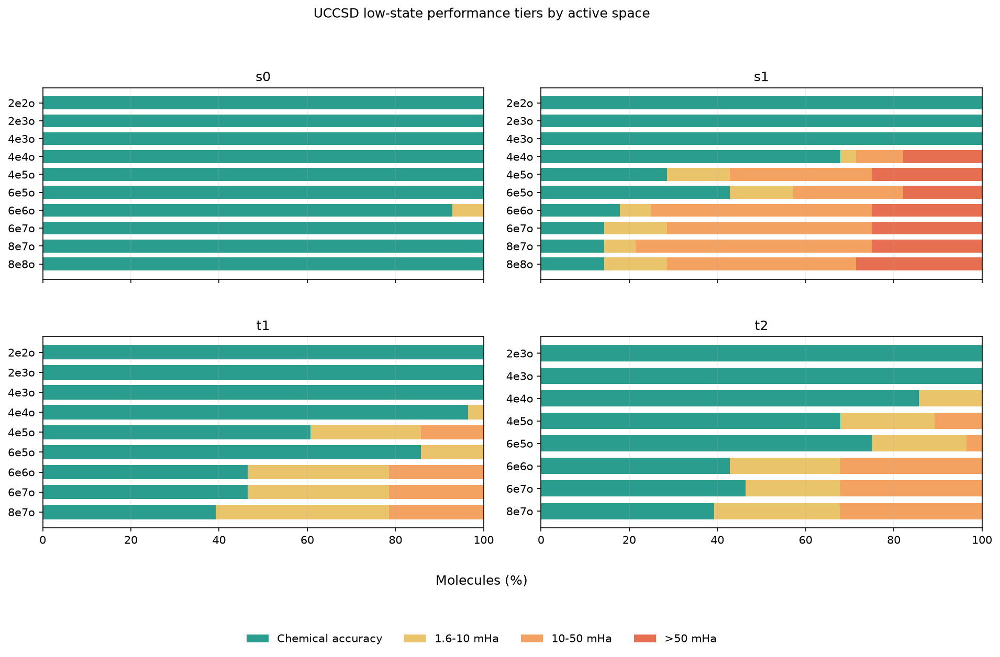
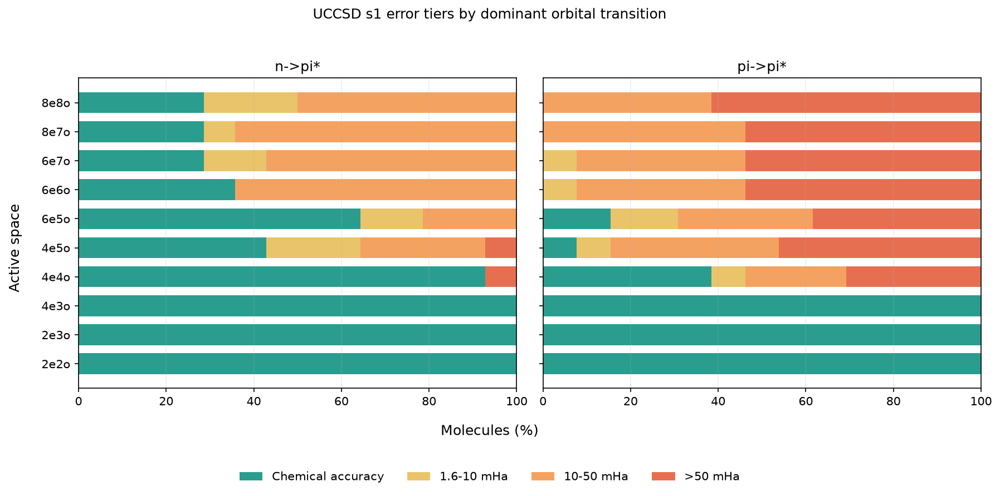

In [18]:
from matplotlib.patches import Patch


TIER_DEFINITIONS = [
    ('Chemical accuracy', 0, CHEMICAL_ACCURACY_MHA, '#2A9D8F'),
    ('1.6-10 mHa', CHEMICAL_ACCURACY_MHA, 10, '#E9C46A'),
    ('10-50 mHa', 10, 50, '#F4A261'),
    ('>50 mHa', 50, np.inf, '#E76F51'),
]


def get_tier_fractions(errors):
    return np.array([
        100 * ((errors >= lower) & (errors < upper)).mean()
        for _, lower, upper, _ in TIER_DEFINITIONS
    ])


def plot_low_state_performance_tiers(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 8.5), sharex=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = metrics.loc[metrics['state'] == state]
        spaces = [
            active_space for active_space in active_spaces
            if not df_state.loc[df_state['active_space'] == active_space].empty
        ]
        left = np.zeros(len(spaces))

        for label, _, _, color in TIER_DEFINITIONS:
            tier_index = [tier[0] for tier in TIER_DEFINITIONS].index(label)
            fractions = np.array([
                get_tier_fractions(
                    df_state.loc[df_state['active_space'] == active_space, 'error_mHa']
                )[tier_index]
                for active_space in spaces
            ])
            axis.barh(spaces, fractions, left=left, color=color, height=0.72)
            left += fractions

        axis.set_xlim(0, 100)
        axis.set_title(state)
        axis.invert_yaxis()
        axis.grid(axis='x', alpha=0.2)

    figure.supxlabel('Molecules (%)', y=0.11)
    figure.suptitle('UCCSD low-state performance tiers by active space', y=0.98)
    handles = [Patch(facecolor=color, label=label) for label, _, _, color in TIER_DEFINITIONS]
    figure.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, 0.01),
                  ncol=4, frameon=False)
    figure.subplots_adjust(left=0.07, right=0.99, bottom=0.20, top=0.86,
                            wspace=0.13, hspace=0.30)
    return figure


def plot_s1_transition_tiers(metrics, orbital_errors):
    figure, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

    for axis, transition in zip(axes, ('n->pi*', 'pi->pi*')):
        df_transition = orbital_errors.loc[orbital_errors['orbital_type'] == transition]
        spaces = [
            active_space for active_space in active_spaces
            if not df_transition.loc[df_transition['active_space'] == active_space].empty
        ]
        left = np.zeros(len(spaces))

        for label, _, _, color in TIER_DEFINITIONS:
            tier_index = [tier[0] for tier in TIER_DEFINITIONS].index(label)
            fractions = np.array([
                get_tier_fractions(
                    df_transition.loc[
                        df_transition['active_space'] == active_space, 'error_mHa'
                    ]
                )[tier_index]
                for active_space in spaces
            ])
            axis.barh(spaces, fractions, left=left, color=color, height=0.72)
            left += fractions

        axis.set_xlim(0, 100)
        axis.set_title(transition)
        axis.invert_yaxis()
        axis.grid(axis='x', alpha=0.2)

    figure.supxlabel('Molecules (%)', y=0.12)
    figure.supylabel('Active space')
    figure.suptitle('UCCSD s1 error tiers by dominant orbital transition', y=0.98)
    handles = [Patch(facecolor=color, label=label) for label, _, _, color in TIER_DEFINITIONS]
    figure.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, 0.01),
                  ncol=4, frameon=False)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.22, top=0.84, wspace=0.06)
    return figure


df_s1_labels = df_orbital_errors.loc[
    df_orbital_errors['expansion'] == 'singlet',
    ['molecule', 'active_space', 'S1_Orb'],
].rename(columns={'S1_Orb': 'orbital_type'})
df_s1_transition_metrics = (
    df_low_state_metrics.loc[
        df_low_state_metrics['state'] == 's1',
        ['molecule', 'active_space', 'error_mHa'],
    ].merge(df_s1_labels, on=['molecule', 'active_space'], validate='one_to_one')
)
df_s1_transition_metrics = df_s1_transition_metrics.loc[
    df_s1_transition_metrics['orbital_type'].isin(('n->pi*', 'pi->pi*'))
]

low_state_tier_figure = plot_low_state_performance_tiers(df_low_state_metrics)
s1_transition_tier_figure = plot_s1_transition_tiers(
    df_low_state_metrics, df_s1_transition_metrics
)
show_scrollable_figs([low_state_tier_figure, s1_transition_tier_figure])



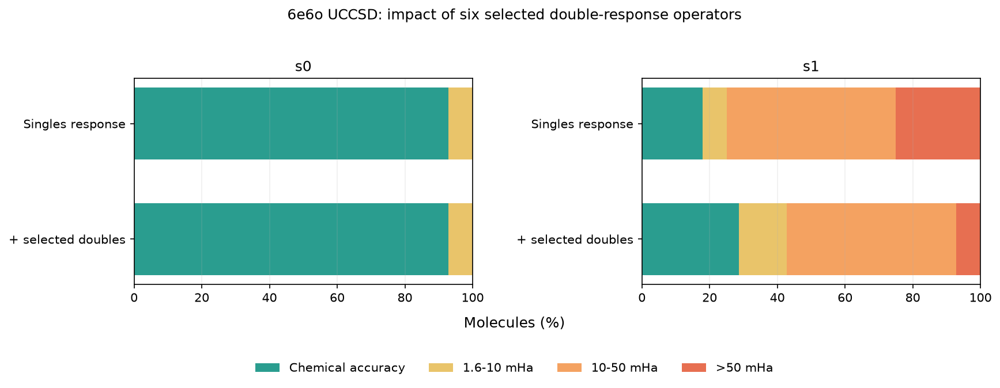
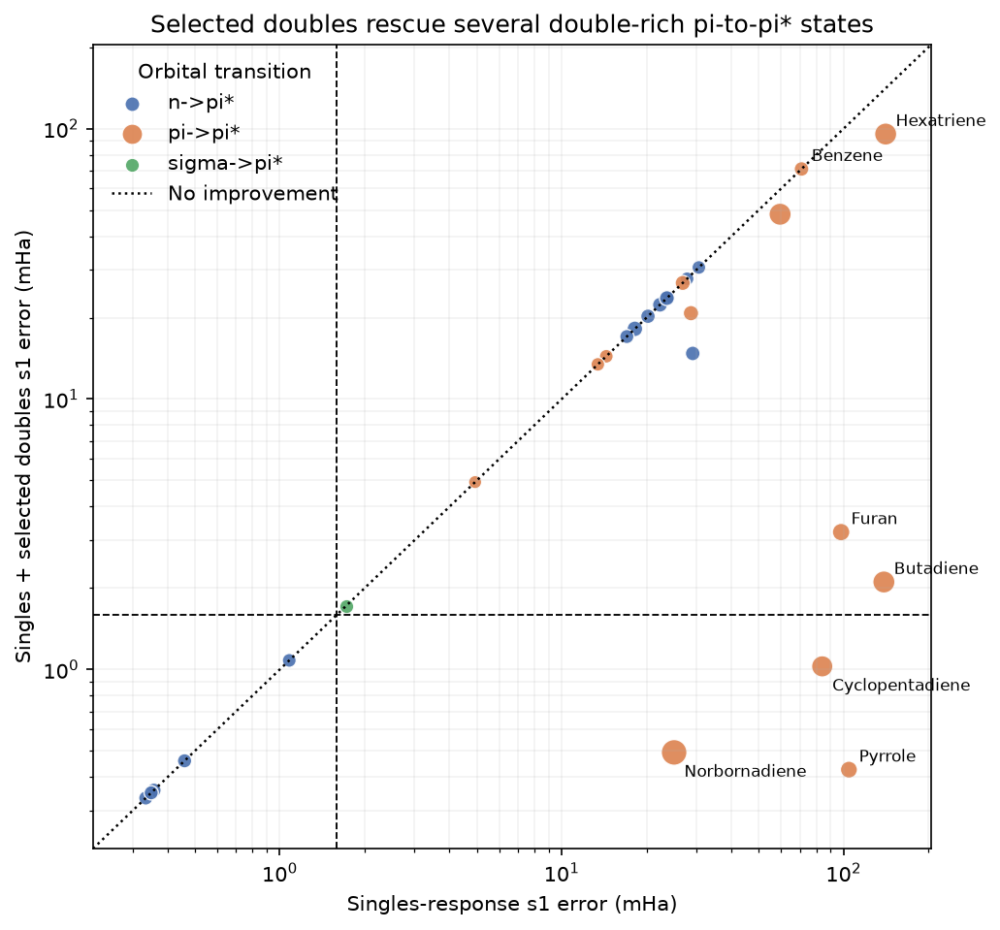

In [19]:
SELECTED_DOUBLES_DIR = DATA_DIR / 'raw_matrices' / 'SV_hamiltonian_select_doubles'

df_standard_singlet = df_orbital_errors.loc[
    (df_orbital_errors['active_space'] == '6e6o')
    & (df_orbital_errors['expansion'] == 'singlet'),
    ['molecule', 'S1_Orb', 'pyscf_casci_energies', 's0_error', 's1_error'],
].set_index('molecule')
selected_doubles_records = []

for path in sorted(SELECTED_DOUBLES_DIR.glob('*_UCCSD.npz')):
    selected = read_npz(path)
    molecule = selected['molecule']
    qse_energies, _ = dimension_solve(selected['H'], selected['S'], selected['S'].shape[0])
    exact_energies = df_standard_singlet.loc[molecule, 'pyscf_casci_energies']
    selected_doubles_records.append({
        'molecule': molecule,
        's0_selected_error': 1000 * abs(qse_energies[0] - exact_energies[0]),
        's1_selected_error': 1000 * abs(qse_energies[1] - exact_energies[1]),
    })

df_selected_doubles = (
    pd.DataFrame(selected_doubles_records)
    .merge(df_standard_singlet.reset_index(), on='molecule', validate='one_to_one')
    .merge(
        df_s1_double_character.loc[
            df_s1_double_character['active_space'] == '6e6o', ['molecule', 'doubles']
        ],
        on='molecule', validate='one_to_one',
    )
    .rename(columns={'s0_error': 's0_standard_error', 's1_error': 's1_standard_error',
                     'S1_Orb': 'orbital_type'})
)
df_selected_doubles['s1_improvement_mHa'] = (
    df_selected_doubles['s1_standard_error'] - df_selected_doubles['s1_selected_error']
)


def plot_selected_doubles_tiers(selected_doubles):
    figure, axes = plt.subplots(1, 2, figsize=(11, 4.5), sharex=True)

    for axis, state in zip(axes, ('s0', 's1')):
        left = np.zeros(2)
        errors = [
            selected_doubles[f'{state}_standard_error'],
            selected_doubles[f'{state}_selected_error'],
        ]
        for tier_index, (label, _, _, color) in enumerate(TIER_DEFINITIONS):
            fractions = np.array([get_tier_fractions(values)[tier_index] for values in errors])
            axis.barh(['Singles response', '+ selected doubles'], fractions, left=left,
                      color=color, height=0.62)
            left += fractions
        axis.set_xlim(0, 100)
        axis.set_title(state)
        axis.invert_yaxis()
        axis.grid(axis='x', alpha=0.2)

    figure.supxlabel('Molecules (%)', y=0.15)
    figure.suptitle('6e6o UCCSD: impact of six selected double-response operators', y=0.98)
    handles = [Patch(facecolor=color, label=label) for label, _, _, color in TIER_DEFINITIONS]
    figure.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, 0.01),
                  ncol=4, frameon=False)
    figure.subplots_adjust(left=0.10, right=0.99, bottom=0.27, top=0.80, wspace=0.50)
    return figure


def plot_selected_doubles_scatter(selected_doubles):
    figure, axis = plt.subplots(figsize=(7, 6.5))

    for transition, group in selected_doubles.groupby('orbital_type', sort=False):
        axis.scatter(
            group['s1_standard_error'], group['s1_selected_error'],
            s=42 + 1.2 * group['doubles'], color=TRANSITION_COLORS[transition],
            edgecolor='white', linewidth=0.65, alpha=0.92, label=transition,
        )

    limits = np.array([
        selected_doubles[['s1_standard_error', 's1_selected_error']].min().min() * 0.65,
        selected_doubles[['s1_standard_error', 's1_selected_error']].max().max() * 1.45,
    ])
    axis.plot(limits, limits, color='black', linestyle=':', linewidth=1.2,
              label='No improvement')
    axis.set_xscale('log')
    axis.set_yscale('log')
    axis.set_xlim(limits)
    axis.set_ylim(limits)

    label_offsets = {
        'Butadiene': (5, 4), 'Cyclopentadiene': (5, -12), 'Furan': (5, 4),
        'Norbornadiene': (5, -12), 'Pyrrole': (5, 4), 'Benzene': (5, 4),
        'Hexatriene': (5, 4),
    }
    for molecule, offset in label_offsets.items():
        row = selected_doubles.loc[selected_doubles['molecule'] == molecule]
        if not row.empty:
            axis.annotate(
                molecule, (row['s1_standard_error'].iloc[0], row['s1_selected_error'].iloc[0]),
                xytext=offset, textcoords='offset points', fontsize=8,
            )

    axis.axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle='--', linewidth=0.9)
    axis.axvline(CHEMICAL_ACCURACY_MHA, color='black', linestyle='--', linewidth=0.9)
    axis.set_xlabel('Singles-response s1 error (mHa)')
    axis.set_ylabel('Singles + selected doubles s1 error (mHa)')
    axis.set_title('Selected doubles rescue several double-rich pi-to-pi* states')
    axis.legend(title='Orbital transition', frameon=False, loc='upper left')
    axis.grid(which='both', alpha=0.16)
    figure.tight_layout()
    return figure


selected_doubles_tier_figure = plot_selected_doubles_tiers(df_selected_doubles)
selected_doubles_scatter_figure = plot_selected_doubles_scatter(df_selected_doubles)
show_scrollable_figs([selected_doubles_tier_figure, selected_doubles_scatter_figure])



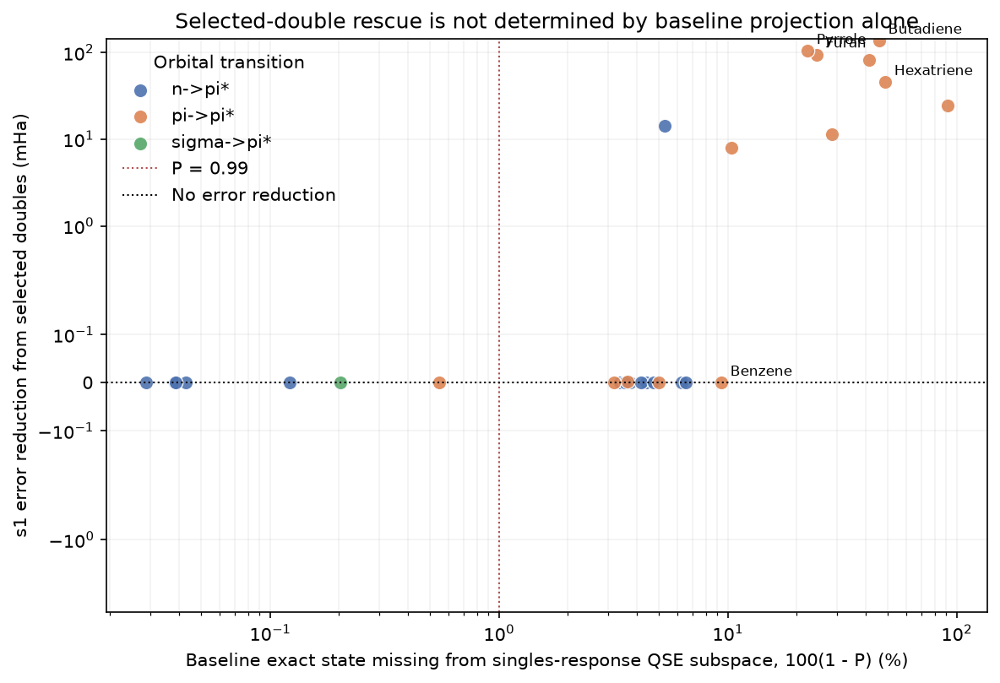

In [118]:
df_selected_doubles_projection = get_selected_doubles_projection(
    df_selected_doubles, df_representability
)
selected_doubles_projection_figure = plot_selected_doubles_projection(
    df_selected_doubles_projection
)
show_scrollable_figs([selected_doubles_projection_figure])


### Do the same roots remain accurate?

Chemical accuracy is tested for the same indexed physical root. Retention is only compared within electron-count blocks whose active spaces are nested.

active_space,2e2o,2e3o,4e3o,4e4o,4e5o,6e5o,6e6o,6e7o,8e7o,8e8o
molecule,,,,,,,,,,
Acetamide,0.0,0.0,0.0,0.00,0.116,0.334,0.358,0.415,0.794,1.102
Ethene,0.0,0.0,0.0,0.00,0.015,0.025,4.929,6.746,12.707,15.219
Benzene,0.0,0.0,0.0,0.00,70.885,0.001,70.902,70.912,69.203,70.928
Butadiene,0.0,0.0,0.0,138.76,139.176,139.390,138.928,139.404,138.835,139.228



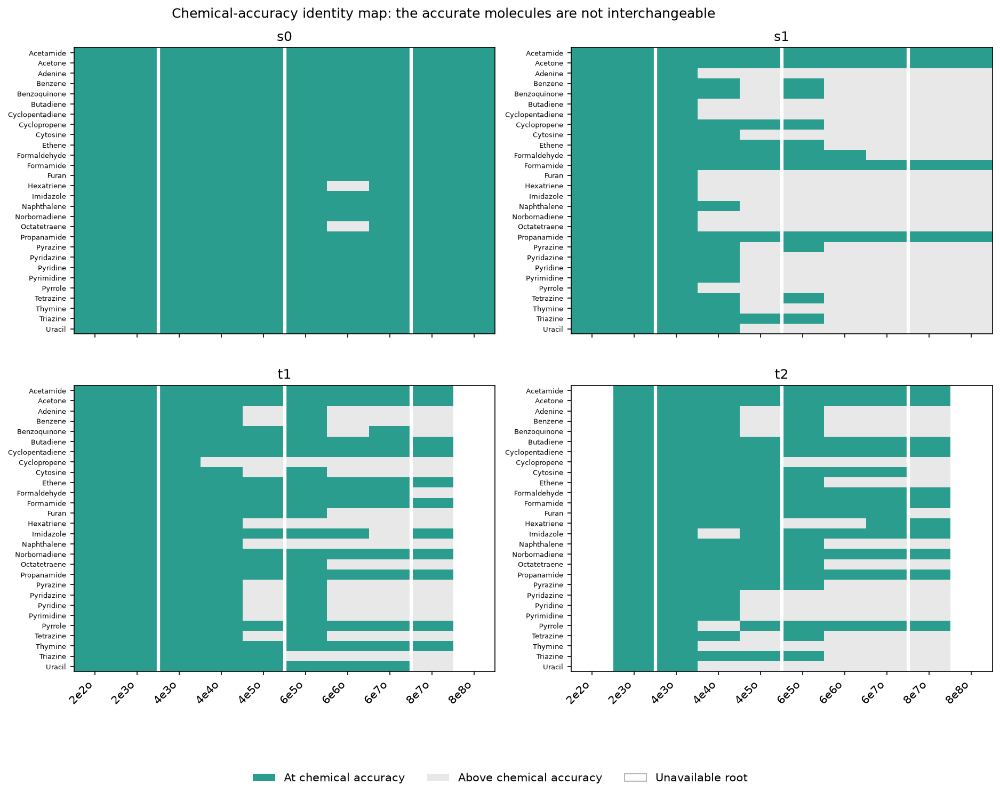
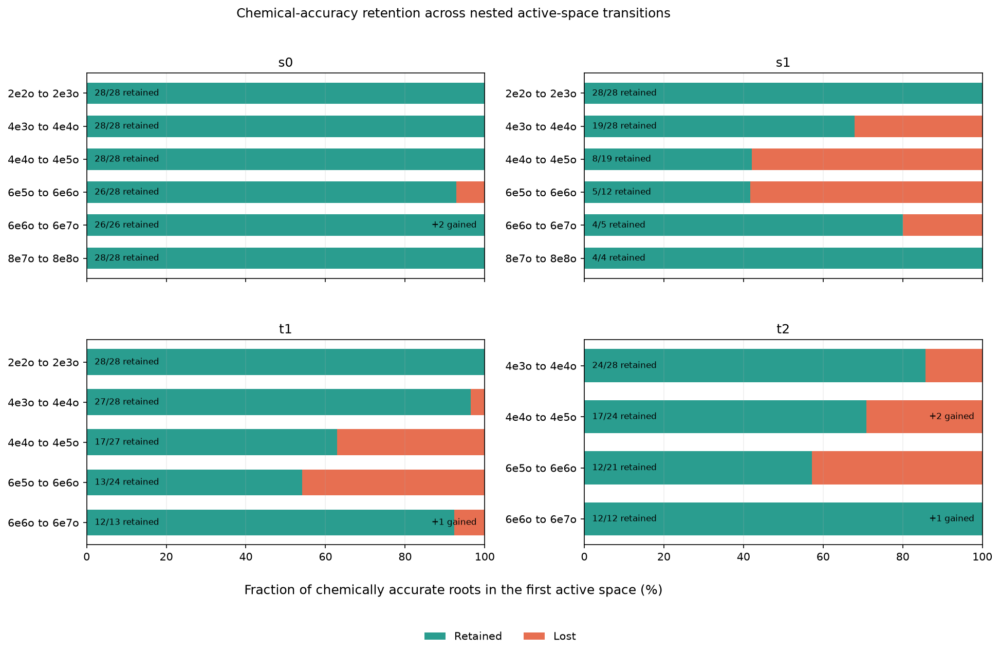
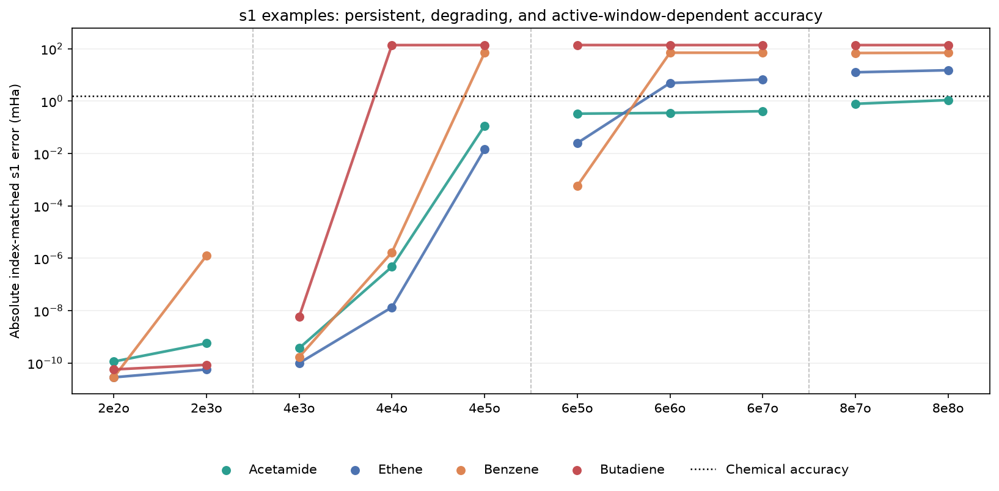

In [119]:
from matplotlib.colors import ListedColormap


NESTED_TRANSITIONS = [
    ('2e2o', '2e3o'), ('4e3o', '4e4o'), ('4e4o', '4e5o'),
    ('6e5o', '6e6o'), ('6e6o', '6e7o'), ('8e7o', '8e8o'),
]
molecule_order = sorted(df_uccsd['molecule'].unique())


def get_accuracy_membership(metrics):
    return {
        state: metrics.loc[metrics['state'] == state]
        .pivot(index='molecule', columns='active_space', values='error_mHa')
        .reindex(index=molecule_order, columns=active_spaces)
        for state in STATE_ORDER
    }


def get_accuracy_retention(membership):
    records = []
    for state, errors in membership.items():
        for first_space, second_space in NESTED_TRANSITIONS:
            if (first_space not in errors or second_space not in errors
                    or errors[first_space].isna().all() or errors[second_space].isna().all()):
                continue
            first_good = errors[first_space] <= CHEMICAL_ACCURACY_MHA
            second_good = errors[second_space] <= CHEMICAL_ACCURACY_MHA
            num_first_good = first_good.sum()
            if not num_first_good:
                continue
            records.append({
                'state': state, 'transition': f'{first_space} to {second_space}',
                'num_first_good': num_first_good,
                'num_retained': (first_good & second_good).sum(),
                'num_lost': (first_good & ~second_good).sum(),
                'num_gained': (~first_good & second_good).sum(),
            })
    return pd.DataFrame(records)


def plot_accuracy_membership(membership):
    figure, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    color_map = ListedColormap(['#E8E8E8', '#2A9D8F'])

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        accurate = (membership[state] <= CHEMICAL_ACCURACY_MHA).to_numpy(dtype=float)
        accurate[np.isnan(membership[state].to_numpy())] = np.nan
        color_map.set_bad('#FFFFFF')
        axis.imshow(np.ma.masked_invalid(accurate), cmap=color_map, vmin=0, vmax=1, aspect='auto')
        for boundary in (1.5, 4.5, 7.5):
            axis.axvline(boundary, color='white', linewidth=3)
        axis.set_xticks(range(len(active_spaces)), active_spaces, rotation=45, ha='right')
        axis.set_yticks(range(len(molecule_order)), molecule_order, fontsize=6)
        axis.set_title(state)

    figure.suptitle('Chemical-accuracy identity map: the accurate molecules are not interchangeable', y=0.98)
    handles = [
        Patch(facecolor='#2A9D8F', label='At chemical accuracy'),
        Patch(facecolor='#E8E8E8', label='Above chemical accuracy'),
        Patch(facecolor='#FFFFFF', edgecolor='#B8B8B8', label='Unavailable root'),
    ]
    figure.legend(handles=handles, loc='lower center', ncol=3, frameon=False)
    figure.subplots_adjust(left=0.17, right=0.99, bottom=0.15, top=0.93, wspace=0.18, hspace=0.18)
    return figure


def plot_accuracy_retention(retention):
    figure, axes = plt.subplots(2, 2, figsize=(14, 8.5), sharex=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = retention.loc[retention['state'] == state].copy()
        retained = 100 * df_state['num_retained'] / df_state['num_first_good']
        lost = 100 - retained
        axis.barh(df_state['transition'], retained, color='#2A9D8F', height=0.65, label='Retained')
        axis.barh(df_state['transition'], lost, left=retained, color='#E76F51',
                  height=0.65, label='Lost')
        for position, row in df_state.reset_index(drop=True).iterrows():
            axis.text(2, position, f"{row['num_retained']}/{row['num_first_good']} retained",
                      va='center', fontsize=8)
            if row['num_gained']:
                axis.text(98, position, f"+{row['num_gained']} gained", ha='right', va='center', fontsize=8)
        axis.set_xlim(0, 100)
        axis.set_title(state)
        axis.invert_yaxis()
        axis.grid(axis='x', alpha=0.2)

    figure.supxlabel('Fraction of chemically accurate roots in the first active space (%)', y=0.08)
    figure.suptitle('Chemical-accuracy retention across nested active-space transitions', y=0.98)
    handles = [Patch(facecolor='#2A9D8F', label='Retained'), Patch(facecolor='#E76F51', label='Lost')]
    figure.legend(handles=handles, loc='lower center', ncol=2, frameon=False)
    figure.subplots_adjust(left=0.16, right=0.99, bottom=0.16, top=0.88, wspace=0.25, hspace=0.30)
    return figure


def plot_s1_accuracy_examples(membership):
    examples = {
        'Acetamide': '#2A9D8F', 'Ethene': '#4C72B0',
        'Benzene': '#DD8452', 'Butadiene': '#C44E52',
    }
    errors = membership['s1']
    positions = {active_space: index for index, active_space in enumerate(active_spaces)}
    figure, axis = plt.subplots(figsize=(11, 5.5))

    for molecule, color in examples.items():
        values = errors.loc[molecule]
        for first_space, second_space in NESTED_TRANSITIONS:
            axis.plot(
                [positions[first_space], positions[second_space]],
                [values[first_space], values[second_space]],
                color=color, linewidth=2.1, alpha=0.9,
            )
        axis.scatter(range(len(active_spaces)), values, color=color, s=38, label=molecule, zorder=3)

    for boundary in (1.5, 4.5, 7.5):
        axis.axvline(boundary, color='#B8B8B8', linewidth=0.8, linestyle='--')
    axis.axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.2,
                 label='Chemical accuracy')
    axis.set_yscale('log')
    axis.set_xticks(range(len(active_spaces)), active_spaces)
    axis.set_ylabel('Absolute index-matched s1 error (mHa)')
    axis.set_title('s1 examples: persistent, degrading, and active-window-dependent accuracy')
    axis.legend(ncol=5, loc='upper center', bbox_to_anchor=(0.5, -0.16), frameon=False)
    axis.grid(axis='y', alpha=0.2)
    figure.tight_layout()
    return figure


accuracy_membership = get_accuracy_membership(df_low_state_metrics)
df_accuracy_retention = get_accuracy_retention(accuracy_membership)
df_s1_accuracy_examples = accuracy_membership['s1'].loc[
    ['Acetamide', 'Ethene', 'Benzene', 'Butadiene']
]

accuracy_membership_figure = plot_accuracy_membership(accuracy_membership)
accuracy_retention_figure = plot_accuracy_retention(df_accuracy_retention)
s1_accuracy_example_figure = plot_s1_accuracy_examples(accuracy_membership)
display(df_s1_accuracy_examples.round(3))
show_scrollable_figs([
    accuracy_membership_figure, accuracy_retention_figure, s1_accuracy_example_figure
])


### Alternative active-space error views

Each option below contains the same molecule-level UCCSD errors as the IQR plot, but foregrounds a different aspect of the distribution.


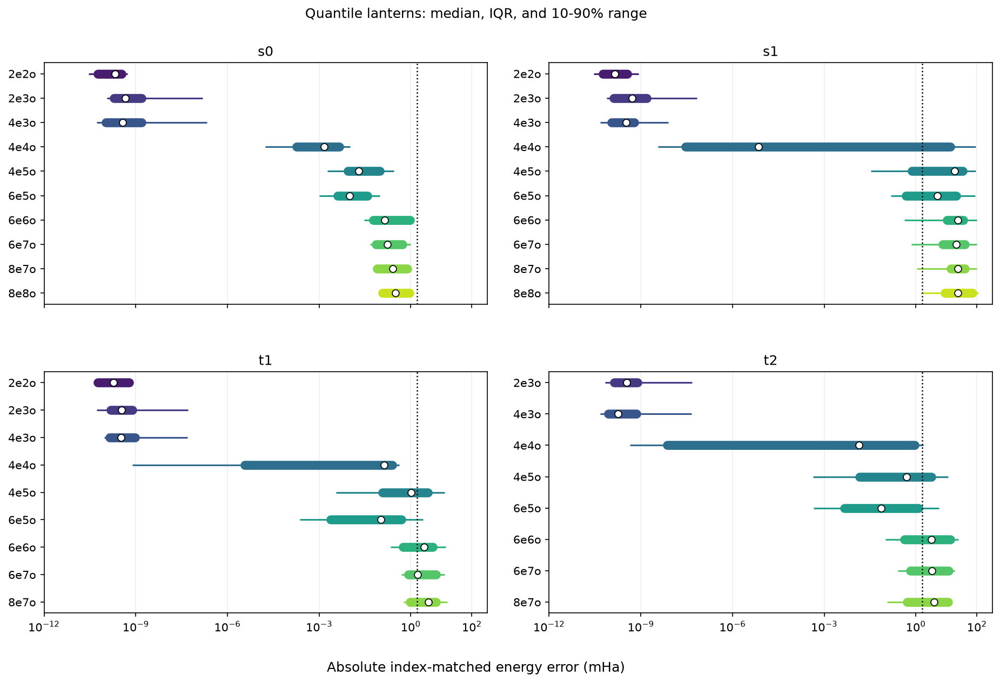
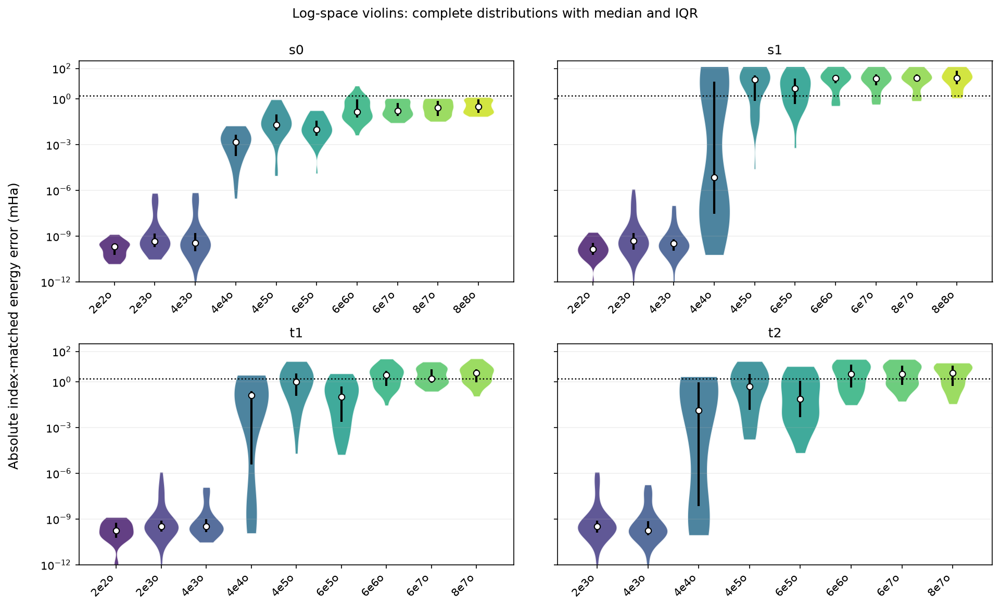
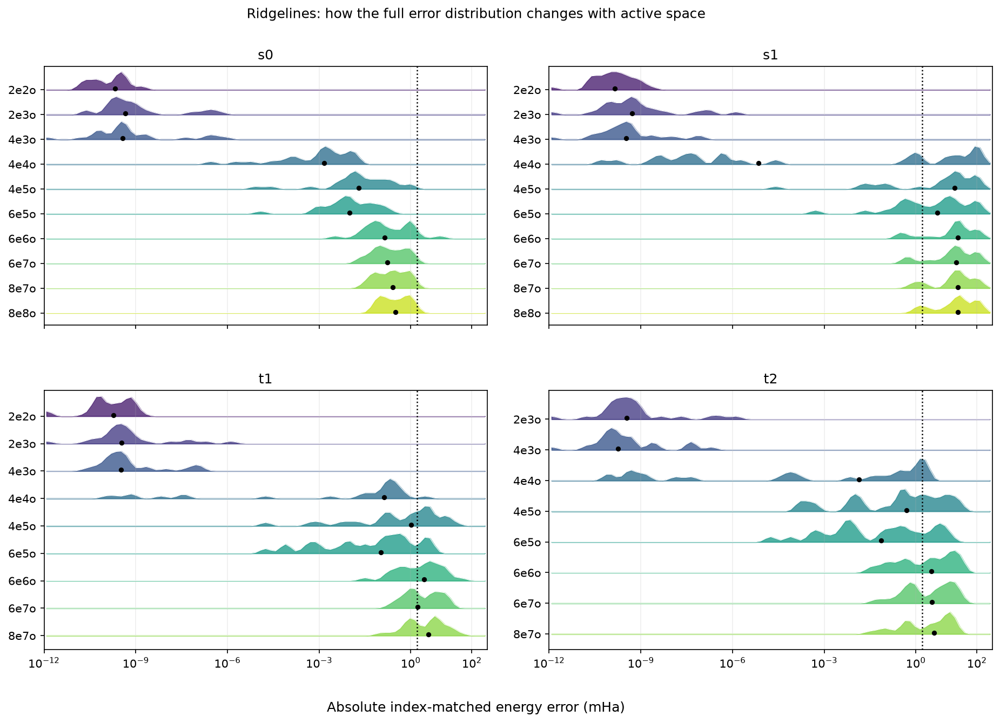

In [120]:
LOG_ERROR_LIMITS = (-12, 2.5)
LOG_ERROR_TICKS = [-12, -9, -6, -3, 0, 2]


def get_log_errors(errors):
    return np.log10(np.maximum(np.asarray(errors, dtype=float), 1e-12))


def format_log_error_axis(axis):
    axis.set_xlim(*LOG_ERROR_LIMITS)
    axis.set_xticks(LOG_ERROR_TICKS, [rf'$10^{{{tick}}}$' for tick in LOG_ERROR_TICKS])
    axis.axvline(np.log10(CHEMICAL_ACCURACY_MHA), color='black', linestyle=':', linewidth=1.2)
    axis.grid(axis='x', alpha=0.2)


def plot_error_lanterns(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 8.5), sharex=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = metrics.loc[metrics['state'] == state]
        spaces = [
            active_space for active_space in active_spaces
            if not df_state.loc[df_state['active_space'] == active_space].empty
        ]
        for position, active_space in enumerate(spaces):
            values = get_log_errors(
                df_state.loc[df_state['active_space'] == active_space, 'error_mHa']
            )
            q10, q25, median, q75, q90 = np.quantile(values, [0.10, 0.25, 0.50, 0.75, 0.90])
            axis.hlines(position, q10, q90, color=ACTIVE_COLORS[active_space], linewidth=1.5)
            axis.hlines(position, q25, q75, color=ACTIVE_COLORS[active_space], linewidth=8,
                        capstyle='round')
            axis.scatter(median, position, color='white', edgecolor='black', linewidth=0.8,
                         s=38, zorder=3)
        axis.set_yticks(range(len(spaces)), spaces)
        axis.invert_yaxis()
        axis.set_title(state)
        format_log_error_axis(axis)

    figure.supxlabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Quantile lanterns: median, IQR, and 10-90% range', y=0.98)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.10, top=0.90, wspace=0.14, hspace=0.28)
    return figure


def plot_log_error_violins(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 8.5), sharey=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = metrics.loc[metrics['state'] == state]
        spaces = [
            active_space for active_space in active_spaces
            if not df_state.loc[df_state['active_space'] == active_space].empty
        ]
        values = [get_log_errors(
            df_state.loc[df_state['active_space'] == active_space, 'error_mHa']
        ) for active_space in spaces]
        violins = axis.violinplot(values, positions=range(len(spaces)), widths=0.78,
                                  showmeans=False, showmedians=False, showextrema=False)
        for body, active_space in zip(violins['bodies'], spaces):
            body.set_facecolor(ACTIVE_COLORS[active_space])
            body.set_edgecolor('white')
            body.set_alpha(0.85)
        for position, values_for_space in enumerate(values):
            q25, median, q75 = np.quantile(values_for_space, [0.25, 0.50, 0.75])
            axis.vlines(position, q25, q75, color='black', linewidth=2.0, zorder=3)
            axis.scatter(position, median, color='white', edgecolor='black', s=30, zorder=4)
        axis.set_xticks(range(len(spaces)), spaces, rotation=45, ha='right')
        axis.set_ylim(*LOG_ERROR_LIMITS)
        axis.axhline(np.log10(CHEMICAL_ACCURACY_MHA), color='black', linestyle=':', linewidth=1.2)
        axis.set_title(state)
        axis.grid(axis='y', alpha=0.2)

    for axis in axes[:, 0]:
        axis.set_yticks(LOG_ERROR_TICKS, [rf'$10^{{{tick}}}$' for tick in LOG_ERROR_TICKS])
    figure.supylabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Log-space violins: complete distributions with median and IQR', y=0.98)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.14, top=0.90, wspace=0.10, hspace=0.28)
    return figure


def plot_log_error_ridgelines(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
    bin_edges = np.linspace(*LOG_ERROR_LIMITS, 90)
    bin_centres = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    smoothing_kernel = np.array([1, 4, 6, 4, 1]) / 16

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        df_state = metrics.loc[metrics['state'] == state]
        spaces = [
            active_space for active_space in active_spaces
            if not df_state.loc[df_state['active_space'] == active_space].empty
        ]
        positions = np.arange(len(spaces))[::-1]
        for position, active_space in zip(positions, spaces):
            values = get_log_errors(
                df_state.loc[df_state['active_space'] == active_space, 'error_mHa']
            )
            density, _ = np.histogram(values, bins=bin_edges, density=True)
            density = np.convolve(density, smoothing_kernel, mode='same')
            density = 0.72 * density / density.max()
            axis.fill_between(bin_centres, position, position + density,
                              color=ACTIVE_COLORS[active_space], alpha=0.78)
            axis.plot(bin_centres, position + density, color='white', linewidth=0.55)
            axis.scatter(np.median(values), position + 0.04, color='black', s=12, zorder=3)
        axis.set_yticks(positions, spaces)
        axis.set_ylim(-0.5, len(spaces) - 0.05)
        axis.set_title(state)
        format_log_error_axis(axis)

    figure.supxlabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Ridgelines: how the full error distribution changes with active space', y=0.98)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.10, top=0.90, wspace=0.14, hspace=0.25)
    return figure


lantern_figure = plot_error_lanterns(df_low_state_metrics)
violin_figure = plot_log_error_violins(df_low_state_metrics)
ridgeline_figure = plot_log_error_ridgelines(df_low_state_metrics)
show_scrollable_figs([lantern_figure, violin_figure, ridgeline_figure])


### Ridgeline design variants

These variants reuse the same log-error distributions while changing how much emphasis falls on individual molecules, central quantiles, or scientific error tiers.


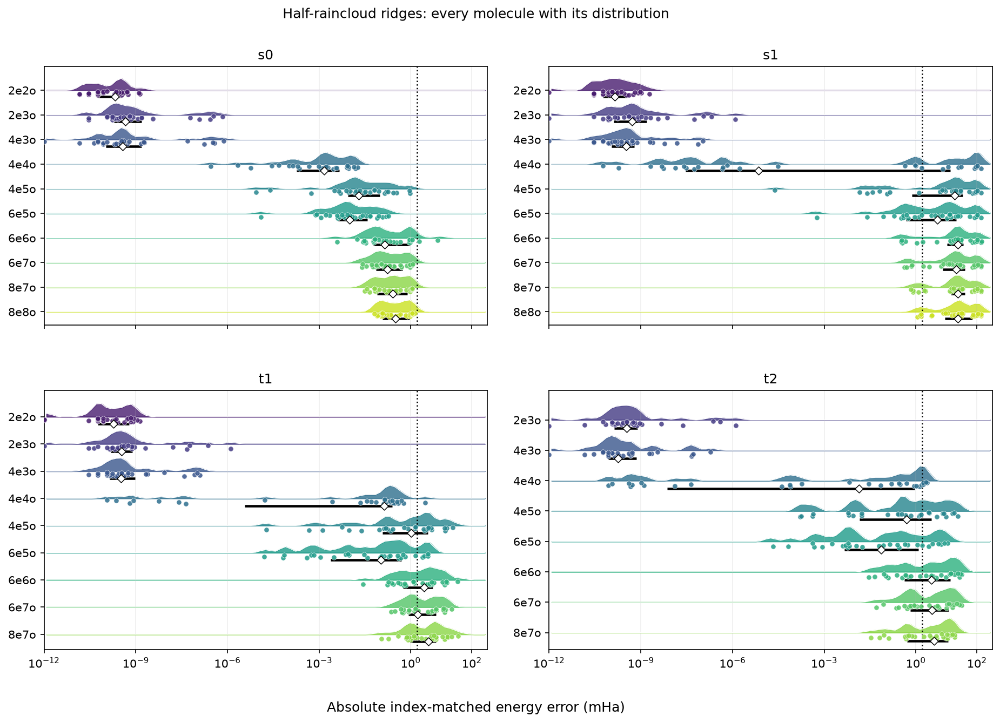
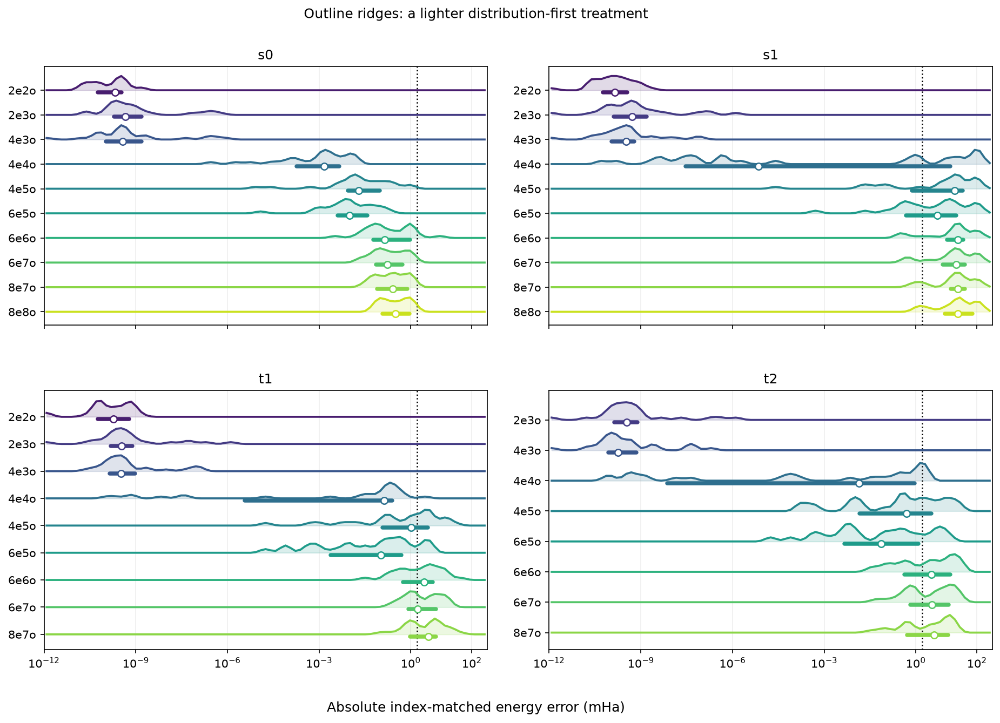
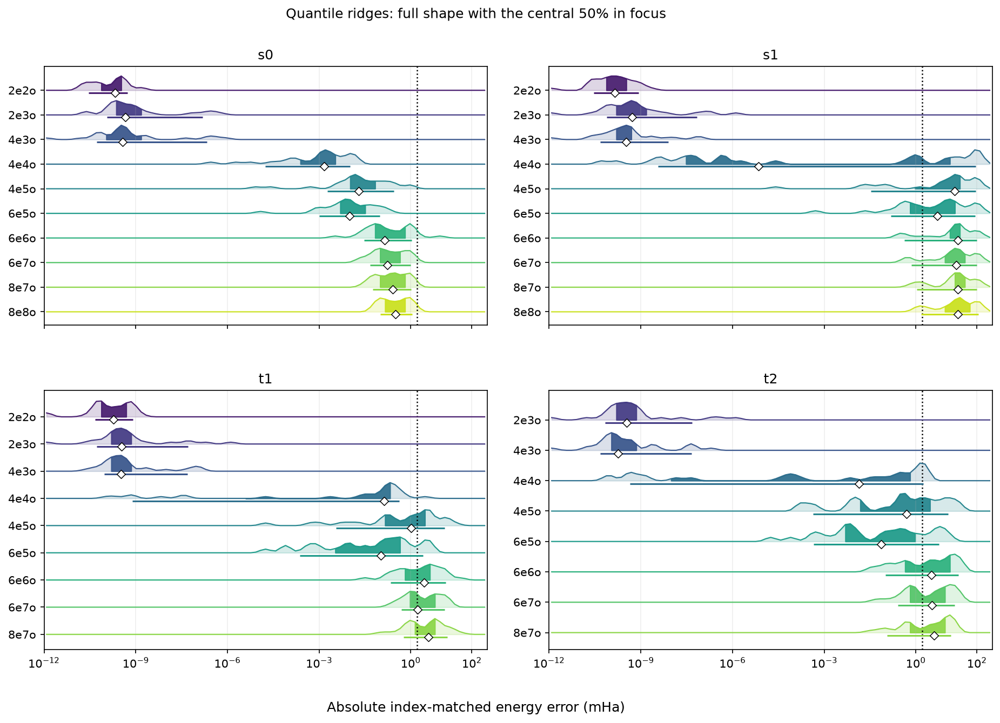
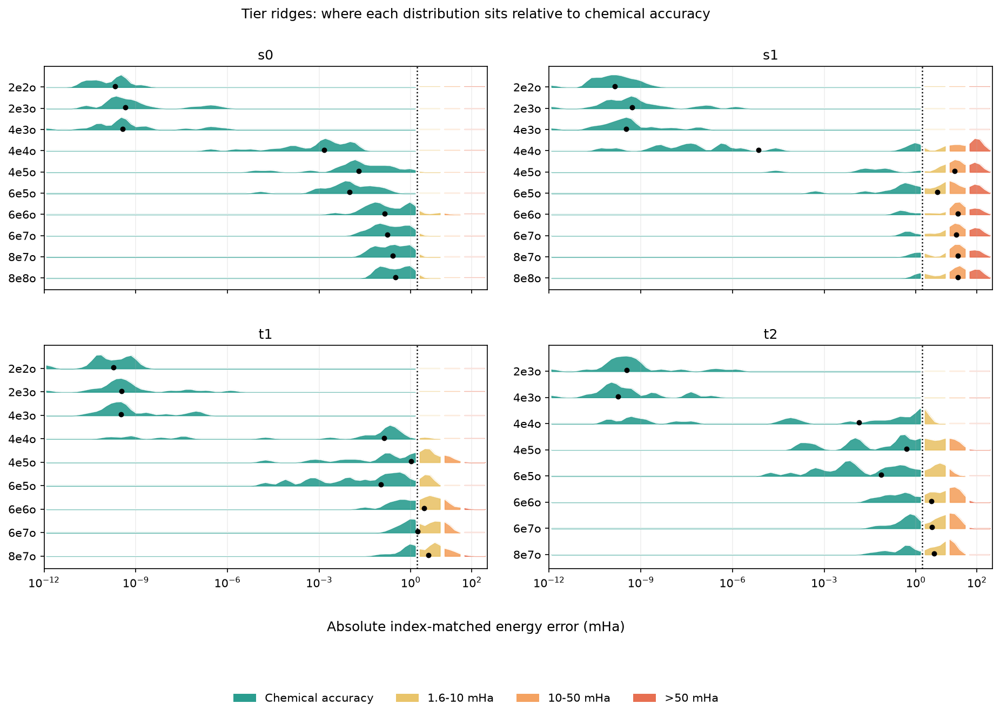

In [121]:
RIDGE_BIN_EDGES = np.linspace(*LOG_ERROR_LIMITS, 90)
RIDGE_BIN_CENTRES = 0.5 * (RIDGE_BIN_EDGES[:-1] + RIDGE_BIN_EDGES[1:])
RIDGE_SMOOTHING_KERNEL = np.array([1, 4, 6, 4, 1]) / 16


def get_ridge_density(values, height=0.58):
    density, _ = np.histogram(values, bins=RIDGE_BIN_EDGES, density=True)
    density = np.convolve(density, RIDGE_SMOOTHING_KERNEL, mode='same')
    return height * density / density.max()


def get_ridge_state_data(metrics, state):
    df_state = metrics.loc[metrics['state'] == state]
    spaces = [
        active_space for active_space in active_spaces
        if not df_state.loc[df_state['active_space'] == active_space].empty
    ]
    values = {
        active_space: get_log_errors(
            df_state.loc[df_state['active_space'] == active_space, 'error_mHa']
        )
        for active_space in spaces
    }
    return spaces, values


def format_ridge_axis(axis, spaces):
    positions = np.arange(len(spaces))[::-1]
    axis.set_yticks(positions, spaces)
    axis.set_ylim(-0.55, len(spaces) - 0.02)
    format_log_error_axis(axis)
    return positions


def plot_half_raincloud_ridges(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        spaces, values_by_space = get_ridge_state_data(metrics, state)
        positions = format_ridge_axis(axis, spaces)
        for position, active_space in zip(positions, spaces):
            values = values_by_space[active_space]
            density = get_ridge_density(values, height=0.48)
            color = ACTIVE_COLORS[active_space]
            axis.fill_between(RIDGE_BIN_CENTRES, position, position + density, color=color, alpha=0.80)
            axis.plot(RIDGE_BIN_CENTRES, position + density, color='white', linewidth=0.7)
            jitter = np.linspace(-0.20, -0.05, len(values))
            axis.scatter(values, position + jitter, color=color, edgecolor='white', linewidth=0.35,
                         s=20, alpha=0.85, zorder=3)
            q25, median, q75 = np.quantile(values, [0.25, 0.50, 0.75])
            axis.hlines(position - 0.27, q25, q75, color='black', linewidth=2.2)
            axis.scatter(median, position - 0.27, marker='D', color='white', edgecolor='black',
                         linewidth=0.7, s=26, zorder=4)
        axis.set_title(state)

    figure.supxlabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Half-raincloud ridges: every molecule with its distribution', y=0.98)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.10, top=0.90, wspace=0.14, hspace=0.25)
    return figure


def plot_outline_ridges(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        spaces, values_by_space = get_ridge_state_data(metrics, state)
        positions = format_ridge_axis(axis, spaces)
        for position, active_space in zip(positions, spaces):
            values = values_by_space[active_space]
            density = get_ridge_density(values)
            color = ACTIVE_COLORS[active_space]
            axis.fill_between(RIDGE_BIN_CENTRES, position, position + density, color=color, alpha=0.16)
            axis.plot(RIDGE_BIN_CENTRES, position + density, color=color, linewidth=1.8)
            q25, median, q75 = np.quantile(values, [0.25, 0.50, 0.75])
            axis.hlines(position - 0.08, q25, q75, color=color, linewidth=3.6, capstyle='round')
            axis.scatter(median, position - 0.08, color='white', edgecolor=color, linewidth=1.2,
                         s=36, zorder=3)
        axis.set_title(state)

    figure.supxlabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Outline ridges: a lighter distribution-first treatment', y=0.98)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.10, top=0.90, wspace=0.14, hspace=0.25)
    return figure


def plot_quantile_ridges(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        spaces, values_by_space = get_ridge_state_data(metrics, state)
        positions = format_ridge_axis(axis, spaces)
        for position, active_space in zip(positions, spaces):
            values = values_by_space[active_space]
            density = get_ridge_density(values)
            q10, q25, median, q75, q90 = np.quantile(values, [0.10, 0.25, 0.50, 0.75, 0.90])
            color = ACTIVE_COLORS[active_space]
            axis.fill_between(RIDGE_BIN_CENTRES, position, position + density, color=color, alpha=0.18)
            central = (RIDGE_BIN_CENTRES >= q25) & (RIDGE_BIN_CENTRES <= q75)
            axis.fill_between(RIDGE_BIN_CENTRES, position, position + density, where=central,
                              color=color, alpha=0.92)
            axis.plot(RIDGE_BIN_CENTRES, position + density, color=color, linewidth=1.0)
            axis.hlines(position - 0.10, q10, q90, color=color, linewidth=1.5)
            axis.scatter(median, position - 0.10, marker='D', color='white', edgecolor='black',
                         linewidth=0.7, s=28, zorder=3)
        axis.set_title(state)

    figure.supxlabel('Absolute index-matched energy error (mHa)')
    figure.suptitle('Quantile ridges: full shape with the central 50% in focus', y=0.98)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.10, top=0.90, wspace=0.14, hspace=0.25)
    return figure


def plot_tier_ridges(metrics):
    figure, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True)
    tier_handles = [Patch(facecolor=color, label=label) for label, _, _, color in TIER_DEFINITIONS]

    for axis, state in zip(axes.ravel(), STATE_ORDER):
        spaces, values_by_space = get_ridge_state_data(metrics, state)
        positions = format_ridge_axis(axis, spaces)
        for position, active_space in zip(positions, spaces):
            values = values_by_space[active_space]
            density = get_ridge_density(values)
            for _, lower, upper, color in TIER_DEFINITIONS:
                lower_log = np.log10(max(lower, 1e-12))
                upper_log = np.log10(upper) if np.isfinite(upper) else LOG_ERROR_LIMITS[1]
                mask = (RIDGE_BIN_CENTRES >= lower_log) & (RIDGE_BIN_CENTRES <= upper_log)
                axis.fill_between(RIDGE_BIN_CENTRES, position, position + density, where=mask,
                                  color=color, alpha=0.90)
            axis.plot(RIDGE_BIN_CENTRES, position + density, color='white', linewidth=0.75)
            axis.scatter(np.median(values), position + 0.04, color='black', s=14, zorder=3)
        axis.set_title(state)

    figure.supxlabel('Absolute index-matched energy error (mHa)', y=0.12)
    figure.suptitle('Tier ridges: where each distribution sits relative to chemical accuracy', y=0.98)
    figure.legend(handles=tier_handles, loc='lower center', bbox_to_anchor=(0.5, 0.01),
                  ncol=4, frameon=False)
    figure.subplots_adjust(left=0.09, right=0.99, bottom=0.21, top=0.90, wspace=0.14, hspace=0.25)
    return figure


half_raincloud_ridge_figure = plot_half_raincloud_ridges(df_low_state_metrics)
outline_ridge_figure = plot_outline_ridges(df_low_state_metrics)
quantile_ridge_figure = plot_quantile_ridges(df_low_state_metrics)
tier_ridge_figure = plot_tier_ridges(df_low_state_metrics)
show_scrollable_figs([
    half_raincloud_ridge_figure, outline_ridge_figure,
    quantile_ridge_figure, tier_ridge_figure,
])


## Orbital Character

,mean_weight_percent,confidence_interval_95
Reference,92.417%,1.300%
Singles,0.038%,0.016%
Doubles,7.376%,1.229%
Triple or higher,0.169%,0.083%


,excitation,mean_weight_percent,confidence_interval_95
0,"(3, 3) -> (4, 4)",2.028%,0.639%
1,"(2, 3) -> (4, 5)",1.340%,0.610%
2,"(2, 2) -> (4, 4)",0.716%,0.515%
3,"(2, 2) -> (5, 5)",0.617%,0.238%
4,"(3, 3) -> (5, 5)",0.523%,0.260%



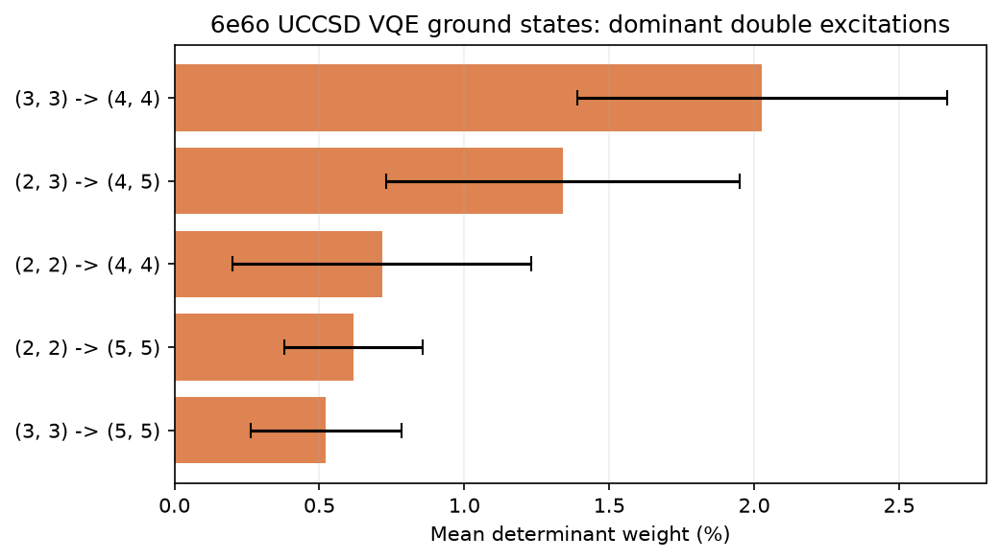

In [122]:
ansatz_name = "UCCSD"
active_space = "6e6o"
num_e, num_o = parse_active_space(active_space)
n_spin_orbitals = 2 * num_o
determinant_indices = np.asarray([
    index
    for index in range(2**n_spin_orbitals)
    if format(index, f"0{n_spin_orbitals}b").count("1") == num_e
])
hf_state = "11" * (num_e // 2) + "00" * (num_o - num_e // 2)

channel_data, composition_data = [], []
for molecule_name in MOLECULE_NAMES:
    molecule = load_qibo_mol(molecule_name, active_space)
    final_circuit = get_vqe_circuit(molecule, molecule_name, active_space, ansatz_name)
    full_vqe_state = np.asarray(final_circuit().state(), dtype=complex)
    vqe_pvec = full_vqe_state[determinant_indices]
    assert np.isclose(np.vdot(vqe_pvec, vqe_pvec).real, 1)

    channels = get_spatial_excitation_channels(vqe_pvec, hf_state)
    percentages = get_excitation_percentages(vqe_pvec, hf_state)
    assert np.isclose(
        channels.query("rank == 2")["weight_percent"].sum(), percentages[2]
    )

    channel_data.append(channels.query("rank == 2").assign(molecule=molecule_name))
    composition_data.append({
        "molecule": molecule_name,
        "Reference": percentages[0],
        "Singles": percentages[1],
        "Doubles": percentages[2],
        "Triple or higher": percentages[3],
    })
    del final_circuit, full_vqe_state, molecule, vqe_pvec
    gc.collect()

df_vqe_excitation_channels = pd.concat(channel_data, ignore_index=True)
df_vqe_channel_weights = (
    df_vqe_excitation_channels
    .pivot(index="molecule", columns="excitation", values="weight_percent")
    .reindex(MOLECULE_NAMES, fill_value=0)
    .fillna(0)
)

df_vqe_excitation_composition = pd.DataFrame(composition_data).set_index("molecule")
df_vqe_excitation_composition = pd.DataFrame({
    "mean_weight_percent": df_vqe_excitation_composition.mean(),
    "confidence_interval_95": 1.96 * df_vqe_excitation_composition.sem(),
})
display(df_vqe_excitation_composition.style.format("{:.3f}%"))

df_vqe_dominant_double_channels = pd.DataFrame({
    "mean_weight_percent": df_vqe_channel_weights.mean(),
    "confidence_interval_95": 1.96 * df_vqe_channel_weights.sem(),
}).nlargest(5, "mean_weight_percent").reset_index(names="excitation")
display(df_vqe_dominant_double_channels.style.format({
    "mean_weight_percent": "{:.3f}%",
    "confidence_interval_95": "{:.3f}%",
}))

figure, axis = plt.subplots(figsize=(7, 4))
top_doubles = df_vqe_dominant_double_channels.sort_values("mean_weight_percent")
axis.barh(
    top_doubles["excitation"], top_doubles["mean_weight_percent"],
    xerr=top_doubles["confidence_interval_95"], capsize=4, color="#DD8452",
)
axis.set_xlabel("Mean determinant weight (%)")
axis.set_title(f"{active_space} {ansatz_name} VQE ground states: dominant double excitations")
axis.grid(axis="x", alpha=0.2)
figure.tight_layout()
show_scrollable_figs([figure])

### Double bonds and active-space errors

The table uses exact-state `s1` errors by default. Pi-bond equivalents count each formal double bond once and each aromatic bond as one-half.

In [123]:
from notebook_utils.chem import Ch, smile_28

TABLE_STATE = 's1'
TABLE_EXPANSION = {'s0': 'singlet', 's1': 'singlet', 't1': 'triplet', 't2': 'triplet'}[TABLE_STATE]
TABLE_ACTIVE_SPACES = sorted(df_uccsd['active_space'].unique(), key=parse_active_space)


def get_pi_bond_equivalents(molecule_name):
    molecule = Ch.MolFromSmiles(smile_28[molecule_name])
    return sum(
        1 if bond.GetBondType() == Ch.BondType.DOUBLE else 0.5 if bond.GetIsAromatic() else 0
        for bond in molecule.GetBonds()
    )


def get_valence_electrons(molecule_name):
    molecule = Ch.MolFromSmiles(smile_28[molecule_name])
    periodic_table = Ch.GetPeriodicTable()
    return sum(
        periodic_table.GetNOuterElecs(atom.GetAtomicNum()) - atom.GetFormalCharge()
        for atom in molecule.GetAtoms()
    )


df_double_bond_errors = df_uccsd.loc[
    df_uccsd['expansion'] == TABLE_EXPANSION,
    ['molecule', 'active_space', f'{TABLE_STATE}_error'],
].pivot(index='molecule', columns='active_space', values=f'{TABLE_STATE}_error')
df_double_bond_errors = df_double_bond_errors.reindex(columns=TABLE_ACTIVE_SPACES)
df_double_bond_errors.insert(
    0, 'pi_bond_equivalents',
    [get_pi_bond_equivalents(molecule) for molecule in df_double_bond_errors.index],
)
df_double_bond_errors.insert(
    1, 'valence_electrons',
    [get_valence_electrons(molecule) for molecule in df_double_bond_errors.index],
)
df_double_bond_errors = df_double_bond_errors.sort_values(
    ['pi_bond_equivalents'], ascending=[False], kind='stable'
)

display(df_double_bond_errors.style.format({
    'pi_bond_equivalents': '{:.1f}',
    'valence_electrons': '{:.0f}',
    **{active_space: '{:.3f}' for active_space in TABLE_ACTIVE_SPACES},
}).set_caption(f'UCCSD {TABLE_STATE} absolute index-matched energy error (mHa)'))


active_space,pi_bond_equivalents,valence_electrons,2e2o,2e3o,4e3o,4e4o,4e5o,6e5o,6e6o,6e7o,8e7o,8e8o
molecule,,,,,,,,,,,,
Naphthalene,5.5,40,0.000,0.000,0.000,0.000,6.096,5.900,13.432,26.777,27.598,74.213
Adenine,5.0,45,0.000,0.000,0.000,7.483,24.798,10.634,14.391,21.274,14.590,30.392
Thymine,5.0,42,0.000,0.000,0.000,0.997,8.694,12.220,22.312,10.895,15.684,8.047
Uracil,5.0,38,0.000,0.000,0.000,0.944,7.403,12.905,23.609,12.561,16.984,9.266
Benzoquinone,4.0,36,0.000,0.000,0.000,0.000,20.254,0.387,23.773,28.653,19.406,23.632
Cytosine,4.0,37,0.000,0.000,0.000,1.550,24.921,14.048,28.739,34.043,26.277,27.323
Octatetraene,4.0,32,0.000,0.000,0.000,11.200,22.744,23.621,59.515,81.689,83.135,135.158
Benzene,3.0,24,0.000,0.000,0.000,0.000,70.885,0.001,70.902,70.912,69.203,70.928
Hexatriene,3.0,24,0.000,0.000,0.000,24.413,56.246,57.788,140.966,134.265,134.385,134.412


### Q1 Root Identity Across Active Spaces

The first two QSE singlet roots are matched one-to-one to the exact CASCI singlets by maximising squared wavefunction overlap. Cell colour identifies the exact root matched to `q1`; cell text gives that squared overlap as a percentage.


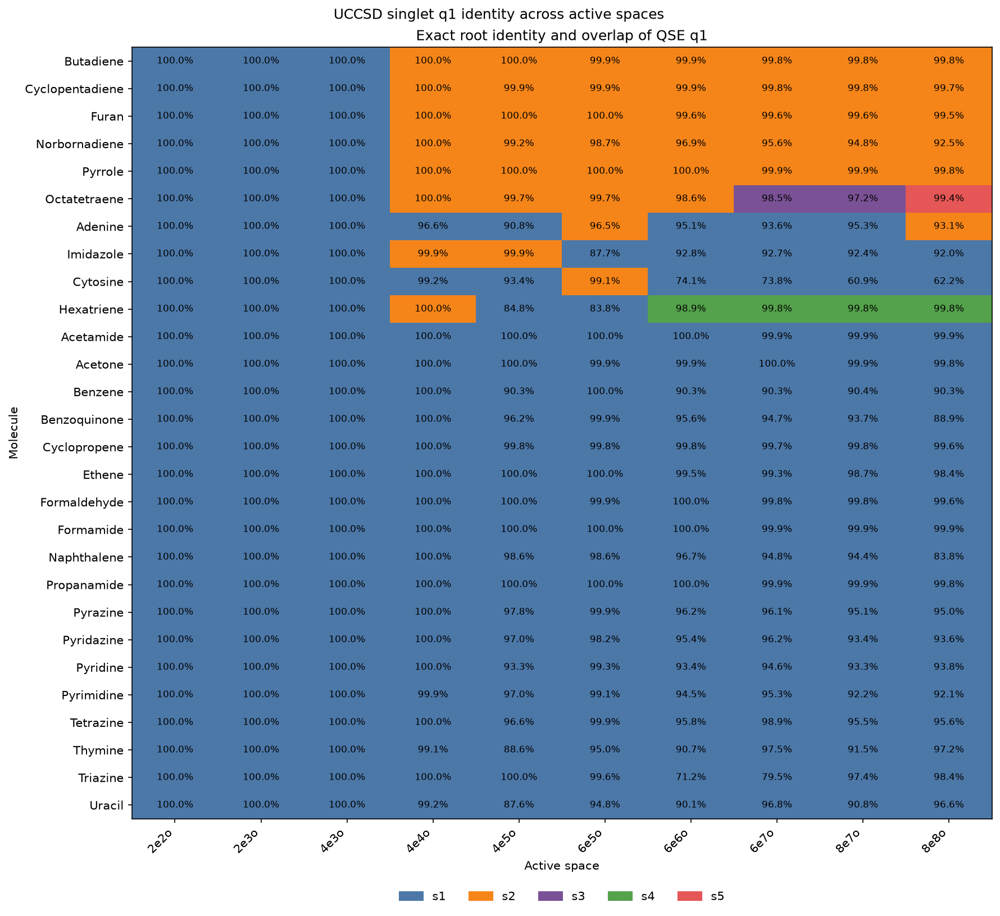

In [20]:
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.patches import Patch
from scipy.optimize import linear_sum_assignment


def get_q1_root_match(row):
    qse_vectors = np.asarray(row['qse_subspace'][:, :2], dtype=complex).copy()
    qse_vectors /= np.linalg.norm(qse_vectors, axis=0, keepdims=True)

    exact_vectors = np.column_stack([
        np.asarray(row['pyscf_casci_pvec'][str(root)], dtype=complex)
        for root in range(min(11, len(row['pyscf_casci_energies'])))
    ])
    exact_vectors /= np.linalg.norm(exact_vectors, axis=0, keepdims=True)

    overlaps = np.abs(exact_vectors.conj().T @ qse_vectors) ** 2
    exact_indices, qse_indices = linear_sum_assignment(overlaps, maximize=True)
    pairing = dict(zip(qse_indices, exact_indices))
    q1_root = pairing[1]

    return f's{q1_root}', float(overlaps[q1_root, 1])


df_q1_root_matching = df_uccsd[df_uccsd['expansion'] == 'singlet'].copy()
df_q1_root_matching[['q1_exact_root', 'q1_overlap']] = (
    df_q1_root_matching.apply(get_q1_root_match, axis=1, result_type='expand')
)

q1_active_spaces = sorted(df_q1_root_matching['active_space'].unique(), key=parse_active_space)
q1_root_map = df_q1_root_matching.pivot(
    index='molecule', columns='active_space', values='q1_exact_root'
).reindex(columns=q1_active_spaces)
q1_overlap_map = df_q1_root_matching.pivot(
    index='molecule', columns='active_space', values='q1_overlap'
).reindex(columns=q1_active_spaces)
molecule_order = q1_root_map.eq('s2').sum(axis=1).sort_values(ascending=False, kind='stable').index
q1_root_map = q1_root_map.reindex(molecule_order)
q1_overlap_map = q1_overlap_map.reindex(molecule_order)

root_labels = sorted(q1_root_map.stack().unique(), key=lambda root: int(root[1:]))
root_colour_map = {
    's0': '#B8B8B8', 's1': '#4C78A8', 's2': '#F58518',
    's3': '#7A5195', 's4': '#54A24B', 's5': '#E45756',
}
root_colours = [root_colour_map[root] for root in root_labels]
root_to_code = {root: index for index, root in enumerate(root_labels)}
root_codes = q1_root_map.apply(lambda column: column.map(root_to_code)).astype(int)

figure, map_axis = plt.subplots(figsize=(12, 11))
map_axis.imshow(
    root_codes.to_numpy(), aspect='auto',
    cmap=ListedColormap(root_colours),
    norm=BoundaryNorm(np.arange(-0.5, len(root_labels) + 0.5), len(root_labels)),
)

for row_index, molecule in enumerate(q1_root_map.index):
    for column_index, active_space in enumerate(q1_root_map.columns):
        overlap = 100 * q1_overlap_map.loc[molecule, active_space]
        map_axis.text(column_index, row_index, f'{overlap:.1f}%',
                      ha='center', va='center', fontsize=8)

map_axis.set_xticks(range(len(q1_active_spaces)), q1_active_spaces, rotation=45, ha='right')
map_axis.set_yticks(range(len(q1_root_map.index)), q1_root_map.index)
map_axis.set_xlabel('Active space')
map_axis.set_ylabel('Molecule')
map_axis.set_title('Exact root identity and overlap of QSE q1')
map_axis.legend(
    handles=[Patch(color=colour, label=label) for colour, label in zip(root_colours, root_labels)],
    loc='upper center', bbox_to_anchor=(0.5, -0.08), ncol=len(root_labels), frameon=False,
)
figure.suptitle('UCCSD singlet q1 identity across active spaces', y=0.98)
figure.tight_layout()
show_scrollable_figs([figure])


In [21]:
# A paired double has the spatial form i^2 -> a^2; every other rank-two term is mixed.
COMPOSITION_ACTIVE_SPACE = '6e6o'
determinant_bases = {}


def get_paired_mixed_composition(pvec, active_space):
    if active_space not in determinant_bases:
        num_electrons, num_orbitals = parse_active_space(active_space)
        hf_state = '11' * (num_electrons // 2) + '00' * (num_orbitals - num_electrons // 2)
        determinants = [
            format(index, f'0{2 * num_orbitals}b')
            for index in range(2 ** (2 * num_orbitals))
            if format(index, f'0{2 * num_orbitals}b').count('1') == num_electrons
        ]
        determinant_bases[active_space] = hf_state, determinants

    hf_state, determinants = determinant_bases[active_space]
    weights = np.abs(np.asarray(pvec, dtype=complex)) ** 2
    weights /= weights.sum()
    composition = dict.fromkeys(['reference', 'singles', 'paired_doubles', 'mixed_doubles', 'higher'], 0.0)

    for determinant, weight in zip(determinants, weights):
        holes = [index for index, (hf_bit, bit) in enumerate(zip(hf_state, determinant))
                 if hf_bit == '1' and bit == '0']
        particles = [index for index, (hf_bit, bit) in enumerate(zip(hf_state, determinant))
                     if hf_bit == '0' and bit == '1']

        if len(holes) == 0:
            category = 'reference'
        elif len(holes) == 1:
            category = 'singles'
        elif len(holes) == 2:
            spatial_holes = [index // 2 for index in holes]
            spatial_particles = [index // 2 for index in particles]
            category = 'paired_doubles' if (
                len(set(spatial_holes)) == 1 and len(set(spatial_particles)) == 1
            ) else 'mixed_doubles'
        else:
            category = 'higher'

        composition[category] += weight

    return {category: 100 * weight for category, weight in composition.items()}


df_composition = df_uccsd[
    (df_uccsd['active_space'] == COMPOSITION_ACTIVE_SPACE)
    & (df_uccsd['expansion'] == 'singlet')
].set_index('molecule')
q1_matches = df_q1_root_matching.loc[
    df_q1_root_matching['active_space'] == COMPOSITION_ACTIVE_SPACE,
    ['molecule', 'q1_exact_root'],
].set_index('molecule')['q1_exact_root']

composition_rows = []
for molecule in q1_root_map.index:
    row = df_composition.loc[molecule]
    matched_root = q1_matches[molecule]
    s1_composition = get_paired_mixed_composition(row['pyscf_casci_pvec']['1'], COMPOSITION_ACTIVE_SPACE)
    matched_composition = get_paired_mixed_composition(
        row['pyscf_casci_pvec'][matched_root.removeprefix('s')], COMPOSITION_ACTIVE_SPACE
    )
    composition_rows.append({
        'molecule': molecule, 'q1_match': f'q1 -> {matched_root}',
        **{f's1_{category}': weight for category, weight in s1_composition.items()},
        **{f'matched_{category}': weight for category, weight in matched_composition.items()},
    })

COMPOSITION_COLUMN_NAMES = {
    'q1_match': 'Q1 matched root',
    's1_singles': 'S1 singles (%)',
    's1_paired_doubles': 'S1 paired doubles (%)',
    's1_mixed_doubles': 'S1 mixed doubles (%)',
    's1_reference': 'S1 reference (%)',
    's1_higher': 'S1 higher (%)',
    'matched_singles': 'Matched singles (%)',
    'matched_paired_doubles': 'Matched paired doubles (%)',
    'matched_mixed_doubles': 'Matched mixed doubles (%)',
    'matched_reference': 'Matched reference (%)',
    'matched_higher': 'Matched higher (%)',
}
df_q1_excitation_composition = pd.DataFrame(composition_rows).rename(
    columns=COMPOSITION_COLUMN_NAMES
)

display(df_q1_excitation_composition.style.format({
    column: '{:.2f}'
    for column in df_q1_excitation_composition.columns
    if column not in {'molecule', 'Q1 matched root'}
}).set_caption(
    'Exact-CASCI excitation weights at 6e6o, ordered as in the Q1 identity heatmap'
))


,molecule,Q1 matched root,S1 reference (%),S1 singles (%),S1 paired doubles (%),S1 mixed doubles (%),S1 higher (%),Matched reference (%),Matched singles (%),Matched paired doubles (%),Matched mixed doubles (%),Matched higher (%)
0,Butadiene,q1 -> s2,0.53,33.53,54.48,10.86,0.59,0.00,95.31,0.00,3.27,1.42
1,Cyclopentadiene,q1 -> s2,0.17,41.22,48.74,9.05,0.82,0.00,98.16,0.00,1.13,0.72
2,Furan,q1 -> s2,0.03,70.70,19.20,8.70,1.38,0.00,93.93,0.00,5.34,0.73
3,Norbornadiene,q1 -> s2,0.01,0.00,76.15,23.75,0.08,0.00,96.81,0.00,2.37,0.82
4,Pyrrole,q1 -> s2,0.02,74.43,14.75,9.48,1.32,0.00,92.17,0.00,7.11,0.72
5,Octatetraene,q1 -> s2,3.66,25.32,43.02,22.48,5.52,0.00,90.25,0.00,5.52,4.23
6,Adenine,q1 -> s1,0.00,93.51,0.00,4.06,2.43,0.00,93.51,0.00,4.06,2.43
7,Imidazole,q1 -> s1,0.00,81.37,0.00,14.95,3.68,0.00,81.37,0.00,14.95,3.68
8,Cytosine,q1 -> s1,0.00,83.86,0.00,13.59,2.56,0.00,83.86,0.00,13.59,2.56
9,Hexatriene,q1 -> s4,0.83,26.69,39.45,25.61,7.41,0.00,91.06,0.00,4.51,4.44


In [126]:
FOCUS_MOLECULES = ['Adenine', 'Imidazole', 'Cytosine', 'Hexatriene']
FOCUS_ACTIVE_SPACES = q1_active_spaces[q1_active_spaces.index('4e4o'):]

df_focus_composition = df_uccsd[
    (df_uccsd['molecule'].isin(FOCUS_MOLECULES))
    & (df_uccsd['active_space'].isin(FOCUS_ACTIVE_SPACES))
    & (df_uccsd['expansion'] == 'singlet')
].set_index(['molecule', 'active_space'])
q1_focus_matches = df_q1_root_matching.set_index(['molecule', 'active_space'])['q1_exact_root']

focus_rows = []
for molecule in FOCUS_MOLECULES:
    for active_space in FOCUS_ACTIVE_SPACES:
        row = df_focus_composition.loc[(molecule, active_space)]
        matched_root = q1_focus_matches[molecule, active_space]
        s1_composition = get_paired_mixed_composition(row['pyscf_casci_pvec']['1'], active_space)
        matched_composition = get_paired_mixed_composition(
            row['pyscf_casci_pvec'][matched_root.removeprefix('s')], active_space
        )
        focus_rows.append({
            'molecule': molecule, 'active_space': active_space, 'q1_match': f'q1 -> {matched_root}',
            **{f's1_{category}': weight for category, weight in s1_composition.items()},
            **{f'matched_{category}': weight for category, weight in matched_composition.items()},
        })

df_focus_q1_excitation_composition = pd.DataFrame(focus_rows).rename(
    columns=COMPOSITION_COLUMN_NAMES
)
display(df_focus_q1_excitation_composition.style.format({
    column: '{:.2f}'
    for column in df_focus_q1_excitation_composition.columns
    if column not in {'molecule', 'active_space', 'Q1 matched root'}
}).set_caption(
    'Exact-CASCI excitation weights for selected q1 identity changes from 4e4o onward'
))


,molecule,active_space,Q1 matched root,S1 reference (%),S1 singles (%),S1 paired doubles (%),S1 mixed doubles (%),S1 higher (%),Matched reference (%),Matched singles (%),Matched paired doubles (%),Matched mixed doubles (%),Matched higher (%)
0,Adenine,4e4o,q1 -> s1,0.00,94.60,2.91,2.26,0.23,0.00,94.60,2.91,2.26,0.23
1,Adenine,4e5o,q1 -> s1,0.00,90.94,2.80,5.52,0.73,0.00,90.94,2.80,5.52,0.73
2,Adenine,6e5o,q1 -> s2,0.00,94.48,0.00,3.75,1.77,0.00,94.57,2.93,2.26,0.24
3,Adenine,6e6o,q1 -> s1,0.00,93.51,0.00,4.06,2.43,0.00,93.51,0.00,4.06,2.43
4,Adenine,6e7o,q1 -> s1,0.00,90.89,0.00,5.92,3.19,0.00,90.89,0.00,5.92,3.19
5,Adenine,8e7o,q1 -> s1,0.00,91.26,0.00,4.76,3.98,0.00,91.26,0.00,4.76,3.98
6,Adenine,8e8o,q1 -> s2,0.01,83.73,3.29,9.79,3.19,0.00,87.61,0.00,7.03,5.35
7,Imidazole,4e4o,q1 -> s2,0.02,75.58,11.16,12.07,1.16,0.00,90.76,1.47,7.01,0.76
8,Imidazole,4e5o,q1 -> s2,0.02,75.59,11.17,12.05,1.17,0.00,90.78,1.46,6.98,0.77
9,Imidazole,6e5o,q1 -> s1,0.00,81.38,0.00,14.94,3.67,0.00,81.38,0.00,14.94,3.67


In [22]:
PERSISTENT_REORDERING_MOLECULES = [
    'Butadiene', 'Cyclopentadiene', 'Furan', 'Norbornadiene', 'Pyrrole',
]
PERSISTENT_REORDERING_SPACES = q1_active_spaces[q1_active_spaces.index('4e4o'):]
assert q1_root_map.loc[PERSISTENT_REORDERING_MOLECULES, PERSISTENT_REORDERING_SPACES].eq('s2').all().all()

def get_s1_s2_composition_table(molecules, active_spaces):
    df_composition = df_uccsd[
        (df_uccsd['molecule'].isin(molecules))
        & (df_uccsd['active_space'].isin(active_spaces))
        & (df_uccsd['expansion'] == 'singlet')
    ].set_index(['molecule', 'active_space'])
    rows = []

    for molecule in molecules:
        for active_space in active_spaces:
            row = df_composition.loc[(molecule, active_space)]
            s1 = get_paired_mixed_composition(row['pyscf_casci_pvec']['1'], active_space)
            s2 = get_paired_mixed_composition(row['pyscf_casci_pvec']['2'], active_space)
            rows.append({
                'molecule': molecule, 'active_space': active_space,
                'S1 singles (%)': s1['singles'],
                'S1 paired doubles (%)': s1['paired_doubles'],
                'S1 mixed doubles (%)': s1['mixed_doubles'],
                'S1 reference/higher (%)': s1['reference'] + s1['higher'],
                'S2 singles (%)': s2['singles'],
                'S2 paired doubles (%)': s2['paired_doubles'],
                'S2 mixed doubles (%)': s2['mixed_doubles'],
                'S2 reference/higher (%)': s2['reference'] + s2['higher'],
            })

    return pd.DataFrame(rows)


df_persistent_s1_s2_composition = get_s1_s2_composition_table(
    PERSISTENT_REORDERING_MOLECULES, PERSISTENT_REORDERING_SPACES
)
display(df_persistent_s1_s2_composition.style.format({
    column: '{:.2f}'
    for column in df_persistent_s1_s2_composition.columns
    if column not in {'molecule', 'active_space'}
}).set_caption(
    'Exact-CASCI S1 and S2 excitation weights for molecules with persistent q1 -> s2 reordering'
))


,molecule,active_space,S1 singles (%),S1 paired doubles (%),S1 mixed doubles (%),S1 reference/higher (%),S2 singles (%),S2 paired doubles (%),S2 mixed doubles (%),S2 reference/higher (%)
0,Butadiene,4e4o,33.33,54.75,10.91,1.02,95.57,0.00,3.05,1.37
1,Butadiene,4e5o,33.33,54.74,10.91,1.02,95.57,0.00,3.05,1.38
2,Butadiene,6e5o,33.34,54.74,10.91,1.02,95.57,0.00,3.05,1.38
3,Butadiene,6e6o,33.53,54.48,10.86,1.12,95.31,0.00,3.27,1.42
4,Butadiene,6e7o,33.54,54.46,10.86,1.14,95.25,0.00,3.29,1.45
5,Butadiene,8e7o,33.57,54.42,10.85,1.15,95.24,0.00,3.32,1.44
6,Butadiene,8e8o,33.58,54.37,10.85,1.19,95.15,0.00,3.35,1.50
7,Cyclopentadiene,4e4o,41.17,48.80,9.06,0.98,98.21,0.00,1.12,0.68
8,Cyclopentadiene,4e5o,41.17,48.80,9.06,0.98,98.20,0.00,1.12,0.68
9,Cyclopentadiene,6e5o,41.16,48.80,9.06,0.98,98.20,0.00,1.12,0.68


In [128]:
OTHER_MOLECULES = [
    molecule for molecule in q1_root_map.index
    if molecule not in PERSISTENT_REORDERING_MOLECULES
]
df_other_s1_s2_composition = get_s1_s2_composition_table(
    OTHER_MOLECULES, PERSISTENT_REORDERING_SPACES
)

display(df_other_s1_s2_composition.style.format({
    column: '{:.2f}'
    for column in df_other_s1_s2_composition.columns
    if column not in {'molecule', 'active_space'}
}).set_caption(
    'Exact-CASCI S1 and S2 excitation weights for the remaining molecules from 4e4o onward'
))


,molecule,active_space,S1 singles (%),S1 paired doubles (%),S1 mixed doubles (%),S1 reference/higher (%),S2 singles (%),S2 paired doubles (%),S2 mixed doubles (%),S2 reference/higher (%)
0,Octatetraene,4e4o,39.27,47.67,9.09,3.96,96.12,0.00,2.87,1.02
1,Octatetraene,4e5o,36.50,46.64,12.65,4.21,94.64,0.00,3.82,1.54
2,Octatetraene,6e5o,36.20,46.18,13.27,4.35,94.22,0.00,4.17,1.61
3,Octatetraene,6e6o,25.32,43.02,22.48,9.18,90.25,0.00,5.52,4.23
4,Octatetraene,6e7o,27.04,40.68,22.76,9.53,34.36,0.00,59.33,6.32
5,Octatetraene,8e7o,27.11,40.47,22.69,9.72,34.61,0.00,58.70,6.69
6,Octatetraene,8e8o,22.48,35.78,26.42,15.32,24.99,0.00,61.62,13.39
7,Adenine,4e4o,94.60,2.91,2.26,0.23,97.47,0.50,1.15,0.87
8,Adenine,4e5o,90.94,2.80,5.52,0.74,94.69,0.62,3.72,0.97
9,Adenine,6e5o,94.48,0.00,3.75,1.77,94.57,2.93,2.26,0.24


## Chemical interpretation of root reordering

### Scope

This diagnostic compares the exact-CASCI character of `s1` with the identity of the second UCCSD singlet QSE root, `q1`, from `4e4o` onward. A `q1 -> s2` assignment means that the QSE root lying second in energy has substantially more exact-`s2` than exact-`s1` character. It is therefore an extreme, directly visible form of state-specific misrepresentability rather than a separate numerical failure.

### Chemical account

1. **The ordinary case is a single-excitation `s1`.** When exact `s1` is dominated by one-electron particle-hole configurations, the singles QSE pool can represent its leading response efficiently. In these cases `q1` normally retains `s1` identity.
2. **Double-rich `s1` states are selectively difficult.** A paired double has the spatial form `i^2 -> a^2`; mixed doubles move electrons between two distinct occupied and/or virtual orbitals. Neither is an explicit response operator in the ordinary singles QSE pool. The important failure is differential: a double-rich `s1` loses more variational support than a nearby, mostly single-excitation `s2`. The latter can then enter below it and become `q1`.
3. **Two formal C=C bonds are a useful chemical flag, not a rule.** Butadiene, Cyclopentadiene, and Norbornadiene have persistent `q1 -> s2` assignments, consistent with low-lying valence states containing substantial pair-transfer character. In contrast, Thymine and Uracil also contain two formal double bonds but retain `q1 -> s1`: their low singlets are largely one-electron carbonyl or heteroatom excitations, with negligible paired-double weight. The electronically relevant variable is the correlated state character, not the bond count alone.
4. **The `4e4o` spread follows naturally from this competition.** The compact frontier space still describes some single-dominated roots almost exactly, while double-rich roots are already outside the singles response manifold. This produces a mixture of near-exact and severely displaced roots. Adding more orbitals from `4e5o` onward enlarges the exact CI response space faster than the fixed singles pool; the accidental near-exact cases become less common and the errors are more uniformly nonzero.
5. **Paired doubles are a strong marker but not a complete mechanism.** Hexatriene retains `q1 -> s1` at `4e5o` and `6e5o` despite substantial paired-double weight, while Adenine and Cytosine show isolated shifts with little paired-double weight. The remaining ingredients are mixed and higher excitations, the `s1`-`s2` gap, and how strongly each state projects into the QSE subspace. This is why the correct statement is *state-dependent representability*, with paired doubles as its clearest chemical signature.
6. **The selected-double calculation is a causal check.** When a small set of double-response operators is included, several formerly severe `s1` failures move close to chemical accuracy. That selective rescue supports the missing-double-response interpretation rather than attributing the effect to overlap conditioning or optimizer noise.


,active_space,shifted_roots,shifted_percent,matched_s1_paired_doubles,shifted_s1_paired_doubles
0,4e4o,8,28.6%,0.00,48.23
1,4e5o,7,25.0%,0.00,46.64
2,6e5o,8,28.6%,0.00,32.83
3,6e6o,7,25.0%,0.00,43.02
4,6e7o,7,25.0%,0.00,40.68
5,8e7o,7,25.0%,0.00,40.47
6,8e8o,8,28.6%,0.00,37.59


Molecule-level Spearman correlation: rho = 0.818, p = 1.08e-07 (q1 shift rate versus median exact-S1 paired-double weight)



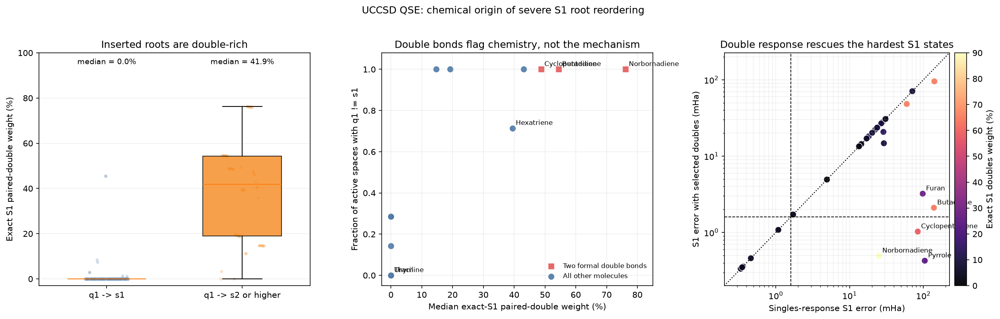

In [23]:
from matplotlib.lines import Line2D
from scipy.stats import spearmanr
from notebook_utils.chem import Ch, smile_28


def get_formal_double_bond_count(molecule_name):
    molecule = Ch.MolFromSmiles(smile_28[molecule_name])
    return sum(bond.GetBondType() == Ch.BondType.DOUBLE for bond in molecule.GetBonds())


df_chemical_story = df_q1_root_matching.loc[
    df_q1_root_matching['active_space'].isin(PERSISTENT_REORDERING_SPACES)
].copy()
df_chemical_story['q1_shifted'] = df_chemical_story['q1_exact_root'].ne('s1')

composition = df_chemical_story.apply(
    lambda row: get_paired_mixed_composition(
        row['pyscf_casci_pvec']['1'], row['active_space']
    ),
    axis=1,
    result_type='expand',
).rename(columns={'paired_doubles': 'paired', 'mixed_doubles': 'mixed'})
df_chemical_story = pd.concat([df_chemical_story, composition], axis=1)
df_chemical_story['formal_double_bonds'] = df_chemical_story['molecule'].map(
    get_formal_double_bond_count
)

active_space_story = []
for active_space, group in df_chemical_story.groupby('active_space', sort=False):
    active_space_story.append({
        'active_space': active_space,
        'shifted_roots': group['q1_shifted'].sum(),
        'shifted_percent': 100 * group['q1_shifted'].mean(),
        'matched_s1_paired_doubles': group.loc[~group['q1_shifted'], 'paired'].median(),
        'shifted_s1_paired_doubles': group.loc[group['q1_shifted'], 'paired'].median(),
    })
df_chemical_story_by_space = pd.DataFrame(active_space_story)
display(df_chemical_story_by_space.style.format({
    'shifted_percent': '{:.1f}%',
    'matched_s1_paired_doubles': '{:.2f}',
    'shifted_s1_paired_doubles': '{:.2f}',
}).set_caption('Q1 root shifts and exact-S1 paired-double weight by active space'))

molecule_story = df_chemical_story.groupby('molecule', sort=False).agg(
    q1_shift_rate=('q1_shifted', 'mean'),
    median_paired_doubles=('paired', 'median'),
    formal_double_bonds=('formal_double_bonds', 'first'),
).reset_index()
rho, p_value = spearmanr(
    molecule_story['q1_shift_rate'], molecule_story['median_paired_doubles']
)
print(
    f'Molecule-level Spearman correlation: rho = {rho:.3f}, p = {p_value:.2e} '
    '(q1 shift rate versus median exact-S1 paired-double weight)'
)

figure, axes = plt.subplots(1, 3, figsize=(17, 5.2))

paired_groups = [
    df_chemical_story.loc[~df_chemical_story['q1_shifted'], 'paired'],
    df_chemical_story.loc[df_chemical_story['q1_shifted'], 'paired'],
]
boxplot = axes[0].boxplot(
    paired_groups, tick_labels=['q1 -> s1', 'q1 -> s2 or higher'],
    patch_artist=True, widths=0.58, showfliers=False,
)
for patch, color in zip(boxplot['boxes'], ('#4C78A8', '#F58518')):
    patch.set_facecolor(color)
    patch.set_alpha(0.78)
for position, values, color in zip((1, 2), paired_groups, ('#4C78A8', '#F58518')):
    jitter = np.linspace(-0.16, 0.16, len(values))
    axes[0].scatter(position + jitter, values, color=color, alpha=0.24, s=14, linewidths=0)
    axes[0].text(position, 95, f'median = {np.median(values):.1f}%', ha='center', fontsize=9)
axes[0].set_ylim(-3, 100)
axes[0].set_ylabel('Exact S1 paired-double weight (%)')
axes[0].set_title('Inserted roots are double-rich')
axes[0].grid(axis='y', alpha=0.2)

for double_count, marker, color, label in (
    (2, 's', '#E45756', 'Two formal double bonds'),
    (None, 'o', '#4C78A8', 'All other molecules'),
):
    group = molecule_story.loc[
        molecule_story['formal_double_bonds'].eq(double_count)
        if double_count is not None else molecule_story['formal_double_bonds'].ne(2)
    ]
    axes[1].scatter(
        group['median_paired_doubles'], group['q1_shift_rate'], marker=marker,
        color=color, edgecolor='white', linewidth=0.7, s=64, alpha=0.9, label=label,
    )
for molecule in ('Butadiene', 'Cyclopentadiene', 'Norbornadiene', 'Thymine', 'Uracil', 'Hexatriene'):
    row = molecule_story.loc[molecule_story['molecule'].eq(molecule)].iloc[0]
    axes[1].annotate(
        molecule, (row['median_paired_doubles'], row['q1_shift_rate']),
        xytext=(4, 4), textcoords='offset points', fontsize=8,
    )
axes[1].set_xlim(-3, 85)
axes[1].set_ylim(-0.05, 1.08)
axes[1].set_xlabel('Median exact-S1 paired-double weight (%)')
axes[1].set_ylabel('Fraction of active spaces with q1 != s1')
axes[1].set_title('Double bonds flag chemistry, not the mechanism')
axes[1].legend(frameon=False, fontsize=8, loc='lower right')
axes[1].grid(alpha=0.2)

rescue = df_selected_doubles.copy()
scatter = axes[2].scatter(
    rescue['s1_standard_error'], rescue['s1_selected_error'],
    c=rescue['doubles'], cmap='magma', vmin=0, vmax=90,
    s=62, edgecolor='white', linewidth=0.7, alpha=0.95,
)
limits = np.array([
    rescue[['s1_standard_error', 's1_selected_error']].min().min() * 0.6,
    rescue[['s1_standard_error', 's1_selected_error']].max().max() * 1.6,
])
axes[2].plot(limits, limits, color='black', linestyle=':', linewidth=1.2)
axes[2].axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle='--', linewidth=0.9)
axes[2].axvline(CHEMICAL_ACCURACY_MHA, color='black', linestyle='--', linewidth=0.9)
for molecule in PERSISTENT_REORDERING_MOLECULES:
    row = rescue.loc[rescue['molecule'].eq(molecule)]
    if not row.empty:
        axes[2].annotate(
            molecule, (row['s1_standard_error'].iloc[0], row['s1_selected_error'].iloc[0]),
            xytext=(4, 4), textcoords='offset points', fontsize=8,
        )
axes[2].set_xscale('log')
axes[2].set_yscale('log')
axes[2].set_xlim(limits)
axes[2].set_ylim(limits)
axes[2].set_xlabel('Singles-response S1 error (mHa)')
axes[2].set_ylabel('S1 error with selected doubles (mHa)')
axes[2].set_title('Double response rescues the hardest S1 states')
axes[2].grid(which='both', alpha=0.18)
colorbar = figure.colorbar(scatter, ax=axes[2], pad=0.02)
colorbar.set_label('Exact S1 doubles weight (%)')

figure.suptitle('UCCSD QSE: chemical origin of severe S1 root reordering', y=1.02)
figure.tight_layout()
show_scrollable_figs([figure])


### Casebook: one continuum of state-specific representability

The central theme is not that QSE randomly loses roots, nor that every molecule with two double bonds fails. The ordinary singles pool gives each exact state a different representation error. When the missing response is small, `q1` remains `s1`; when the missing response is sufficiently larger for `s1` than for the nearby `s2`, the more single-like `s2` enters below it. Root insertion is therefore the sharpest visible endpoint of a continuous representability problem.

**Persistent pair-transfer failures.** At `6e6o`, Butadiene, Cyclopentadiene, and Norbornadiene have exact-S1 paired-double weights of about 54%, 49%, and 76%. Their `q1` roots are overwhelmingly exact-`s2`-like. For Butadiene and Cyclopentadiene, the indexed S1 error is almost the exact `s1`-`s2` separation itself: QSE has effectively placed the physical `s2` in the `q1` slot. Furan and Pyrrole show the same persistent `q1 -> s2` pattern with less paired-double weight, showing that mixed response and the relative energy ordering also contribute.

**Why bond count is only a flag.** Thymine and Uracil also contain two formal double bonds, but their S1 states are about 87% single excitation with zero paired-double contribution at `6e6o`. Both retain `q1 -> s1`. Their residual errors show that a correct root identity is not the same as quantitative accuracy, but the absence of a large state-specific double response prevents the dramatic insertion observed in the conjugated examples.

**Near-boundary and non-paired cases.** Hexatriene at `4e5o` and `6e5o` has roughly 45% paired-double S1 weight but retains `q1 -> s1`. Its 56-58 mHa errors and only 0.84 overlap with exact S1 show a root that is still labelled correctly but already poorly represented. Conversely, Adenine and Cytosine have isolated `q1 -> s2` assignments with negligible paired-double weight. Their small exact `s1`-`s2` gaps make a modest differential representation error enough to change the order.

**Larger active spaces reveal the broader limitation.** Benzene and Naphthalene retain `q1 -> s1` yet have large S1 errors at `6e6o` and `8e8o`; they are not root-insertion examples. Instead, their QSE vectors have incomplete exact-S1 support. This is the broader phenomenon: missing double, mixed, and higher response components rotate or shift energies even when the root label remains correct. The selected-double rescue is important because it changes the operator pool and selectively repairs the double-rich failures.


In [ ]:
df_casebook = df_chemical_story.copy()
df_casebook['s1_s2_gap_mHa'] = df_casebook['pyscf_casci_energies'].map(
    lambda energies: 1000 * (energies[2] - energies[1])
)
df_casebook['s1_double_weight'] = df_casebook['paired'] + df_casebook['mixed']
df_casebook['error_to_gap_ratio'] = (
    df_casebook['s1_error'] / df_casebook['s1_s2_gap_mHa']
)

CASEBOOK_KEYS = [
    ('Butadiene', '6e6o'), ('Cyclopentadiene', '6e6o'),
    ('Norbornadiene', '6e6o'), ('Furan', '6e6o'), ('Pyrrole', '6e6o'),
    ('Thymine', '6e6o'), ('Uracil', '6e6o'),
    ('Hexatriene', '4e5o'), ('Adenine', '6e5o'), ('Cytosine', '6e5o'),
    ('Benzene', '6e6o'), ('Naphthalene', '8e8o'),
]
CASEBOOK_COLUMNS = [
    'q1_exact_root', 'q1_overlap', 's1_error', 's1_s2_gap_mHa',
    'error_to_gap_ratio', 's1_projection', 'singles', 'paired', 'mixed',
]
df_chemical_casebook = (
    df_casebook.set_index(['molecule', 'active_space'])
    .loc[CASEBOOK_KEYS, CASEBOOK_COLUMNS]
    .rename(columns={
        'q1_exact_root': 'Q1 identity',
        'q1_overlap': 'Q1 overlap',
        's1_error': 'Indexed S1 error (mHa)',
        's1_s2_gap_mHa': 'Exact S1-S2 gap (mHa)',
        'error_to_gap_ratio': 'Error / gap',
        's1_projection': 'S1 projection',
        'singles': 'S1 singles (%)',
        'paired': 'S1 paired doubles (%)',
        'mixed': 'S1 mixed doubles (%)',
    })
)
display(df_chemical_casebook.style.format({
    'Q1 overlap': '{:.4f}',
    'Indexed S1 error (mHa)': '{:.3f}',
    'Exact S1-S2 gap (mHa)': '{:.3f}',
    'Error / gap': '{:.3f}',
    'S1 projection': '{:.3f}',
    'S1 singles (%)': '{:.2f}',
    'S1 paired doubles (%)': '{:.2f}',
    'S1 mixed doubles (%)': '{:.2f}',
}).set_caption('Representative UCCSD singlet cases: exact-state character, Q1 identity, and error'))

figure, axes = plt.subplots(1, 2, figsize=(12.5, 5.0))
root_styles = {
    's1': ('#4C78A8', 'q1 -> s1'),
    's2': ('#F58518', 'q1 -> s2'),
}
df_casebook['root_style'] = np.where(
    df_casebook['q1_exact_root'].eq('s1'), 's1',
    np.where(df_casebook['q1_exact_root'].eq('s2'), 's2', 'higher'),
)
root_styles['higher'] = ('#7A5195', 'q1 -> s3 or higher')

for root_style, (color, label) in root_styles.items():
    group = df_casebook.loc[df_casebook['root_style'].eq(root_style)]
    axes[0].scatter(
        group['s1_s2_gap_mHa'], group['s1_error'], color=color, label=label,
        alpha=0.72, edgecolor='white', linewidth=0.5, s=42,
    )
limit = max(df_casebook['s1_s2_gap_mHa'].max(), df_casebook['s1_error'].max()) * 1.05
axes[0].plot([0, limit], [0, limit], color='black', linestyle=':', linewidth=1.1)
for molecule in PERSISTENT_REORDERING_MOLECULES:
    row = df_casebook.loc[
        df_casebook['molecule'].eq(molecule) & df_casebook['active_space'].eq('6e6o')
    ]
    if not row.empty:
        axes[0].annotate(
            molecule, (row['s1_s2_gap_mHa'].iloc[0], row['s1_error'].iloc[0]),
            xytext=(4, 4), textcoords='offset points', fontsize=8,
        )
axes[0].set_xlim(0, limit)
axes[0].set_ylim(0, limit)
axes[0].set_xlabel('Exact S1-S2 separation (mHa)')
axes[0].set_ylabel('Indexed QSE S1 error (mHa)')
axes[0].set_title('Inserted q1 roots inherit the S1-S2 gap')
axes[0].legend(frameon=False, fontsize=8)
axes[0].grid(alpha=0.2)

for root_style, (color, label) in root_styles.items():
    group = df_casebook.loc[df_casebook['root_style'].eq(root_style)]
    axes[1].scatter(
        group['s1_double_weight'], group['s1_projection'], color=color, label=label,
        alpha=0.72, edgecolor='white', linewidth=0.5, s=42,
    )
for molecule, active_space in (
    ('Norbornadiene', '6e6o'), ('Butadiene', '6e6o'),
    ('Hexatriene', '4e5o'), ('Thymine', '6e6o'), ('Benzene', '6e6o'),
):
    row = df_casebook.loc[
        df_casebook['molecule'].eq(molecule) & df_casebook['active_space'].eq(active_space)
    ].iloc[0]
    axes[1].annotate(
        molecule, (row['s1_double_weight'], row['s1_projection']),
        xytext=(4, 4), textcoords='offset points', fontsize=8,
    )
axes[1].set_xlim(-3, 103)
axes[1].set_ylim(-0.05, 1.08)
axes[1].set_xlabel('Exact S1 double-excitation weight (%)')
axes[1].set_ylabel('Exact S1 projection into the QSE subspace')
axes[1].set_title('Double character exposes the representability limit')
axes[1].grid(alpha=0.2)

figure.suptitle('Casebook: insertion, near-boundary behaviour, and broader QSE error', y=1.02)
figure.tight_layout()
show_scrollable_figs([figure])


## A coherent active-space story

The figures below test one central interpretation: **enlarging the active space activates correlation channels that are not enlarged at the same rate in the singles-only QSE response pool**. The result is state specific. A mostly one-electron root can remain accurate, while a nearby root with substantial double or higher character is shifted much more strongly. If that differential shift exceeds the exact state separation, the root order changes.

### Claim audit and explicit refinements

- **Refinement 1:** the five persistent `q1 -> s2` molecules are best described as systems with two strongly interacting $\pi$ units, not simply as five molecules with exactly two formal C=C bonds. Butadiene, Cyclopentadiene, Norbornadiene, Furan, and Pyrrole form the persistent set. Furan and Pyrrole are aromatic, Norbornadiene couples its $\pi$ units through space and through the bridge, and Benzoquinone is a useful two-C=C counterexample.
- **Refinement 2:** the data support an *orbital-window activation* mechanism, but not a universal claim that one particular HOMO-2/LUMO+2 pair controls every molecule. Benzene and Imidazole provide unusually clean, molecule-specific examples of virtual- and occupied-orbital activation, respectively.
- **Refinement 3:** low triplets are not produced only by unpaired double excitations. For these closed-shell references they are primarily spin-adapted open-shell single excitations. A closed-shell paired double has singlet spin symmetry, so exact triplet double weight is instead mixed/open-shell and is generally smaller.
- **Added supporting observation:** Ethene's wider active spaces contain several H-rich $\sigma/\sigma^*$ orbitals. This makes its behaviour unlike a clean isolated $\pi\rightarrow\pi^*$ model, but the plot is diagnostic rather than a causal orbital-freezing test.


In [24]:
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch


STATE_ROOTS = {'singlet': [('s1', 1)], 'triplet': [('t1', 0), ('t2', 1)]}
story_state_rows = []

for _, row in df_uccsd.iterrows():
    for state, root in STATE_ROOTS[row['expansion']]:
        if pd.isna(row.get(f'{state}_error', np.nan)):
            continue

        if row['expansion'] == 'singlet':
            compositions = [get_paired_mixed_composition(
                row['pyscf_casci_pvec'][str(root)], row['active_space']
            )]
        else:
            keys = [f'{root}_{sector}' for sector in TRIPLET_SECTORS]
            if not all(key in row['pyscf_casci_pvec'] for key in keys):
                continue
            compositions = [get_paired_mixed_composition(
                row['pyscf_casci_pvec'][key], row['active_space']
            ) for key in keys]

        composition = {
            key: np.mean([values[key] for values in compositions])
            for key in compositions[0]
        }
        story_state_rows.append({
            'molecule': row['molecule'], 'active_space': row['active_space'],
            'state': state, 'error_mHa': row[f'{state}_error'],
            'projection': row[f'{state}_projection'], **composition,
        })

df_story_states = pd.DataFrame(story_state_rows)
df_story_states['doubles'] = (
    df_story_states['paired_doubles'] + df_story_states['mixed_doubles']
)
df_story_states['non_single'] = df_story_states['doubles'] + df_story_states['higher']

bond_rows = []
for molecule_name in MOLECULE_NAMES:
    molecule = Ch.MolFromSmiles(smile_28[molecule_name])
    double_bonds = [bond for bond in molecule.GetBonds() if bond.GetBondType() == Ch.BondType.DOUBLE]
    cc_double_bonds = sum(
        bond.GetBeginAtom().GetSymbol() == 'C' and bond.GetEndAtom().GetSymbol() == 'C'
        for bond in double_bonds
    )
    bond_rows.append({
        'molecule': molecule_name, 'formal_double_bonds': len(double_bonds),
        'cc_double_bonds': cc_double_bonds,
    })
df_story_bonds = pd.DataFrame(bond_rows)
df_story_states = df_story_states.merge(df_story_bonds, on='molecule', validate='many_to_one')

assert df_story_states[['error_mHa', 'projection', 'singles', 'doubles']].notna().all().all()
print(f'Prepared {len(df_story_states):,} exact-state records for the story figures.')


Prepared 756 exact-state records for the story figures.


### 1. The `4e4o` spread is a bifurcation, not uniform noise

At `4e4o`, the exact Hilbert space first supports substantial two-electron correlation while the QSE operator pool remains singles only. Most molecules still have a second QSE root with exact-`s1` character and very small error. A smaller subset instead places an `s2`-like state in the `q1` slot and develops errors comparable to the exact `s1`-`s2` gap. These two populations create the unusually broad distribution. From `4e5o` onward, the exact response space continues to grow, so the previously near-exact population acquires nonzero representation error as well.


,molecules,median_error_mHa,q1_error_iqr_mHa
root_group,,,
q1 has higher-root character,8.000,87.811,67.414
q1 retains s1,20.000,0.000,0.110



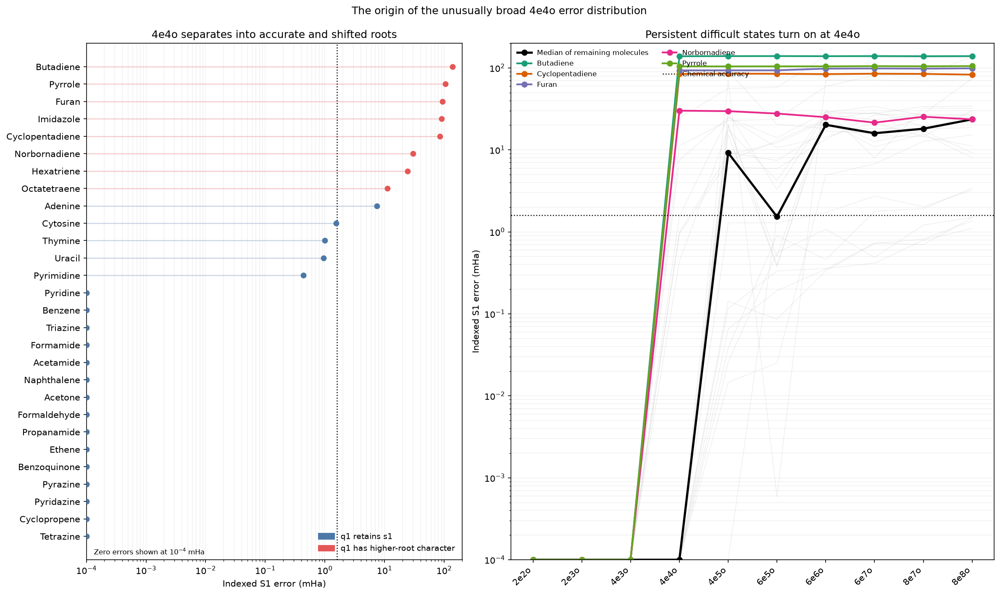

In [25]:
df_4e4o_roots = df_q1_root_matching.loc[
    df_q1_root_matching['active_space'].eq('4e4o')
].sort_values('s1_error')
df_4e4o_roots['root_group'] = np.where(
    df_4e4o_roots['q1_exact_root'].eq('s1'), 'q1 retains s1', 'q1 has higher-root character'
)
df_4e4o_split = df_4e4o_roots.groupby('root_group').agg(
    molecules=('molecule', 'size'), median_error_mHa=('s1_error', 'median'),
    q1_error_iqr_mHa=('s1_error', lambda values: values.quantile(.75) - values.quantile(.25)),
)
display(df_4e4o_split.style.format('{:.3f}').set_caption('The two 4e4o S1 populations'))

ERROR_PLOT_FLOOR_MHA = 1e-4
figure, axes = plt.subplots(1, 2, figsize=(16, 9.5), gridspec_kw={'width_ratios': [1.05, 1.35]})
root_colors = {'q1 retains s1': '#4C78A8', 'q1 has higher-root character': '#E45756'}
positions = np.arange(len(df_4e4o_roots))
for position, (_, row) in zip(positions, df_4e4o_roots.iterrows()):
    color = root_colors[row['root_group']]
    plot_error = max(row['s1_error'], ERROR_PLOT_FLOOR_MHA)
    axes[0].hlines(position, ERROR_PLOT_FLOOR_MHA, plot_error, color=color, alpha=0.30, linewidth=1.2)
    axes[0].scatter(plot_error, position, color=color, s=32, zorder=3)
axes[0].axvline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.2)
axes[0].set_xscale('log')
axes[0].set_xlim(ERROR_PLOT_FLOOR_MHA, 200)
axes[0].set_yticks(positions, df_4e4o_roots['molecule'])
axes[0].set_xlabel('Indexed S1 error (mHa)')
axes[0].set_title('4e4o separates into accurate and shifted roots')
axes[0].text(0.02, 0.01, 'Zero errors shown at $10^{-4}$ mHa', transform=axes[0].transAxes, fontsize=8)
axes[0].grid(axis='x', which='both', alpha=0.18)
axes[0].legend(
    handles=[Patch(color=color, label=label) for label, color in root_colors.items()],
    loc='lower right', frameon=False, fontsize=9,
)

df_s1_trajectories = df_low_state_metrics.loc[df_low_state_metrics['state'].eq('s1')].copy()
space_positions = np.arange(len(active_spaces))
other_molecules = [
    molecule for molecule in MOLECULE_NAMES
    if molecule not in PERSISTENT_REORDERING_MOLECULES
]
for molecule in other_molecules:
    values = (df_s1_trajectories.loc[df_s1_trajectories['molecule'].eq(molecule)]
              .set_index('active_space').reindex(active_spaces)['error_mHa'])
    axes[1].plot(space_positions, values.clip(lower=ERROR_PLOT_FLOOR_MHA),
                 color='#B8B8B8', alpha=0.22, linewidth=0.8)
median_other = (df_s1_trajectories.loc[df_s1_trajectories['molecule'].isin(other_molecules)]
                .groupby('active_space')['error_mHa'].median().reindex(active_spaces))
axes[1].plot(space_positions, median_other.clip(lower=ERROR_PLOT_FLOOR_MHA),
             color='black', linewidth=2.5, marker='o',
             label='Median of remaining molecules')
persistent_colors = dict(zip(PERSISTENT_REORDERING_MOLECULES, plt.cm.Dark2.colors))
for molecule in PERSISTENT_REORDERING_MOLECULES:
    values = (df_s1_trajectories.loc[df_s1_trajectories['molecule'].eq(molecule)]
              .set_index('active_space').reindex(active_spaces)['error_mHa'])
    axes[1].plot(space_positions, values.clip(lower=ERROR_PLOT_FLOOR_MHA),
                 color=persistent_colors[molecule],
                 linewidth=2.0, marker='o', label=molecule)
axes[1].axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.2,
                label='Chemical accuracy')
axes[1].set_yscale('log')
axes[1].set_ylim(ERROR_PLOT_FLOOR_MHA, 200)
axes[1].set_xticks(space_positions, active_spaces, rotation=45, ha='right')
axes[1].set_ylabel('Indexed S1 error (mHa)')
axes[1].set_title('Persistent difficult states turn on at 4e4o')
axes[1].grid(axis='y', which='both', alpha=0.18)
axes[1].legend(loc='upper left', frameon=False, fontsize=8, ncol=2)

figure.suptitle('The origin of the unusually broad 4e4o error distribution', y=0.99)
figure.tight_layout()
show_scrollable_figs([figure])


### 2. Active spaces switch correlation channels on and off

The active spaces are HOMO-centred but not nested at every step. `4e5o` adds a higher virtual orbital to `4e4o`, whereas `6e5o` adds a deeper occupied orbital and drops that highest virtual; `6e6o` contains both. Benzene is therefore a particularly clean demonstration: its S1 error turns on at `4e5o`, nearly vanishes at `6e5o`, and returns at `6e6o`. Imidazole shows the occupied-side analogue: its large `4e4o`/`4e5o` error drops when the N-dominated HOMO-2 orbital enters at `6e5o`. Naphthalene shows the smoother limit, where non-single character accumulates as the window broadens.

This supports an orbital-window mechanism. It does **not** prove that the same named orbital pair controls every molecule; that stronger statement would require state-resolved natural-transition-orbital analysis.


Imidazole HOMO-2 Lowdin weight on N atoms: 84.2%



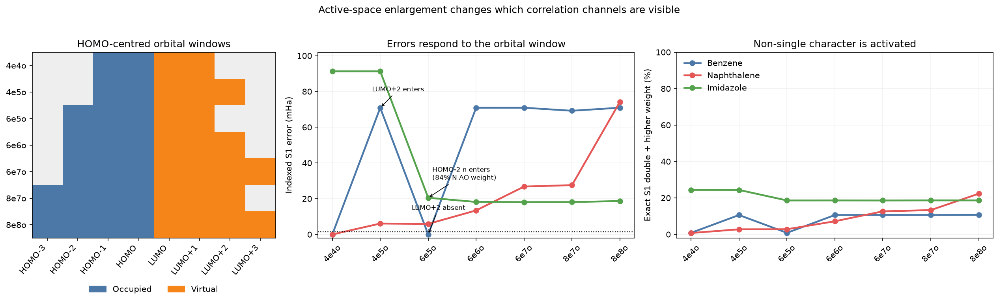

In [26]:
WINDOW_SPACES = active_spaces[active_spaces.index('4e4o'):]
ORBITAL_OFFSETS = np.arange(-3, 5)
window_matrix = np.full((len(WINDOW_SPACES), len(ORBITAL_OFFSETS)), np.nan)

for row_index, active_space in enumerate(WINDOW_SPACES):
    num_electrons, num_orbitals = parse_active_space(active_space)
    num_occupied = num_electrons // 2
    occupied_offsets = range(-(num_occupied - 1), 1)
    virtual_offsets = range(1, num_orbitals - num_occupied + 1)
    for offset in occupied_offsets:
        window_matrix[row_index, np.where(ORBITAL_OFFSETS == offset)[0][0]] = 0
    for offset in virtual_offsets:
        window_matrix[row_index, np.where(ORBITAL_OFFSETS == offset)[0][0]] = 1

def format_orbital_offset(offset):
    if offset == 0:
        return 'HOMO'
    if offset < 0:
        return f'HOMO{offset}'
    return 'LUMO' if offset == 1 else f'LUMO+{offset - 1}'

qibo_imidazole = load_qibo_mol('Imidazole', '6e5o')
mf_imidazole = load_pyscf_mol('Imidazole', '6e5o')
overlap_values, overlap_vectors = np.linalg.eigh(mf_imidazole.get_ovlp())
overlap_sqrt = (overlap_vectors * np.sqrt(overlap_values)) @ overlap_vectors.T
lowdin_coefficients = overlap_sqrt @ mf_imidazole.mo_coeff
nitrogen_aos = np.array([label[1] == 'N' for label in mf_imidazole.mol.ao_labels(fmt=False)])
homo_minus_two = qibo_imidazole.nalpha - 3
imidazole_homo_minus_two_n_weight = (
    100 * np.sum(np.abs(lowdin_coefficients[nitrogen_aos, homo_minus_two]) ** 2)
)
print(f'Imidazole HOMO-2 Lowdin weight on N atoms: {imidazole_homo_minus_two_n_weight:.1f}%')

figure, axes = plt.subplots(1, 3, figsize=(17, 5.3), gridspec_kw={'width_ratios': [1.0, 1.3, 1.3]})
window_cmap = ListedColormap(['#4C78A8', '#F58518'])
window_cmap.set_bad('#EEEEEE')
axes[0].imshow(window_matrix, aspect='auto', cmap=window_cmap, vmin=0, vmax=1)
axes[0].set_xticks(range(len(ORBITAL_OFFSETS)), [format_orbital_offset(x) for x in ORBITAL_OFFSETS],
                  rotation=50, ha='right')
axes[0].set_yticks(range(len(WINDOW_SPACES)), WINDOW_SPACES)
axes[0].set_title('HOMO-centred orbital windows')
axes[0].legend(handles=[Patch(color='#4C78A8', label='Occupied'),
                        Patch(color='#F58518', label='Virtual')],
               loc='lower center', bbox_to_anchor=(0.5, -0.34), ncol=2, frameon=False)

case_molecules = ['Benzene', 'Naphthalene', 'Imidazole']
case_colors = dict(zip(case_molecules, ('#4C78A8', '#E45756', '#54A24B')))
for molecule in case_molecules:
    case = (df_story_states.loc[
        df_story_states['molecule'].eq(molecule) & df_story_states['state'].eq('s1')
    ].set_index('active_space').reindex(WINDOW_SPACES))
    axes[1].plot(WINDOW_SPACES, case['error_mHa'], marker='o', linewidth=2.2,
                 color=case_colors[molecule], label=molecule)
    axes[2].plot(WINDOW_SPACES, case['non_single'], marker='o', linewidth=2.2,
                 color=case_colors[molecule], label=molecule)
axes[1].axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.1)
axes[1].annotate('LUMO+2 enters', xy=('4e5o', 70.9), xytext=(-10, 20),
                 textcoords='offset points', fontsize=8, arrowprops={'arrowstyle': '->', 'lw': .8})
axes[1].annotate('LUMO+2 absent', xy=('6e5o', 0.001), xytext=(-20, 30),
                 textcoords='offset points', fontsize=8, arrowprops={'arrowstyle': '->', 'lw': .8})
axes[1].annotate(
    f'HOMO-2 n enters\n({imidazole_homo_minus_two_n_weight:.0f}% N AO weight)',
    xy=('6e5o', 20.5), xytext=(5, 22),
                 textcoords='offset points', fontsize=8, arrowprops={'arrowstyle': '->', 'lw': .8})
axes[1].set_ylim(-2, 102)
axes[1].set_ylabel('Indexed S1 error (mHa)')
axes[1].set_title('Errors respond to the orbital window')
axes[2].set_ylim(-2, 100)
axes[2].set_ylabel('Exact S1 double + higher weight (%)')
axes[2].set_title('Non-single character is activated')
for axis in axes[1:]:
    axis.tick_params(axis='x', rotation=45)
    axis.grid(alpha=0.18)
axes[2].legend(loc='upper left', frameon=False)
figure.suptitle('Active-space enlargement changes which correlation channels are visible', y=1.02)
figure.tight_layout()
show_scrollable_figs([figure])


### 3. Simple one-bond systems are usually robust, with molecule-specific exceptions

The eight molecules with one formal double bond provide a useful control group. Their median S1 error stays below 5 mHa throughout the available active spaces, and Acetamide remains within chemical accuracy. This is consistent with a low-lying $n\rightarrow\pi^*$ state that is well aligned with a singles response. It is not true that every member remains chemically accurate: Cytosine and Ethene become important exceptions in the widest spaces.

For Ethene, the Lowdin decomposition below shows that several additional active MOs are H-rich $\sigma/\sigma^*$ combinations rather than a pure extension of the $\pi$ manifold. This is a plausible explanation for why the nominally simplest alkene does not follow Acetamide, but it remains a hypothesis until tested by explicitly freezing or selecting those orbitals.



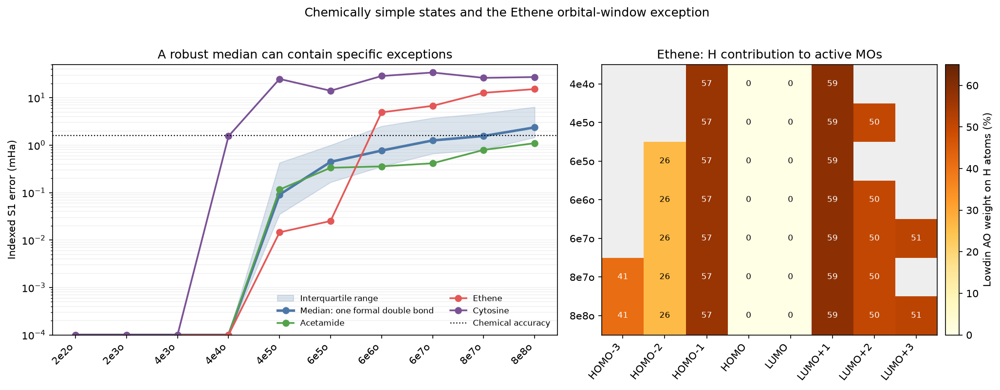

In [27]:
one_double_molecules = df_story_bonds.loc[
    df_story_bonds['formal_double_bonds'].eq(1), 'molecule'
].tolist()
df_one_double = df_story_states.loc[
    df_story_states['state'].eq('s1') & df_story_states['molecule'].isin(one_double_molecules)
]
one_double_summary = df_one_double.groupby('active_space')['error_mHa'].agg(
    median='median', q1=lambda values: values.quantile(.25), q3=lambda values: values.quantile(.75)
).reindex(active_spaces)

ethene_h_character = np.full((len(WINDOW_SPACES), len(ORBITAL_OFFSETS)), np.nan)
for row_index, active_space in enumerate(WINDOW_SPACES):
    qibo_molecule = load_qibo_mol('Ethene', active_space)
    mf_ethene = load_pyscf_mol('Ethene', active_space)
    overlap_values, overlap_vectors = np.linalg.eigh(mf_ethene.get_ovlp())
    overlap_sqrt = (overlap_vectors * np.sqrt(overlap_values)) @ overlap_vectors.T
    lowdin_coefficients = overlap_sqrt @ mf_ethene.mo_coeff
    ao_labels = mf_ethene.mol.ao_labels(fmt=False)
    hydrogen_aos = np.array([label[1] == 'H' for label in ao_labels])
    homo = qibo_molecule.nalpha - 1
    for mo_index in qibo_molecule.active:
        offset = mo_index - homo
        column = np.where(ORBITAL_OFFSETS == offset)[0]
        if len(column):
            ethene_h_character[row_index, column[0]] = (
                100 * np.sum(np.abs(lowdin_coefficients[hydrogen_aos, mo_index]) ** 2)
            )

figure, axes = plt.subplots(1, 2, figsize=(14, 5.2), gridspec_kw={'width_ratios': [1.25, 1]})
x = np.arange(len(active_spaces))
axes[0].fill_between(x, one_double_summary['q1'].clip(lower=ERROR_PLOT_FLOOR_MHA),
                     one_double_summary['q3'].clip(lower=ERROR_PLOT_FLOOR_MHA),
                     color='#4C78A8', alpha=0.20, label='Interquartile range')
axes[0].plot(x, one_double_summary['median'].clip(lower=ERROR_PLOT_FLOOR_MHA),
             color='#4C78A8', marker='o', linewidth=2.5,
             label='Median: one formal double bond')
for molecule, color in (('Acetamide', '#54A24B'), ('Ethene', '#E45756'), ('Cytosine', '#7A5195')):
    values = (df_one_double.loc[df_one_double['molecule'].eq(molecule)]
              .set_index('active_space').reindex(active_spaces)['error_mHa'])
    axes[0].plot(x, values.clip(lower=ERROR_PLOT_FLOOR_MHA),
                 color=color, marker='o', linewidth=1.7, label=molecule)
axes[0].axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.1,
                label='Chemical accuracy')
axes[0].set_yscale('log')
axes[0].set_ylim(ERROR_PLOT_FLOOR_MHA, 50)
axes[0].set_xticks(x, active_spaces, rotation=45, ha='right')
axes[0].set_ylabel('Indexed S1 error (mHa)')
axes[0].set_title('A robust median can contain specific exceptions')
axes[0].legend(frameon=False, fontsize=8, ncol=2)
axes[0].grid(axis='y', which='both', alpha=0.18)

ethene_cmap = plt.get_cmap('YlOrBr').copy()
ethene_cmap.set_bad('#EEEEEE')
image = axes[1].imshow(ethene_h_character, aspect='auto', cmap=ethene_cmap, vmin=0, vmax=65)
axes[1].set_xticks(range(len(ORBITAL_OFFSETS)), [format_orbital_offset(x) for x in ORBITAL_OFFSETS],
                  rotation=50, ha='right')
axes[1].set_yticks(range(len(WINDOW_SPACES)), WINDOW_SPACES)
axes[1].set_title('Ethene: H contribution to active MOs')
for row_index in range(ethene_h_character.shape[0]):
    for column_index in range(ethene_h_character.shape[1]):
        value = ethene_h_character[row_index, column_index]
        if np.isfinite(value):
            axes[1].text(column_index, row_index, f'{value:.0f}', ha='center', va='center',
                         fontsize=8, color='white' if value > 35 else 'black')
colorbar = figure.colorbar(image, ax=axes[1], pad=0.02)
colorbar.set_label('Lowdin AO weight on H atoms (%)')
figure.suptitle('Chemically simple states and the Ethene orbital-window exception', y=1.02)
figure.tight_layout()
show_scrollable_figs([figure])


### 4. Why the low triplets are easier

Across this closed-shell benchmark, exact T1 and T2 states carry less double-excitation weight than exact S1 states. Their paired-double contribution is numerically zero under the present determinant classification, as expected because a closed-shell pair transfer has singlet spin symmetry. The remaining triplet doubles are mixed/open-shell contributions. The singles response pool is therefore much better aligned with the dominant triplet character.

The result is relative, not absolute: triplet median errors are lower than S1 errors, but the `6e6o` medians remain around 3 mHa and therefore just outside the 1.594 mHa chemical-accuracy target.



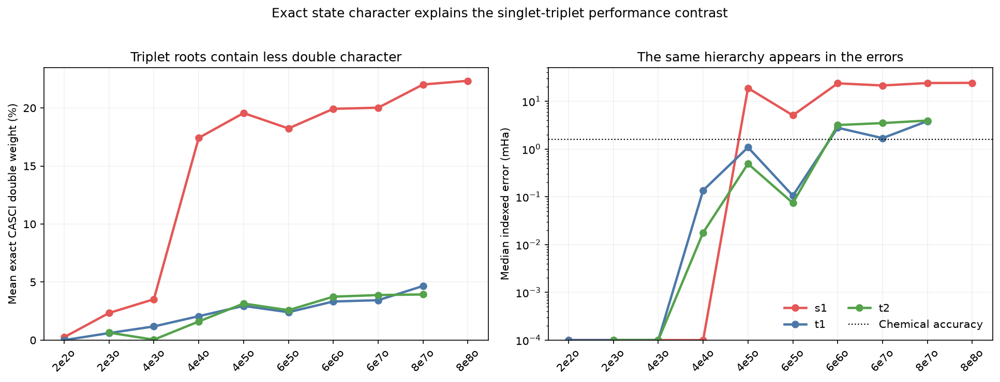

,mean_doubles,median_error
state,,
s1,19.92,23.691
t1,3.33,2.786
t2,3.74,3.174


In [28]:
state_order = ['s1', 't1', 't2']
state_colors = {'s1': '#E45756', 't1': '#4C78A8', 't2': '#54A24B'}
state_summary = (df_story_states.groupby(['active_space', 'state'])
                 .agg(mean_doubles=('doubles', 'mean'), median_error=('error_mHa', 'median'))
                 .reset_index())

figure, axes = plt.subplots(1, 2, figsize=(13, 4.8))
for state in state_order:
    values = state_summary.loc[state_summary['state'].eq(state)].set_index('active_space').reindex(active_spaces)
    axes[0].plot(active_spaces, values['mean_doubles'], color=state_colors[state], marker='o',
                 linewidth=2.2, label=state)
    axes[1].plot(active_spaces, values['median_error'].clip(lower=ERROR_PLOT_FLOOR_MHA),
                 color=state_colors[state], marker='o',
                 linewidth=2.2, label=state)
axes[0].set_ylabel('Mean exact CASCI double weight (%)')
axes[0].set_title('Triplet roots contain less double character')
axes[0].set_ylim(bottom=0)
axes[1].axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.1,
                label='Chemical accuracy')
axes[1].set_yscale('log')
axes[1].set_ylim(ERROR_PLOT_FLOOR_MHA, 50)
axes[1].set_ylabel('Median indexed error (mHa)')
axes[1].set_title('The same hierarchy appears in the errors')
for axis in axes:
    axis.tick_params(axis='x', rotation=45)
    axis.grid(alpha=0.18)
axes[1].legend(frameon=False, ncol=2)
figure.suptitle('Exact state character explains the singlet-triplet performance contrast', y=1.02)
figure.tight_layout()
show_scrollable_figs([figure])

df_6e6o_state_summary = state_summary.loc[state_summary['active_space'].eq('6e6o')].copy()
display(df_6e6o_state_summary.set_index('state')[['mean_doubles', 'median_error']].style.format({
    'mean_doubles': '{:.2f}', 'median_error': '{:.3f}',
}).set_caption('6e6o UCCSD state-character summary'))


### 5. Selected doubles are an intervention, not merely a correlation

Adding six selected double-response operators directly tests the missing-response explanation at `6e6o`. The largest improvements occur among the severe $\pi\rightarrow\pi^*$ failures, including the five persistent root-insertion examples. Their mean S1 error falls from about 90.1 to 1.45 mHa, a 98.4% reduction. Several roots reach chemical accuracy, while Butadiene and Furan remain slightly above it.

This is both encouraging and incomplete. A small chemically targeted pool can rescue catastrophic failures, but it does not make every low-lying root chemically accurate. Wider active spaces activate mixed and higher-order response channels as well, so operator-pool design must scale with the correlations exposed by the active space.


,orbital_type,num_molecules,median_singles_error,median_selected_error,accurate_singles_percent,accurate_selected_percent
0,n->pi*,14,19.202,17.598,35.7%,35.7%
1,pi->pi*,13,59.515,13.432,0.0%,23.1%
2,sigma->pi*,1,1.716,1.716,0.0%,0.0%


Persistent five: 90.058 -> 1.454 mHa (98.4% reduction)



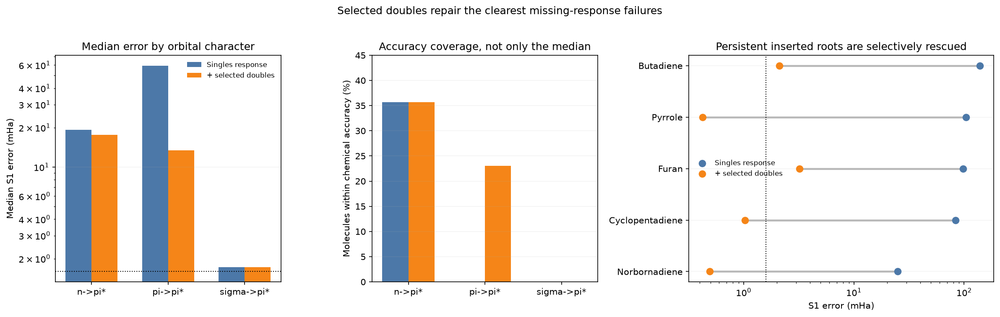

In [29]:
transition_order = [
    transition for transition in ('n->pi*', 'pi->pi*', 'sigma->pi*')
    if transition in set(df_selected_doubles['orbital_type'])
]
selected_summary_rows = []
for transition in transition_order:
    group = df_selected_doubles.loc[df_selected_doubles['orbital_type'].eq(transition)]
    selected_summary_rows.append({
        'orbital_type': transition, 'num_molecules': len(group),
        'median_singles_error': group['s1_standard_error'].median(),
        'median_selected_error': group['s1_selected_error'].median(),
        'accurate_singles_percent': 100 * group['s1_standard_error'].le(CHEMICAL_ACCURACY_MHA).mean(),
        'accurate_selected_percent': 100 * group['s1_selected_error'].le(CHEMICAL_ACCURACY_MHA).mean(),
    })
df_selected_doubles_summary = pd.DataFrame(selected_summary_rows)
display(df_selected_doubles_summary.style.format({
    'median_singles_error': '{:.3f}', 'median_selected_error': '{:.3f}',
    'accurate_singles_percent': '{:.1f}%', 'accurate_selected_percent': '{:.1f}%',
}).set_caption('Selected-double response by exact S1 orbital character'))

figure, axes = plt.subplots(1, 3, figsize=(16, 4.9), gridspec_kw={'width_ratios': [1, 1, 1.35]})
positions = np.arange(len(transition_order))
width = 0.34
for offset, column, label, color in (
    (-width / 2, 'median_singles_error', 'Singles response', '#4C78A8'),
    (width / 2, 'median_selected_error', '+ selected doubles', '#F58518'),
):
    axes[0].bar(positions + offset, df_selected_doubles_summary[column], width=width,
                color=color, label=label)
axes[0].axhline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.0)
axes[0].set_yscale('log')
axes[0].set_xticks(positions, transition_order)
axes[0].set_ylabel('Median S1 error (mHa)')
axes[0].set_title('Median error by orbital character')
axes[0].legend(frameon=False, fontsize=8)

for offset, column, label, color in (
    (-width / 2, 'accurate_singles_percent', 'Singles response', '#4C78A8'),
    (width / 2, 'accurate_selected_percent', '+ selected doubles', '#F58518'),
):
    axes[1].bar(positions + offset, df_selected_doubles_summary[column], width=width,
                color=color, label=label)
axes[1].set_xticks(positions, transition_order)
axes[1].set_ylim(0, 45)
axes[1].set_ylabel('Molecules within chemical accuracy (%)')
axes[1].set_title('Accuracy coverage, not only the median')

persistent_rescue = (df_selected_doubles.set_index('molecule')
                     .loc[PERSISTENT_REORDERING_MOLECULES].sort_values('s1_standard_error'))
persistent_mean_standard = persistent_rescue['s1_standard_error'].mean()
persistent_mean_selected = persistent_rescue['s1_selected_error'].mean()
persistent_reduction = 100 * (1 - persistent_mean_selected / persistent_mean_standard)
print(
    f'Persistent five: {persistent_mean_standard:.3f} -> {persistent_mean_selected:.3f} mHa '
    f'({persistent_reduction:.1f}% reduction)'
)
y = np.arange(len(persistent_rescue))
for position, (_, row) in zip(y, persistent_rescue.iterrows()):
    axes[2].plot([row['s1_selected_error'], row['s1_standard_error']], [position, position],
                 color='#B8B8B8', linewidth=2.2)
axes[2].scatter(persistent_rescue['s1_standard_error'], y, color='#4C78A8', s=55,
                label='Singles response', zorder=3)
axes[2].scatter(persistent_rescue['s1_selected_error'], y, color='#F58518', s=55,
                label='+ selected doubles', zorder=3)
axes[2].axvline(CHEMICAL_ACCURACY_MHA, color='black', linestyle=':', linewidth=1.0)
axes[2].set_xscale('log')
axes[2].set_yticks(y, persistent_rescue.index)
axes[2].set_xlabel('S1 error (mHa)')
axes[2].set_title('Persistent inserted roots are selectively rescued')
axes[2].legend(frameon=False, fontsize=8)
for axis in axes:
    axis.grid(axis='y', alpha=0.14)
figure.suptitle('Selected doubles repair the clearest missing-response failures', y=1.02)
figure.tight_layout()
show_scrollable_figs([figure])


### Overall interpretation

The unifying mechanism is **differential response completeness**. The exact active-space problem gains new configurations whenever occupied or virtual orbitals enter the window, but a singles-only QSE calculation gains only additional one-electron response directions. States dominated by those directions, including many $n\rightarrow\pi^*$ singlets and low triplets, remain comparatively robust. Multiconfigurational singlets gain pair-transfer, mixed-double, and higher-order character that the pool cannot follow.

At `4e4o`, this mismatch first becomes chemically consequential but remains selective, creating the striking mixture of near-exact and catastrophic errors. In the most severe cases, exact S1 is displaced so strongly that an S2-like state becomes `q1`; in less severe cases the root identity remains correct but its energy and wavefunction are already shifted. Wider spaces make the mismatch more general rather than introducing a fundamentally new failure.

The selected-double result supplies the strongest causal evidence: changing the response pool repairs precisely the severe double-rich failures. It also defines the remaining research question. Selected pair-transfer operators are enough to rescue several catastrophic $\pi\rightarrow\pi^*$ states, but chemical accuracy across larger spaces will require operator selection that captures mixed doubles and, eventually, higher response without losing the measurement and conditioning advantages that motivate QSE.
